In [ ]:
import os
os.chdir("/Users/bhagy/Downloads/data/")

In [ ]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [ ]:
#Style Dictionary to standarize plotting scheme between different python scripts 
import matplotlib.pyplot as plt

styledict = {'xtick.labelsize':20,
             'xtick.major.size':9,
             'xtick.major.width':1,
             'ytick.labelsize':20,
             'ytick.major.size':9,
             'ytick.major.width':1,
             'legend.framealpha':0.0,
             'legend.fontsize':15,
             'axes.labelsize':20,
             'axes.titlesize':25,
             'axes.linewidth':2,
             'figure.figsize':(12,8),
             'savefig.format':'jpg'}
plt.rcParams.update(**styledict)

In [ ]:
#Function that creates personalized discrete Colormap
import numpy as np 
from matplotlib import cm as cm1
from matplotlib.colors import ListedColormap, to_rgba

def newColMap(colors):
    """
    This function creates a new color map from a list of colors given
    as a parameter. Recommended length of list of colors is at least 6.
    """
    first = np.repeat([to_rgba(colors[0])], 2, axis = 0)
    last = np.repeat([to_rgba(colors[-1])], 2, axis = 0)
    v = cm1.get_cmap('viridis', 16*(len(colors)-2))
    newcolors = v(np.linspace(0, 1, 16*(len(colors)-2)))
    for (i, col) in enumerate(colors[1:-1]):
        newcolors[16*i : 16*(i+1), :] = to_rgba(col)
    return ListedColormap(np.append(np.append(first,newcolors, axis=0), last, axis=0))


In [ ]:
import numpy as np 
import matplotlib.pyplot as plt
from matplotlib.colors import rgb2hex
from matplotlib.patches import Polygon
import matplotlib.mlab as mlab
import pandas as pd

from mpl_toolkits import mplot3d

import netCDF4 as nc
from netCDF4 import Dataset as ds

from urllib import request
import scipy as sp
from scipy import stats as stt
from sklearn import datasets, linear_model
from sklearn.neighbors import KernelDensity as kd
from sklearn.linear_model import LinearRegression
from random import randint
from scipy.stats import norm
import statsmodels
import sklearn
import math
import statistics
import sympy as sy
from sympy import symbols, diff
import statsmodels.api as sm
from datetime import date

In [ ]:
# NetCDF file

import netCDF4 as nc
#fn = '/path/to/file.nc4'

file = '/Users/bhagy/Downloads/data/data/air.mon.mean.nc'
# C:/Users/bhagy/Downloads/data/data/air.mon.mean.nc
    
data = nc.Dataset(file)

#file = "air.mon.mean.nc"
#data = ds(file,"r+")

___________________
# Chapter 3: Basic Statistical Methods for Climate Data Analysis
_____________________

In [ ]:
import numpy as np 
import matplotlib.pyplot as plt
from matplotlib.colors import rgb2hex
from matplotlib.patches import Polygon
import matplotlib.mlab as mlab
import pandas as pd
from mpl_toolkits.basemap import Basemap
from mpl_toolkits import mplot3d
from netCDF4 import Dataset as ds
from urllib import request
import scipy as sp
from scipy import stats as stt
from sklearn import datasets, linear_model
from sklearn.neighbors import KernelDensity as kd
from sklearn.linear_model import LinearRegression
from random import randint
from scipy.stats import norm
import statsmodels
import sklearn
import math
import statistics
import sympy as sy
from sympy import symbols, diff
import statsmodels.api as sm
from datetime import date
from scipy.stats import norm, kurtosis
from sklearn.linear_model import LinearRegression
import seaborn as sns
import statsmodels.api as sm 
import pylab as py 
from scipy.stats import norm, t
from scipy.integrate import quad
import warnings
warnings.filterwarnings("ignore")

# 3.1: Statistical Indices from Global Temperature Data from 1880 to 2015

In [ ]:
# download the NCEI spatial average time series of monthly data
# https://www1.ncdc.noaa.gov/pub/data/noaaglobaltemp/operational/
# timeseries/aravg.mon.land_ocean.90S.90N.v4.0.1.201702.asc
aveNCEI = pd.read_table('http://shen.sdsu.edu/data/' + 
                        'aravg.mon.land_ocean.90S.90N.v4.0.1.201703.asc.txt', 
                        header = None, delim_whitespace = True)
aveNCEI = aveNCEI.values
aveNCEI

array([[ 1.88000e+03,  1.00000e+00, -2.54882e-01, ...,  1.25049e-01,
         1.18830e-01,  1.50000e-02],
       [ 1.88000e+03,  2.00000e+00, -3.90030e-01, ...,  1.69170e-01,
         8.25840e-02,  8.65860e-02],
       [ 1.88000e+03,  3.00000e+00, -4.14509e-01, ...,  1.28022e-01,
         8.60760e-02,  4.19460e-02],
       ...,
       [ 2.01700e+03,  1.00000e+00,  6.36712e-01, ...,  1.25049e-01,
         1.28754e-01,  1.50000e-02],
       [ 2.01700e+03,  2.00000e+00,  6.96222e-01, ...,  1.69170e-01,
         1.81365e-01,  1.50000e-02],
       [ 2.01700e+03,  3.00000e+00,  7.69576e-01, ...,  1.28022e-01,
         1.61637e-01,  3.36150e-02]])

# Mean, Variance, Standard Deviation, Skewness, Kurtosis, and Quantiles

In [ ]:
# Yields the dimensions of data
aveNCEI.shape 

(1647, 10)

In [ ]:
# Take only the second column of this data matrix 
tmean15 = aveNCEI[:,2]

# Yields the first 6 values
tmean15[:6]

array([-0.254882, -0.39003 , -0.414509, -0.314104, -0.327618, -0.421961])

In [ ]:
# Yields the sample Mean
np.mean(tmean15)

-0.19504468609593198

In [ ]:
# Yields the sample Standard deviation
np.std(tmean15)

0.3289373979136597

In [ ]:
# Yields the sample Variance
np.var(tmean15)

0.10819981174620931

In [ ]:
# Yields the sample Skewness
pd.DataFrame(tmean15).skew()

0    0.657679
dtype: float64

In [ ]:
# Yields the sample Kurtosis
kurtosis(tmean15)

-0.09874723968157051

In [ ]:
# Yields the sample Median
np.median(tmean15)

-0.263387

In [ ]:
# Yields desired quantiles
pd.DataFrame(tmean15).quantile([0, 0.25, 0.5, 0.75, 1])

,0
0.00,-0.934475
0.25,-0.440763
0.50,-0.263387
0.75,0.006320
1.00,0.949248


# Correlation, Covariance, and Linear Trend 

In [ ]:
# Creating a year sequence 
timemo = np.linspace(1880, 2015, 1647)

# Creating Liner Regression 
lm = LinearRegression()

# Training the model
lm.fit(timemo.reshape(-1, 1), tmean15)

# Using the model to make predictions
predictions = lm.predict(timemo.reshape(-1, 1))

print("Coeff of Linear Model:", lm.coef_)
print("Intercept of Linear Model: ", lm.intercept_)

Coeff of Linear Model: [0.00698074]
Intercept of Linear Model:  -13.790040882746423


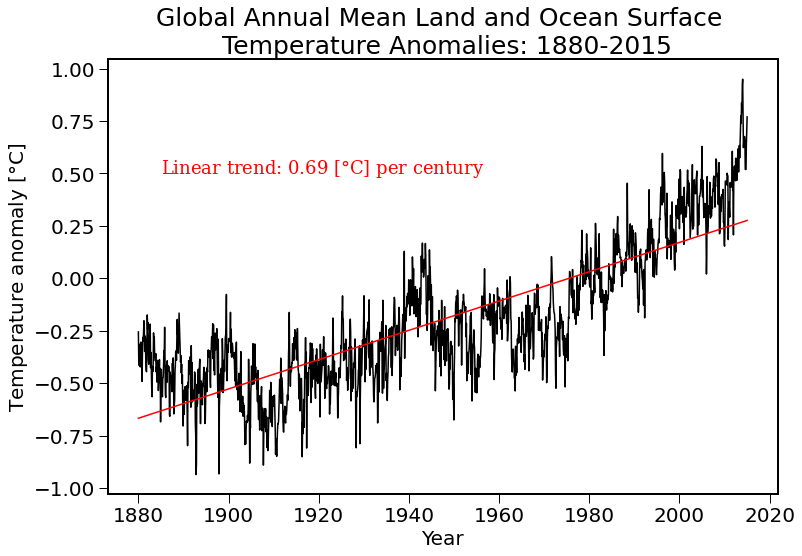

In [ ]:
#Fig 3.1
# Linear Model Visualization
plt.close()

plt.plot(timemo, tmean15, '-', color="black")
plt.title('Global Annual Mean Land and Ocean Surface \n Temperature Anomalies: 1880-2015')
plt.xlabel('Year')
plt.ylabel('Temperature anomaly [$\degree$C]')

plt.plot(timemo, predictions, '-', color="red")
font = {'family': 'serif',
        'color':  'red',
        'weight': 'normal',
        'size': 18,
        }
plt.text(1885, .5, 'Linear trend: 0.69 [$\degree$C] per century', fontdict = font)

plt.show()  

In [ ]:
# Yields the covariance
np.cov(timemo,tmean15)[0][1]

10.621333849840694

In [ ]:
# Yields the correlation
np.corrcoef(timemo,tmean15)[0][1]

0.8275518334843863

In [ ]:
# Verify the correlation result 
x = timemo
y = tmean15
sdx = np.std(x)
sdy = np.std(y)
cxy = np.cov(x,y)
rxy = cxy / (sdx*sdy)
rxy[0][1]

0.8280545988753246

In [ ]:
# Verify the trend result
rxy*sdy/sdx 

array([[1.00060753e+00, 6.98498363e-03],
       [6.98498363e-03, 7.11994446e-05]])

In [ ]:
# Verify the trend result
cxy/(sdx**2)

array([[1.00060753e+00, 6.98498363e-03],
       [6.98498363e-03, 7.11994446e-05]])

# 3.2: Commonly used Statistical Plots

<b> Histogram

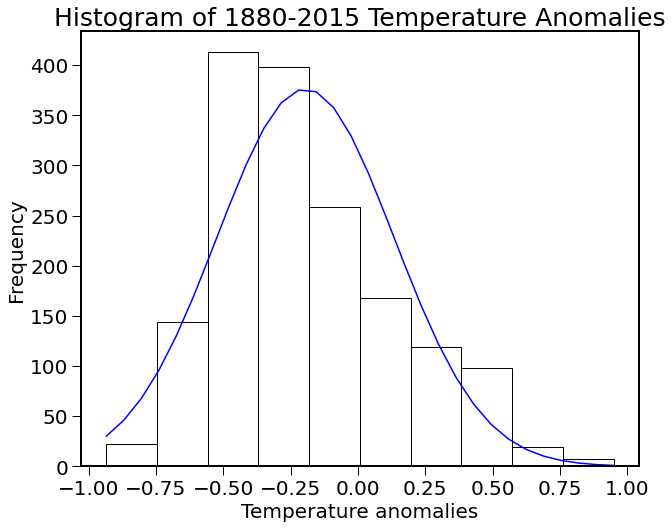

In [ ]:
#Fig 3.2
# Plot a histogram of the tmean15 data
h, mids = np.histogram(tmean15)
xfit = np.linspace(np.min(tmean15),np.max(tmean15),30)

# Set histograms bin width 
areat = (np.diff(mids[0:2])*np.size(tmean15))

# Create the fitter y-values for the normal curve
yfit = areat*(norm.pdf(xfit,np.mean(tmean15),np.std(tmean15)))

plt.figure(figsize=(10,8))

plt.hist(tmean15,facecolor='w',edgecolor="k")

# Plot the normal fit on the histogram
plt.plot(xfit,yfit,color = "blue")

plt.title("Histogram of 1880-2015 Temperature Anomalies")
plt.xlabel("Temperature anomalies")
plt.ylabel("Frequency")

plt.show()


<b> Box Plot

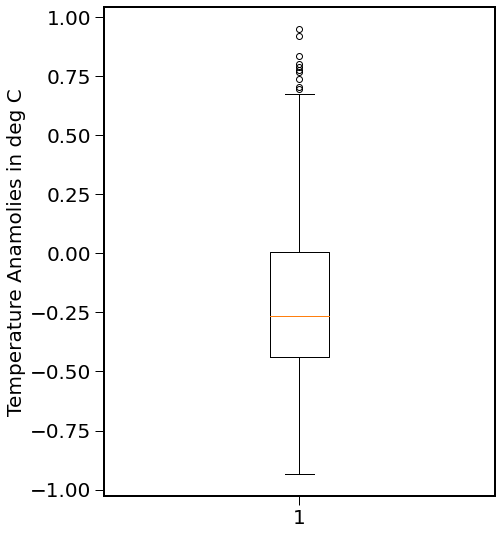

In [ ]:
#Fig 3.3
# Boxplot of the global annual mean temperature anomalies from 1880-2015
plt.figure(figsize=(7, 9))
plt.boxplot(tmean15)
plt.ylabel('Temperature Anamolies in deg C')
plt.show()

<b> Scatter Plot

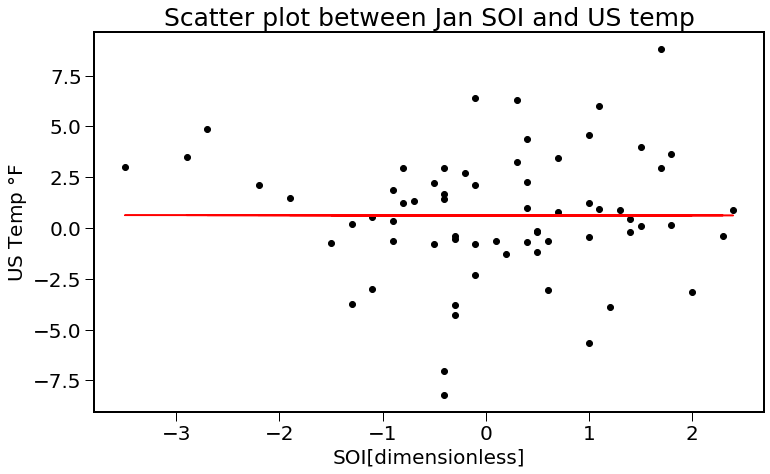

In [ ]:
#Fig 3.4
# Retrieving all necessary data
ust = pd.read_csv('USJantemp1951-2016-nohead.csv'
                  ,header=None)
soi = pd.read_csv('soi-data-nohead.csv'
                  ,header=None)
soid = np.array(soi.iloc[:,1])
soim = np.reshape(soid,(66,12))

# Make the SOI into a matrix with each month as a column 
# Take the first column for January SOI
soij = soim[:,0]

# Take the third column for January US temperature data
ustj = np.array(ust.iloc[:,2])

# Set up figure
plt.figure(figsize=(12,7))

# Create scatter plot
plt.scatter(soij,ustj,color='k')

# Create a linear trendline for the data
lin = np.polyfit(soij, ustj, 1)
linreg = np.poly1d(lin)

plt.plot(soij,linreg(soij),'r')

plt.ylabel('US Temp $\degree$F')
plt.xlabel('SOI[dimensionless]')
plt.title("Scatter plot between Jan SOI and US temp")

plt.show()

<b>Q-Q Plot 

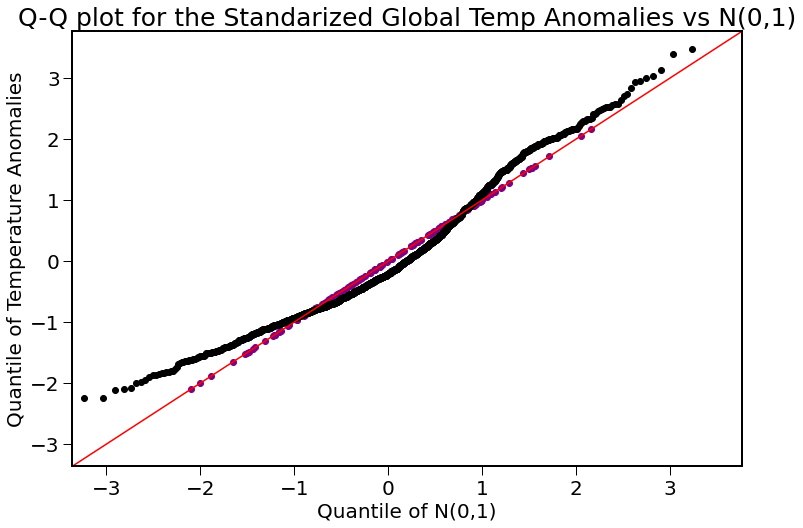

In [ ]:
#Fig 3.5
# Q-Q plot for the standarized temperature anomalies 
tstand = (tmean15-np.mean(tmean15))/np.std(tmean15)

# Simulate 136 points that follow a norm(0,1) distribution
qn = np.random.normal(0,1,136)

# Sort the points
qns = np.sort(qn)

# Create the Q-Q line
sm.qqplot(tstand, line ='45', color="black") 

# Create the Q-Q plot 
py.scatter(qns,qns, color = "purple")

py.title("Q-Q plot for the Standarized Global Temp Anomalies vs N(0,1)")
py.ylabel("Quantile of Temperature Anomalies")
py.xlabel("Quantile of N(0,1)")
py.show()


# 3.3: Probability Distributions 


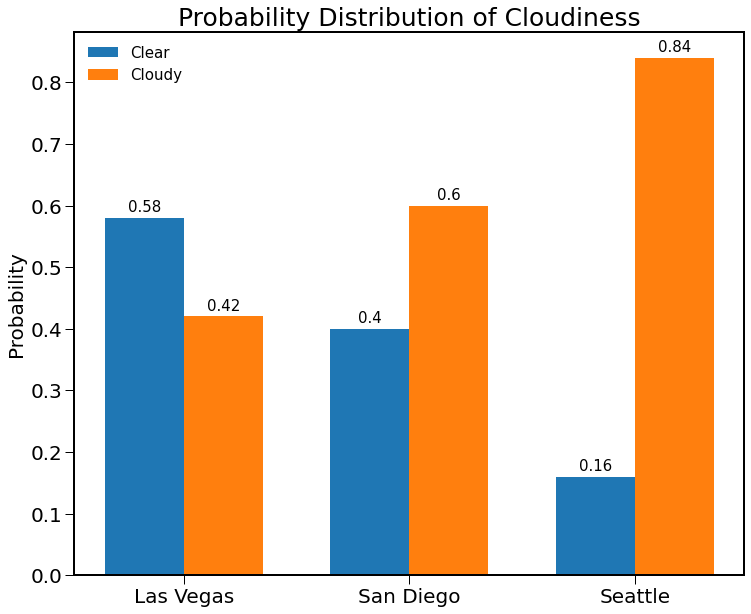

In [ ]:
#Fig 3.6
# Display the different cloudiness climates of three cities
labels = ['Las Vegas', 'San Diego', 'Seattle']
clear = [0.58,0.40,0.16]
cloudy = [0.42,0.6,0.84]

# Create the label locations
x = np.arange(len(labels))  
# Set the width of the bars
width = 0.35  

# Prepare figure
fig, ax = plt.subplots(figsize=(12,10))

# Adding data to figure 
rects1 = ax.bar(x - width/2, clear, width, label='Clear')
rects2 = ax.bar(x + width/2, cloudy, width, label='Cloudy')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Probability')
ax.set_title('Probability Distribution of Cloudiness')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()


# Creating a function to label each rectange with its respective frequency
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=15)

# Labeling each rectangle 
autolabel(rects1)
autolabel(rects2)


plt.show()

<b> PDF of the Standard Normal Distribution

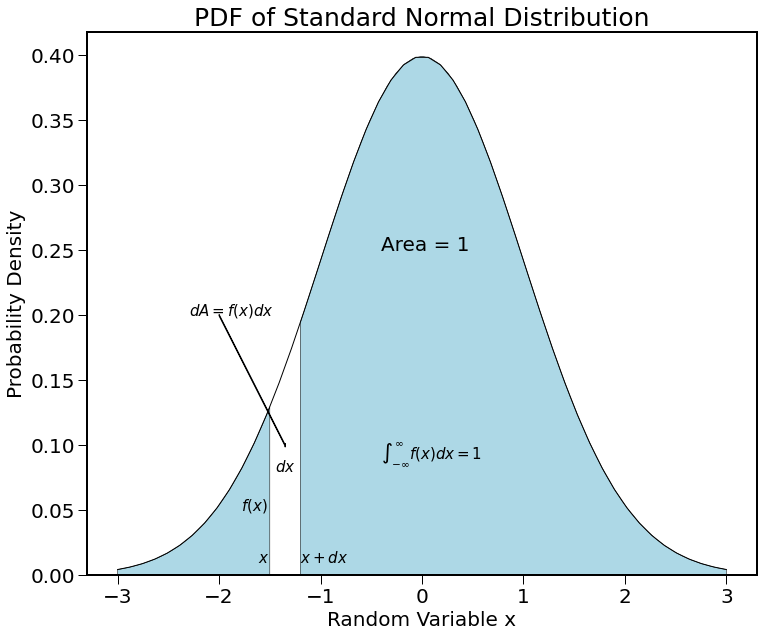

In [ ]:
#Fig 3.7
# Set mu and sigma 
mu=0
sigma=1

# Create normal probability function
def intg(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) *np.exp( - (x - mu)**2 / (2 * sigma**2))

x = np.linspace(-3, 3)
y = intg(x)

# Set up figure
fig, ax = plt.subplots(figsize=(12,10))
ax.plot(x, y, 'black', linewidth=1)
ax.set_ylim(bottom=0)

# Set desired quantities
a_ , b_ = -3,-1.5
a, b = -1.2, 3

# Make the shaded region
ix_ = np.linspace(a_,b_)
ix = np.linspace(a, b)

# Using Integrating function
iy_ = intg(ix_)
iy = intg(ix)

# Creating desired vertical seperations 
verts_ = [(a_, 0), *zip(ix_, iy_), (b_, 0)]
verts = [(a, 0), *zip(ix, iy), (b, 0)]

# Creating desired polygons
poly_ = Polygon(verts_, facecolor='lightblue', edgecolor='black', linewidth=0.5)
poly = Polygon(verts, facecolor='lightblue', edgecolor='black', linewidth=0.5)

# Adding polygon
ax.add_patch(poly_)
ax.add_patch(poly)

ax.text(-0.4,0.25,"Area = 1", fontsize=20)
ax.text(-1.78, .05, "$f(x)$", fontsize=15)
ax.text(-1.62, .01, "$x$", fontsize=15)
ax.text(-1.45, .08, "$dx$", fontsize=15)
ax.text(-1.2, .01, "$x+dx$", fontsize=15)
ax.text(-0.4, .09, '$\int^{\infty}_{-\infty}f(x)dx=1$', fontsize=15)

# Creating desired arrow
plt.arrow(-2,.2,0.65,-0.1)
ax.text(-2.3,0.2,"$dA=f(x)dx$", fontsize=15, fontweight="bold")

# Label figure
plt.title("PDF of Standard Normal Distribution")
plt.xlabel("Random Variable x")
plt.ylabel("Probability Density")

plt.show()

<b> Normal Distribution

Text(0, 0.5, 'Probability Density')

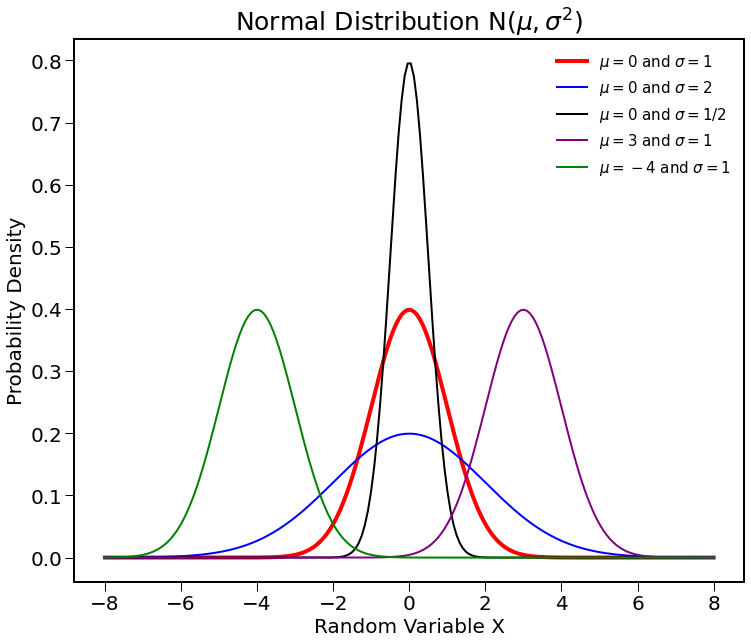

In [ ]:
#Fig 3.8
# Creation of five different normal distributions 
bins = np.linspace(-8,8,200)
mu, sigma = 0,1
y1 = 1/(sigma * np.sqrt(2 * np.pi)) *np.exp( - (bins - mu)**2 / (2 * sigma**2) )
mu, sigma = 0,2
y2 = 1/(sigma * np.sqrt(2 * np.pi)) *np.exp( - (bins - mu)**2 / (2 * sigma**2) )
mu, sigma = 0,1/2
y3 = 1/(sigma * np.sqrt(2 * np.pi)) *np.exp( - (bins - mu)**2 / (2 * sigma**2) )
mu, sigma = 3,1
y4 = 1/(sigma * np.sqrt(2 * np.pi)) *np.exp( - (bins - mu)**2 / (2 * sigma**2) )
mu, sigma = -4,1
y5 = 1/(sigma * np.sqrt(2 * np.pi)) *np.exp( - (bins - mu)**2 / (2 * sigma**2) )


df=pd.DataFrame({'x': bins, 'y1': y1, 'y2': y2, 'y3': y3, 'y4': y4, 'y5': y5})

plt.figure(figsize=(12,10))

# Multiple line plot
plt.plot( 'x', 'y1', data=df, marker='', markerfacecolor='red', markersize=8, color='red'
         , linewidth=4, label="$\mu = 0$ and $\sigma = 1$")
plt.plot( 'x', 'y2', data=df, marker='', color='blue', linewidth=2, label="$\mu = 0$ and $\sigma = 2$")
plt.plot( 'x', 'y3', data=df, marker='', color='black', linewidth=2, label="$\mu = 0$ and $\sigma = 1/2$")
plt.plot( 'x', 'y4', data=df, marker='', color='purple', linewidth=2, label="$\mu = 3$ and $\sigma = 1$")
plt.plot( 'x', 'y5', data=df, marker='', color='green', linewidth=2,  label="$\mu = -4$ and $\sigma = 1$")
plt.legend()
plt.title("Normal Distribution N$(\mu,\sigma^2)$")
plt.xlabel("Random Variable X")
plt.ylabel("Probability Density")

In [ ]:
# Verifying the normal equation
mu=0
sigma=1
def intg(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) *np.exp( - (x - mu)**2 / (2 * sigma**2) )

i = quad(intg, -2, 2)
print("The integral evaluated to:", round(i[0],6), "and the absolute error is:", i[1])

The integral evaluated to: 0.9545 and the absolute error is: 1.8403560456416157e-11


<b> Student's t-distribution

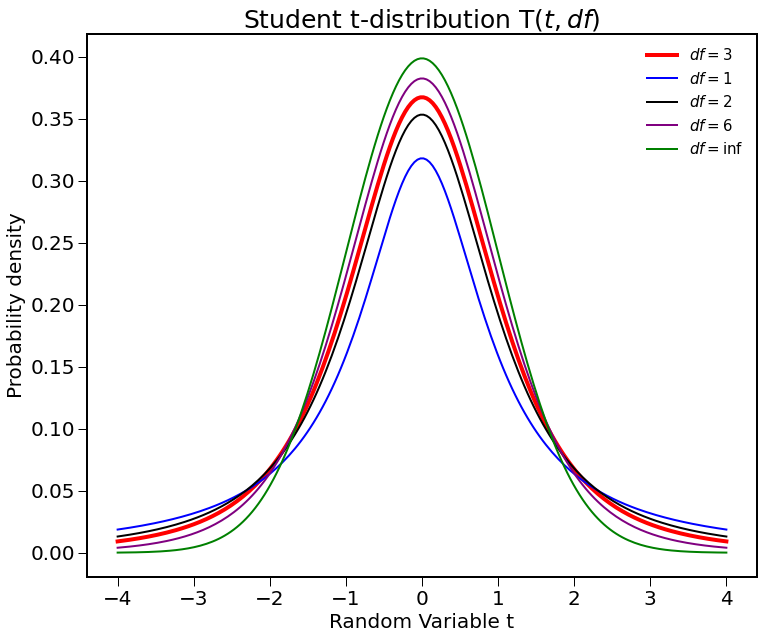

In [ ]:
#Fig 3.9
x = np.linspace(-4,4,200)
# The t function in python dose not allow for using infinity as a prapmeter, so we will use 100 million to 
# simulate the t-distribution with infity degrees of freedom. 
myinf = 100000000

plt.figure(figsize=(12,10))

# Plot the t-distribution with various degrees of freedom
plt.plot(x, t(3).pdf(x),linewidth=4,color="red", label="$df=3$")
plt.plot(x, t(1).pdf(x),linewidth=2,color="blue", label="$df=1$")
plt.plot(x, t(2).pdf(x),linewidth=2,color="black", label="$df=2$")
plt.plot(x, t(6).pdf(x),linewidth=2,color="purple", label="$df=6$")
plt.plot(x, t(myinf).pdf(x),linewidth=2,color="green", label="$df=\inf$")

# Creating legend
plt.legend()

# Labeling plot 
plt.xlabel("Random Variable t")
plt.ylabel("Probability density")
plt.title("Student t-distribution T$(t,df)$")
plt.show()


# 3.4: Estimate and Its Error


In [ ]:
# Confidence interval simulation 
# True mean
mu = 14 

# True sd
sig = 0.3 

# Sample size
n = 50 

d = 1.96*sig/n**(1/2)
lowerlim = mu-d
upperlim = mu+d

# Number of simulations
ksim = 10000  

# Simulation counter
k=0 

xbar = []
for i in range(ksim):
    x = np.mean(np.random.normal(mu,sig,n))
    xbar.append(x)
    if (x >= lowerlim) & (x <= upperlim):
        k = k+1
        
print("Simulation Counter:", k,"and total number of simulations:", ksim)    
print("Lower CI:", round(lowerlim,2),"and upper CI:", round(upperlim,2))   

Simulation Counter: 9481 and total number of simulations: 10000
Lower CI: 13.92 and upper CI: 14.08


95% Confidence Interval (13.92,14.08)


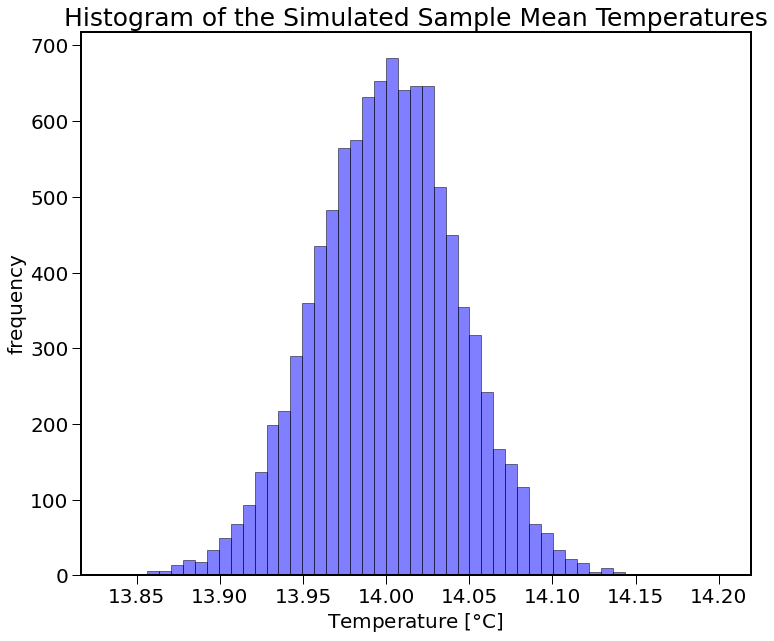

In [ ]:
#Fig 3.10
# Confidence Interval Simulation 
np.random.seed(19680801)
num_bins = 51

# Create histogram with parameters
fig = plt.subplots(figsize=(12,10))
n, bins,patches = plt.hist(xbar,num_bins, color='blue', alpha=0.5, histtype='bar', ec='black')

# Label histogram
plt.title("Histogram of the Simulated Sample Mean Temperatures")
plt.ylabel("frequency")
plt.xlabel("Temperature [$\degree$C]")

# Show the plot with extra information
print("95% Confidence Interval (13.92,14.08)")
plt.show()

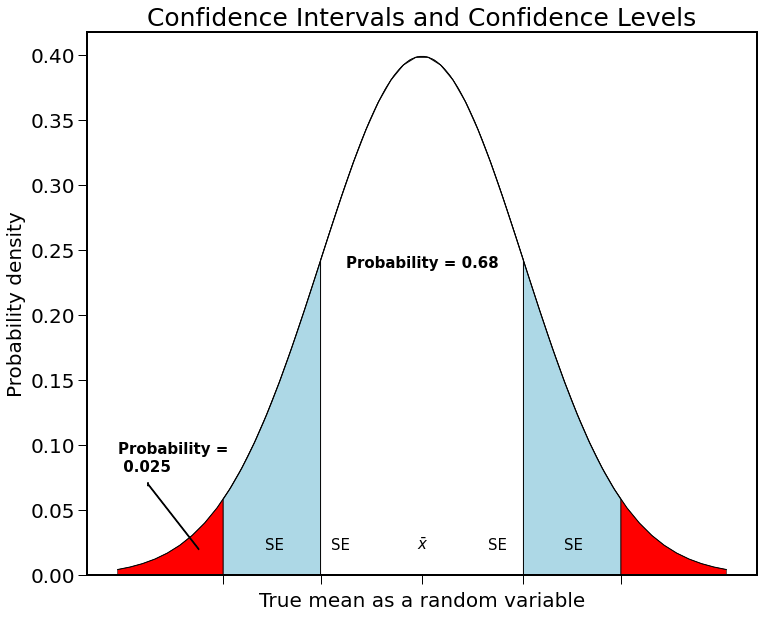

In [ ]:
#Fig 3.11
# Plot confidence intervals and tail probabilities 

# Set mu and sigma 
mu=0
sigma=1

# Create normal probability function
def intg(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) *np.exp( - (x - mu)**2 / (2 * sigma**2) )

# Set desired quantities
a_ , b_ = -3,3
a, b = -1.96, 1.96
a1, b1 = -1.0, 1.0 # integral limits

x = np.linspace(-3, 3)
y = intg(x)

# Set up figure
fig, ax = plt.subplots(figsize=(12,10))
ax.plot(x, y, 'black', linewidth=1)
ax.set_ylim(bottom=0)

# Make the shaded region
ix_ = np.linspace(a_,b_)
ix = np.linspace(a, b)
ix1 = np.linspace(a1, b1)

# Using Integrating function
iy_ = intg(ix_)
iy = intg(ix)
iy1 = intg(ix1)

# Creating desired vertical seperations 
verts_ = [(a_, 0), *zip(ix_, iy_), (b_, 0)]
verts = [(a, 0), *zip(ix, iy), (b, 0)]
verts1 = [(a1, 0), *zip(ix1, iy1), (b1, 0)]

# Creating desired polygons
poly_ = Polygon(verts_, facecolor='red', edgecolor='black', linewidth=0.5)
poly = Polygon(verts, facecolor='lightblue', edgecolor='black')
poly1 = Polygon(verts1, facecolor='white', edgecolor='black')

# Adding polygon
ax.add_patch(poly_)
ax.add_patch(poly)
ax.add_patch(poly1)

# Adding appropriate text
ax.text(0.5 * (a + b), 0.24, "Probability = 0.68",
        horizontalalignment='center', verticalalignment="center", fontsize=15, fontweight="bold")
ax.text(-1.55, .02, "SE", fontsize=15)
ax.text(1.40, .02, "SE", fontsize=15)
ax.text(-0.9, .02, "SE", fontsize=15)
ax.text(0.65, .02, "SE", fontsize=15)
ax.text(-0.05, .02, r'$\bar{x}$', fontsize=15)

# Creating desired arrows
plt.arrow(-2.2,.02,-0.5,0.05)
ax.text(-3,0.08,"Probability = \n 0.025", fontsize=15, fontweight="bold")

# Label the figure
plt.ylabel("Probability density")
plt.xlabel("True mean as a random variable")
plt.title("Confidence Intervals and Confidence Levels")

ax.set_xticks((a,a1,0,b1,b))
ax.set_xticklabels(('','','','',''))

plt.show()

<b>Confidence interval for NOAAGlobalTemp 1880-2015

In [ ]:
# Estimate the mean and error bar for a large sample 
dat1 = pd.read_table('http://shen.sdsu.edu/data/' + 
                        'aravg.mon.land_ocean.90S.90N.v4.0.1.201703.asc.txt', 
                        header = None, delim_whitespace = True)
dat1 = dat1.values
tmean15 = dat1[:,2]
MeanEst = np.mean(tmean15)
sd1 = np.std(tmean15)
StandErr = sd1/(len(tmean15))**(1/2)
ErrorMar = 1.96*StandErr
print("Mean Estimate:", MeanEst, "\n Lower bound:", MeanEst-ErrorMar, "\n Upper bound:", MeanEst+ErrorMar)

Mean Estimate: -0.19504468609593198 
 Lower bound: -0.21093097749081338 
 Upper bound: -0.17915839470105058


<b> Statistical inference for xbar using a z-score

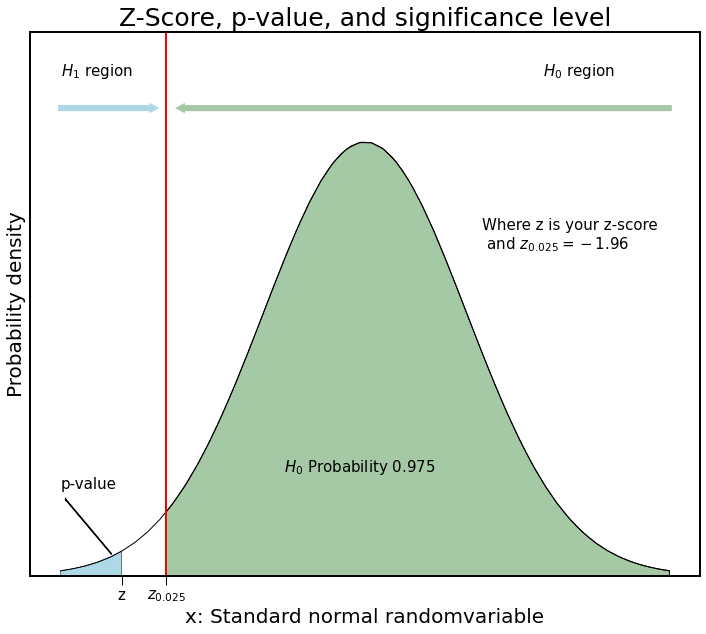

In [ ]:
#Fig 3.12
# Setting mu and sigma
mu=0
sig=1

# Creating normal probability function 
def intg(x):
    return 1/(sig * np.sqrt(2 * np.pi)) *np.exp( - (x - mu)**2 / (2 * sigma**2) )

# Creating desired quantities 
a_ , b_ = -3,-2.4
a, b = -1.96, 3

x = np.linspace(-3, 3)
y = intg(x)

# Creatinf figure
fig, ax = plt.subplots(figsize=(12,10))
ax.plot(x, y, 'black', linewidth=1)
ax.set_ylim(bottom=0)

# Make the shaded region
ix_ = np.linspace(a_,b_)
ix = np.linspace(a, b)

# Integrating apprpriate values
iy_ = intg(ix_)
iy = intg(ix)

# Cerating array of verticle seperations
verts_ = [(a_, 0), *zip(ix_, iy_), (b_, 0)]
verts = [(a, 0), *zip(ix, iy), (b, 0)]

# Creating shaded polygons
poly_ = Polygon(verts_, facecolor='lightblue', edgecolor='black', linewidth=0.5)
poly = Polygon(verts, facecolor='#A4C9A4', edgecolor='black')

# Adding desired polygons
ax.add_patch(poly_)
ax.add_patch(poly)

# Adding text
ax.text(-0.05, 0.1, "$H_0$ Probability 0.975",
        horizontalalignment='center', verticalalignment="center", fontsize=15)

# Creating appropriatly placed arrow
plt.arrow(-2.50,.02,-0.45,0.05)
ax.text(-3,0.08,"p-value", fontsize=15)

# Label plot
plt.ylabel("Probability density")
plt.xlabel("x: Standard normal randomvariable")
plt.title("Z-Score, p-value, and significance level")

plt.ylim((0,.5))

# Set various parameters
ax.set_xticks((b_,a))
ax.set_xticklabels(('z','$z_{0.025}$'),fontsize=15)

ax.text(1.15,0.3,"Where z is your z-score \n and $z_{0.025}=-1.96$", fontsize=15)

ax.set_yticks(())
ax.set_yticklabels((""))

ax.axvline(x=-1.96, linewidth=2, color='r')

plt.arrow(-3,0.43,0.9,0, color="lightblue", linewidth=5, head_width=0.002, head_length=0.02)
plt.text(-3,0.46,"$H_1$ region", fontsize=15)
plt.arrow(3,0.43,-4.8,0, color='#A4C9A4', linewidth=5, head_width=0.002, head_length=0.02)
plt.text(1.75,0.46,"$H_0$ region", fontsize=15)

plt.show()

<b> Mean of a Small Sample Size t-Test

In [ ]:
# Hypothesis testing for NOAAGlobalTemp 2006-2015
dat1 = pd.read_table('http://shen.sdsu.edu/data/' + 
                        'aravg.mon.land_ocean.90S.90N.v4.0.1.201703.asc.txt', 
                        header = None, delim_whitespace = True)
dat1 = dat1.values
tm0615 = dat1[127:136,2]
MeanEst = np.mean(tm0615)
sd1 = np.std(tm0615)
n = 10
t_score = (MeanEst-0)/ (sd1/np.sqrt(n))
print(" Mean:", MeanEst, "\n","SD:",sd1, "\n","t-score:", t_score)

 Mean: -0.5753087777777778 
 SD: 0.08889553942037536 
 t-score: -20.465437383334567


In [ ]:
# Yields the p-value
t.pdf(t_score,df=n-1)

1.5984763823270562e-09

In [ ]:
# Yields the critical t-score
t.ppf(1-0.025,n-1)

2.2621571627409915

<b> Comparing Temperatures of Two Short Periods

In [ ]:
# Hypothesis testing for Global Temp for 1981-1990 and 1991-2000
dat1 = pd.read_table('http://shen.sdsu.edu/data/' + 
                        'aravg.mon.land_ocean.90S.90N.v4.0.1.201703.asc.txt', 
                        header = None, delim_whitespace = True)
dat1 = dat1.values

# Seperating data into 2 sets
tm8190 = dat1[101:111,2]
tm9100 = dat1[112:121,2]

# Finding mean of data 
barT1 = np.mean(tm8190)
barT2 = np.mean(tm9100)

# Finding standard deviation 
S1sd = np.std(tm8190)
S2sd = np.std(tm9100)

# Setting sample size
n1 = n2 = 10
Spool = np.sqrt((n1-1)*S1sd**2 + (n2-1)*S2sd**2)/(n1+n2-2)

# Yields t-score and boundary conditions for critical value 
T = (barT2-barT1)/(Spool*np.sqrt(1/n1 + 1/n2))
tlow = t.ppf(0.025,n1+n2-2)
tup = t.ppf(1-0.025,n1+n2-2)
print(" t-score:", round(T,5), "\n",
     "tlow =", tlow, "\n",
     "tup=", tup)

 t-score: -15.95129 
 tlow = -2.10092204024096 
 tup= 2.10092204024096


In [ ]:
# Yields the p-value
print("p-value:",t.pdf(T,n1+n2-2))

p-value: 2.4257289463517674e-12


In [ ]:
# Prints means of the seperated data 
print(" 1981-1990 temp =", barT1, "\n", "1991-2000 temp =", barT2)

 1981-1990 temp = -0.2861512 
 1991-2000 temp = -0.42506244444444446


In [ ]:
# Yields the difference between 
barT2-barT1

-0.13891124444444447

# 3.5: Statistical Inference of a Linear Trend

In [ ]:
dat1 = pd.read_table('http://shen.sdsu.edu/data/' + 
                        'aravg.mon.land_ocean.90S.90N.v4.0.1.201703.asc.txt', 
          header = None, delim_whitespace = True)
dat1 = dat1.values
tm = dat1[:,2]
x = np.linspace(1880,2015,len(tm))
lm = LinearRegression()
lm.fit(x.reshape(-1, 1), tm)
predictions = lm.predict(timemo.reshape(-1, 1))
print("Coeff of Linear Model:", lm.coef_)
print("Intercept of Linear Model: ", lm.intercept_)
print("The r-squared of Model$: ", lm.score(x.reshape(-1, 1),tm))

Coeff of Linear Model: [0.00698074]
Intercept of Linear Model:  -13.790040882746423
The r-squared of Model$:  0.6848420371033697


_____________
# Chapter 4: Climate Data Matrices and Linear Algebra
____________

In [ ]:
import numpy as np 
import matplotlib.pyplot as plt
from matplotlib.colors import rgb2hex
from matplotlib.patches import Polygon
import matplotlib.mlab as mlab
import pandas as pd
from mpl_toolkits.basemap import Basemap
from mpl_toolkits import mplot3d
from netCDF4 import Dataset as ds
from urllib import request
import scipy as sp
from scipy import stats as stt
from sklearn import datasets, linear_model
from sklearn.neighbors import KernelDensity as kd
from sklearn.linear_model import LinearRegression
from random import randint
from scipy.stats import norm
import statsmodels
import sklearn
import math
import statistics
import sympy as sy
from sympy import symbols, diff
import statsmodels.api as sm
from datetime import date
from scipy.stats import norm, kurtosis
from sklearn.linear_model import LinearRegression
import seaborn as sns
import statsmodels.api as sm 
import pylab as py 
from scipy.stats import norm, t
import warnings
warnings.filterwarnings("ignore")

# 4.2: Matrix Algebra

In [ ]:
# Creating a Matrix 
np.mat([[1,2], [3,4]])

matrix([[1, 2],
        [3, 4]])

In [ ]:
# Matrix Subtraction
np.mat([[1,1], [1,-1]]) - np.mat([[1,2], [3,0]])

matrix([[ 0, -1],
        [-2, -1]])

In [ ]:
# Matrix Multiplcation 
np.mat([[1,1], [1,-1]]) * np.mat([[1,3], [2,4]])

matrix([[ 3,  7],
        [-1, -1]])

In [ ]:
# Matrix Multiplcation 
np.mat([[1,3], [2,4]]) * np.mat([[1,1], [1,-1]]) 

matrix([[ 4, -2],
        [ 6, -2]])

In [ ]:
#Yields matrix inverse 
np.linalg.inv(np.mat([[1,1], [1,-1]]))

matrix([[ 0.5,  0.5],
        [ 0.5, -0.5]])

In [ ]:
# Verify the result of inverse 
np.mat([[0.5,0.5], [0.5,-0.5]]) * np.mat([[1,1], [1,-1]])

matrix([[1., 0.],
        [0., 1.]])

In [ ]:
# Yields the solved linear system 
np.linalg.solve(np.mat([[1,1], [1,-1]]),[20,4])

array([12.,  8.])

In [ ]:
# Creating Matrix A
A = np.mat([[1,2,3], [-1,0,1]])
A

matrix([[ 1,  2,  3],
        [-1,  0,  1]])

In [ ]:
# Yields the Covariance Matrix of A
covm = (1/A.shape[1])*A*A.T
covm

matrix([[4.66666667, 0.66666667],
        [0.66666667, 0.66666667]])

In [ ]:
# Yields new vector in a different direction
u = np.mat([[1,-1]]).T

# Vectors u and v are in different directions 
v = covm*u
v

matrix([[4.00000000e+00],
        [1.11022302e-16]])

In [ ]:
# Yields eigen values and vectors in one output
ew = np.linalg.eig(covm)

# Yields the eigen values of covm 
ew[0] 

array([4.77485177, 0.55848156])

In [ ]:
# Yields the eigen vectors
ew[1] 

matrix([[ 0.98708746, -0.16018224],
        [ 0.16018224,  0.98708746]])

In [ ]:
# Verfiy the eigen value and vectors 
covm * ew[1] / ew[0]
# The first column corresponds with the first eigen value

matrix([[ 0.98708746, -0.16018224],
        [ 0.16018224,  0.98708746]])

# 4.5: SVD Representation Model for Space-Time Data

In [ ]:
# Develop a 2-by-3 space time data matrix for SVD
A = np.mat([[1,2,3],[-1,0,1]])
A

matrix([[ 1,  2,  3],
        [-1,  0,  1]])

In [ ]:
# Perform SVD calculation
msvd = np.linalg.svd(A)

# Yields the D vector in SVD 
d = msvd[1]
d

array([3.78477943, 1.29438969])

In [ ]:
# Yields the U matrix in SVD 
u = msvd[0].T
u

matrix([[-0.98708746, -0.16018224],
        [-0.16018224,  0.98708746]])

In [ ]:
# Yields the V matrix of SVD
v = msvd[2]
v = np.delete(v,2,0).T
v

matrix([[-0.21848175, -0.88634026],
        [-0.52160897, -0.24750235],
        [-0.8247362 ,  0.39133557]])

In [ ]:
# Verify that A=UDV', where V' is the transpose of V.
# Yields Diagonal of D
diagd = np.diag(d)

# Yields the Transpose of V
vT = v.T

# Verify the SVD result 
verim = u*diagd*vT
np.matrix.round(verim)
# This is the original matrix A 

matrix([[ 1.,  2.,  3.],
        [-1.,  0.,  1.]])

In [ ]:
# Yields the covariance of matrix A
covm = (1/A.shape[1])*A*A.T

# Yields the eign vectors and values of matrix A
eigcov = np.linalg.eig(covm)

# The first element of eigcov are the eigen values of matrix A
eigcov[0]

array([4.77485177, 0.55848156])

In [ ]:
# Yields the eigen vectors of matrix A
eigcov[1]

matrix([[ 0.98708746, -0.16018224],
        [ 0.16018224,  0.98708746]])

In [ ]:
# Verify eigen values with SVD 
((d**2)/A.shape[1])

array([4.77485177, 0.55848156])

In [ ]:
# Yields true eigen values of matrix A
eigcov[0]

array([4.77485177, 0.55848156])

# 4.6: SVD Analysis of Southern Oscillation Index 

<b> Download pressure data for Tahiti from https://shen.sdsu.edu/data/PSTANDtahiti into your directory

Plot the SOI and the standarized SLP data at Darwin and Tahiti

In [ ]:
# Set up File path
file = 'PSTANDtahiti.txt'
Pta = np.loadtxt(file,skiprows=0)
PTA = np.reshape(Pta[:,1:],(780))

# Make an array of years for our x-axis
xtime = np.linspace(1951,2016,(65*12)+1)[0:780]

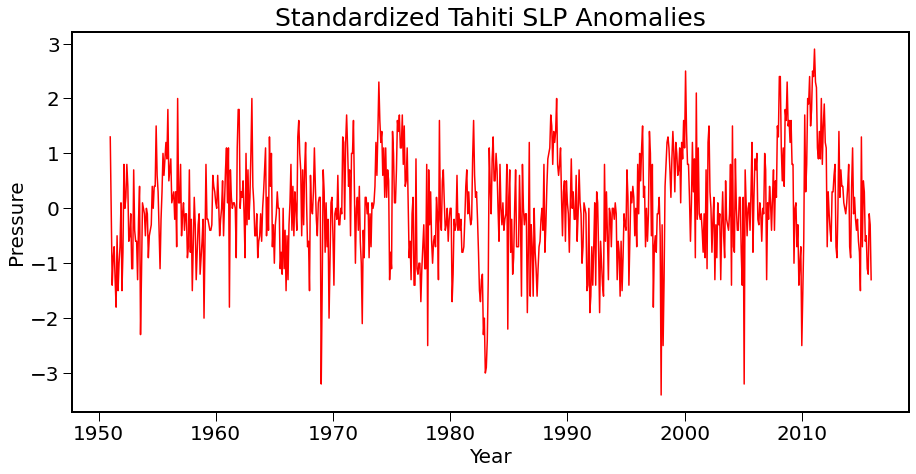

In [ ]:
#Fig 4.2 (a)
# Set up Figure 
plt.figure(figsize= (15.,7.))

# Add data to plot
plt.plot(xtime,PTA,color='r')

# Label plot
plt.xlabel('Year')
plt.ylabel('Pressure')
plt.title('Standardized Tahiti SLP Anomalies')

plt.show()

<b>Download pressure data for Tahiti from http://shen.sdsu.edu/data/PSTANDdarwin.txt into your directory

In [ ]:
# Upload and set up data 
Pda = np.loadtxt('PSTANDdarwin.txt',skiprows=0)
PDA = np.reshape(Pda[:,1:],(780))

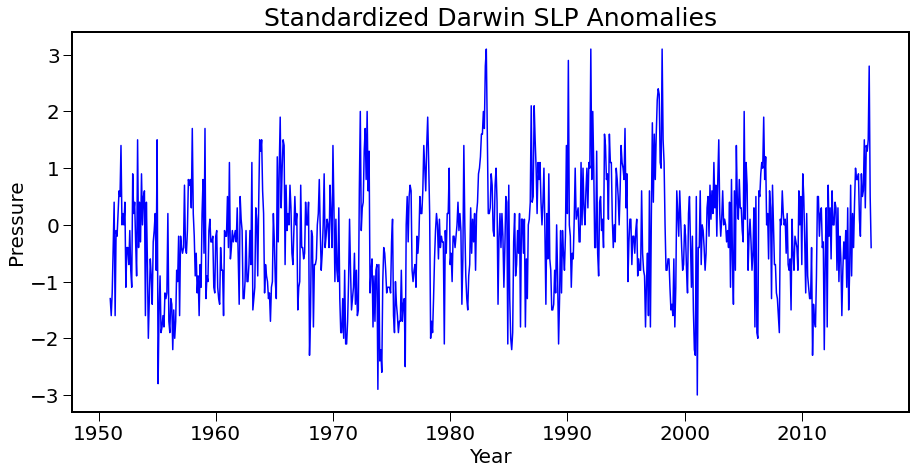

In [ ]:
#Fig 4.2 (b)
plt.figure(figsize=(15.,7.))

plt.plot(xtime,PDA,color='b')

plt.xlabel('Year')
plt.ylabel('Pressure')
plt.title('Standardized Darwin SLP Anomalies')

plt.show()

Plot the SOI index

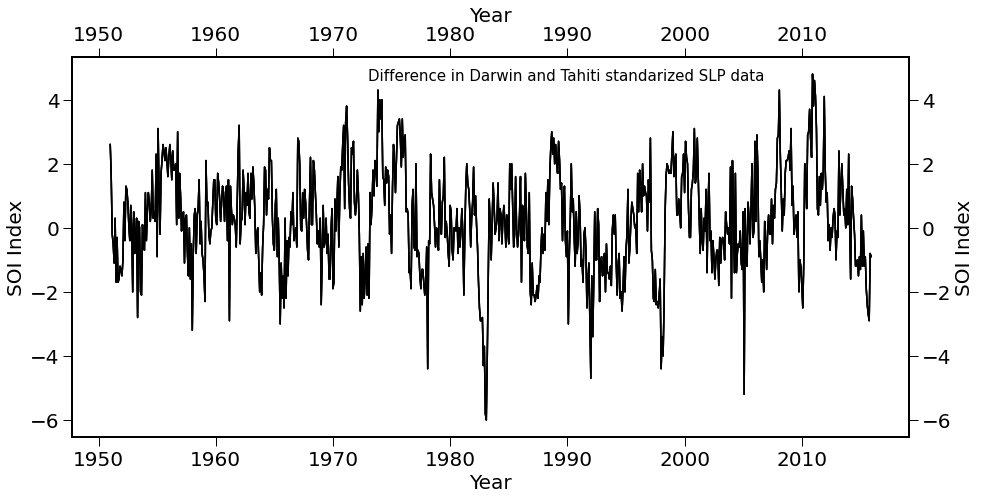

In [ ]:
#Fig 4.2 (c)
# Set up figure 
fig, soi = plt.subplots(figsize=(15,7))

# Ploting data against time
soi.plot(xtime,PTA-PDA,color='k')
soi.set_xlabel('Year')
soi.set_ylabel('SOI Index')

# Making left Y axis 
ax2 = soi.twiny()

# Plotting data against difference of Darwin and Tahiti standarized SLP data
ax2.plot(xtime,PTA-PDA,color='k')
ax2.set_xlabel('Year')

# Mirroring X axis for difference data 
ax3 = soi.twinx()
ax3.plot(xtime,PTA-PDA,color='k')
ax3.set_ylabel('SOI Index')

# Adding some text
ax3.text(1973,4.6,"Difference in Darwin and Tahiti standarized SLP data", fontsize=15)

plt.show()

CSOI and AMO time series comparison

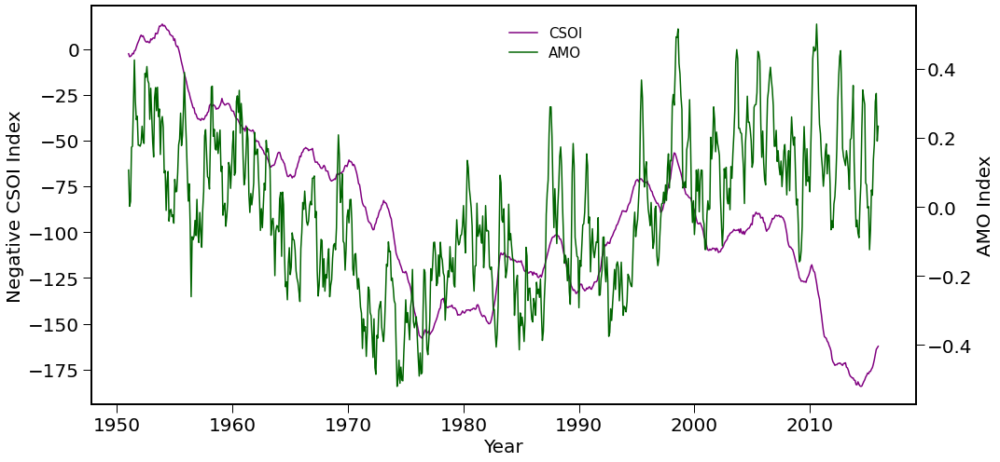

In [ ]:
#Fig 4.2 (d)
# Preparing variables
SOI = PTA-PDA
cnegsoi = -SOI.cumsum()

# Load AMO data
amodat = np.loadtxt('AMO1951-2015.txt',skiprows=0)
amots = amodat[:,1:13].T.flatten("F")

# Set up figures 
fig, ax1 = plt.subplots(figsize=(15,7))

# Plot the data against CSOI Index 
ax1.set_xlabel('Year')
ax1.set_ylabel('Negative CSOI Index')
ax1.plot(xtime, cnegsoi, color="purple", label="CSOI")

# Create a second axes that shares the same x-axis
ax2 = ax1.twinx()  

# Set labels for new axis 
ax2.set_ylabel('AMO Index')  
ax2.plot(xtime, amots, color="darkgreen", label="AMO")

# Set legends 
ax1.legend(loc=(.5,.90))
ax2.legend(loc=(.5,.85))


# Yields the full view of the right y-label
fig.tight_layout()  
plt.show()

Weighed SOI Computed by the SVD Method 

In [ ]:
# Yields transpose of the data
ptamonv = PTA.T
pdamonv = PDA.T

# Creates an array of arrays 
ptada = [ptamonv,pdamonv]

In [ ]:
# Compute SVD of ptada
svdptd_u, svdptd_s, svdptd_vh = np.linalg.svd(ptada,full_matrices=False)

# Verify SVD 
recontada = np.dot(np.dot(svdptd_u,np.diag(svdptd_s)),svdptd_vh)

# Compute error of calculations
svd_error = ptada - recontada

# Error maximum
svd_error.max()

8.881784197001252e-16

In [ ]:
# Error minimum
svd_error.min()

-2.6645352591003757e-15

In [ ]:
# Gather appropriate variables
Dd = np.diag(svdptd_s)
Uu = svdptd_u
Vv = svdptd_vh

# Set up time array
xtime = np.linspace(1951,2016,(65*12)+1)[0:780]

# Compute WSOI1 for plotting 
wsoi1 = Dd[0,0] * (Vv)[0,:]

Plot WSOI1

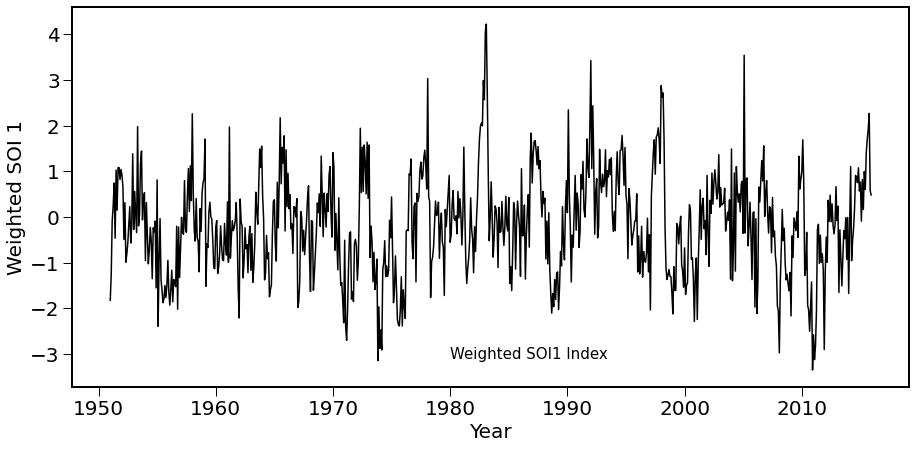

In [ ]:
#Fig 4.3 (a)
# Prepare figure
plt.figure(figsize=(15,7))

# Plot data 
plt.plot(xtime,wsoi1,color='k')
plt.xlabel('Year')
plt.ylabel('Weighted SOI 1')
plt.text(1980,-3.1,"Weighted SOI1 Index", fontsize=15)

plt.show()

Plot WSOI2

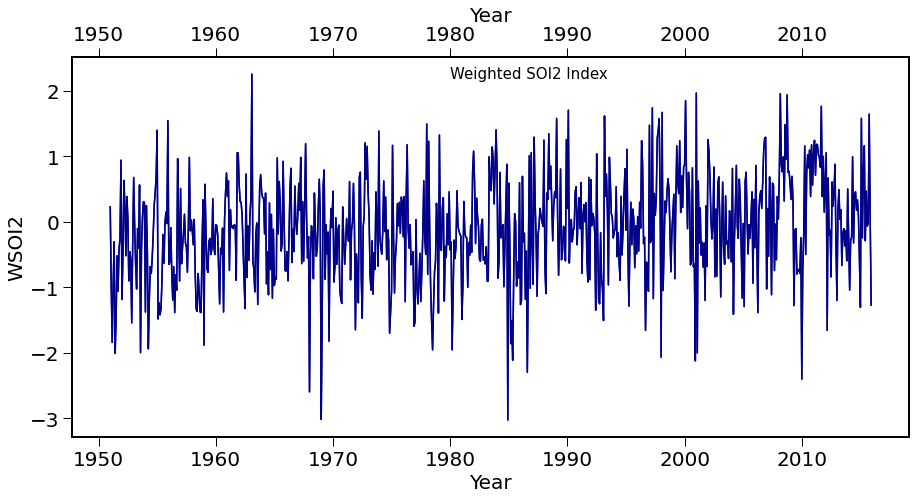

In [ ]:
#Fig 4.3 (b)
# Set up data for WSOI2
wsoi2 = Dd[1,1] * Vv[1,:]

# Prepare figure
fig, wsoi = plt.subplots(figsize=(15,7))

# Plot data 
wsoi.plot(xtime,wsoi2,color='darkblue')
wsoi.set_xlabel('Year')
wsoi.set_ylabel('WSOI2')

# Create second instance of axis
ax2 = wsoi.twiny()
ax2.plot(xtime,wsoi2,color='darkblue')
ax2.set_xlabel('Year')
ax2.text(1980,2.19,"Weighted SOI2 Index", fontsize=15)


plt.show()

Plot comparison between CWSOI1 and the smoothed AMO index 

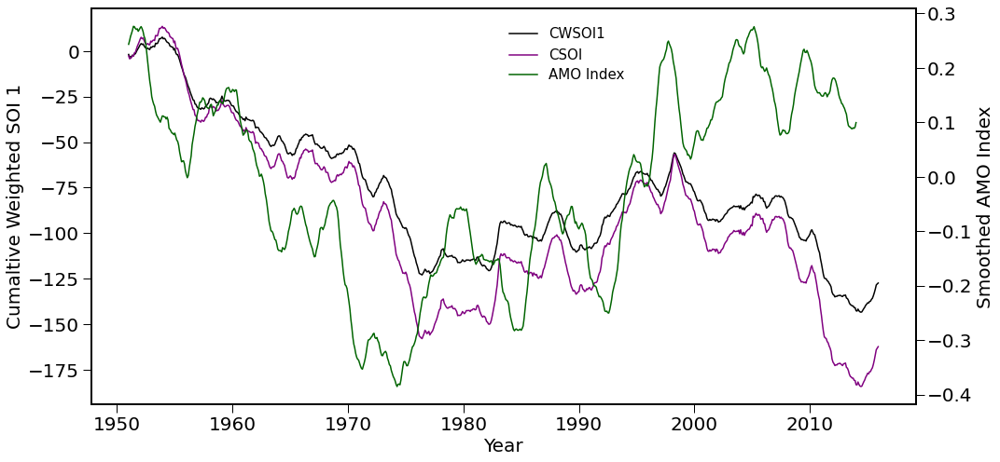

In [ ]:
#Fig 4.3(c)
# Create needed variables 
cwsoi1 = np.cumsum(wsoi1)

# Prepare figure 
fig, plott = plt.subplots(figsize=(15,7))

# Plot cumulative sums 
plott.plot(xtime,cwsoi1,color='black',label='CWSOI1')
plott.set_xlabel('Year')
plott.set_ylabel('Cumaltive Weighted SOI 1')

# Superimpose CSOI time series on this CWSOI1
cnegsoi = -np.cumsum(ptamonv-pdamonv)
plt.plot(xtime,cnegsoi,color='purple',label='CSOI')

ax2 = plott.twinx()

# Create 24-month ahead moving average of the monthly AMO index
i = 0
window_size = 24
moving_averages = []
while i < len(amots) - window_size + 1:
    this_window = amots[i : i + window_size]

    window_average = sum(this_window) / window_size
    moving_averages.append(window_average)
    i += 1

# Creating time sequence spanning from 1951 to 2016
xtime = np.linspace(1951,2016,(65*12)+1)[0:757]

# Plot the moving averages 
ax2.plot(xtime, moving_averages,color='darkgreen',label='AMO Index')
ax2.set_ylabel('Smoothed AMO Index')

# Set legend 
plott.legend(loc=(.5,.85))
ax2.legend(loc=(.5,.8))

# Ensures we can see all axis labels 
fig.tight_layout() 
plt.show()

Plot the cumulative WSOI2: CWSOI2

In [ ]:
# Create appropriate variables from SVD 
uu, ss, vvh = np.linalg.svd(ptada,full_matrices=False)
PC = vvh
PC1 = PC[0,:]
PC2 = PC[1,:]

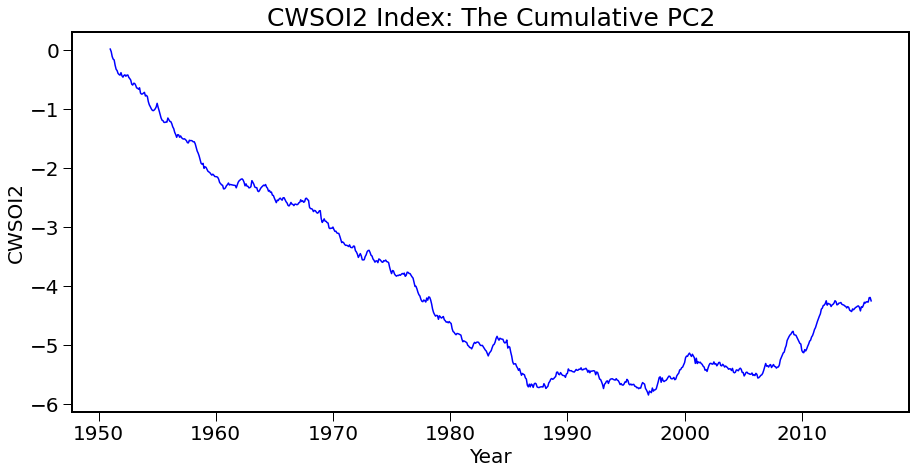

In [ ]:
#Fig 4.3 (d)
# Prepare figure 
plt.figure(figsize=(15,7))

# Prepare time sequence 
xtime = np.linspace(1951,2016,(65*12)+1)[0:780]

# Plot the cumulative sum
plt.plot(xtime,PC2.cumsum(),color='b',label='Principal Component 2')

# Label appropriately 
plt.xlabel('Year')
plt.ylabel('CWSOI2')
plt.title('CWSOI2 Index: The Cumulative PC2')

plt.show()

# Visualization of the ENSO Mode Computed from SVD Method 

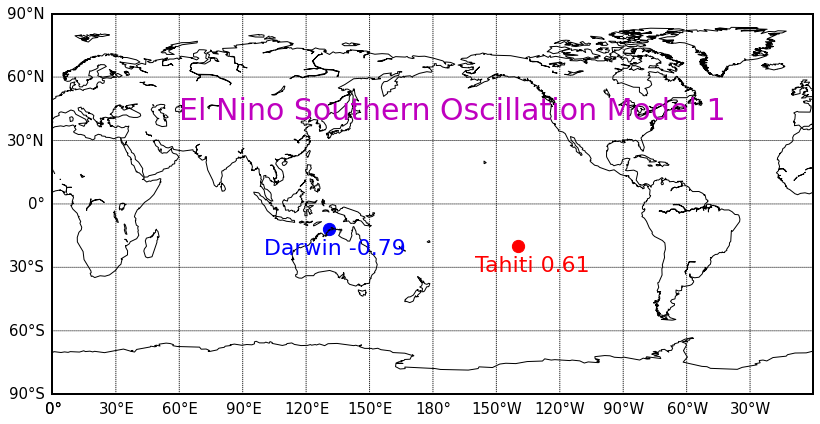

In [ ]:
#Fig 4.4 (a)
# Display the two ENSO modes on a world map
# Prepare the figure 
plt.figure(figsize=(15., 7.))

# Using the basemap package to put the cylindrical projection map into the image
wmap2 = Basemap(projection='cyl',llcrnrlat=-90.,urcrnrlat=90.,\
            llcrnrlon=0.,urcrnrlon=360.,resolution='c')

# Draw coastlines, latitudes, and longitutes on the map
wmap2.drawcoastlines(color='black', linewidth=1)
wmap2.drawparallels(np.arange(-90.,91.,30.), labels = [1,0,0,1], fontsize=15)
wmap2.drawmeridians(np.arange(00.,360.,30.), labels= [1,0,0,1], fontsize=15)

# Add data to plot
plt.scatter(131.,-12.,color='b',s=150)
plt.scatter(220.,-20,color='r',s=150)

# Add desired text to plot 
plt.text(100,-24, 'Darwin -0.79', color = 'b', fontsize = 22)
plt.text(200,-32, 'Tahiti 0.61', color = 'r', fontsize = 22)
plt.text(60,40, 'El Nino Southern Oscillation Model 1', color = 'm', fontsize = 30)

plt.show()

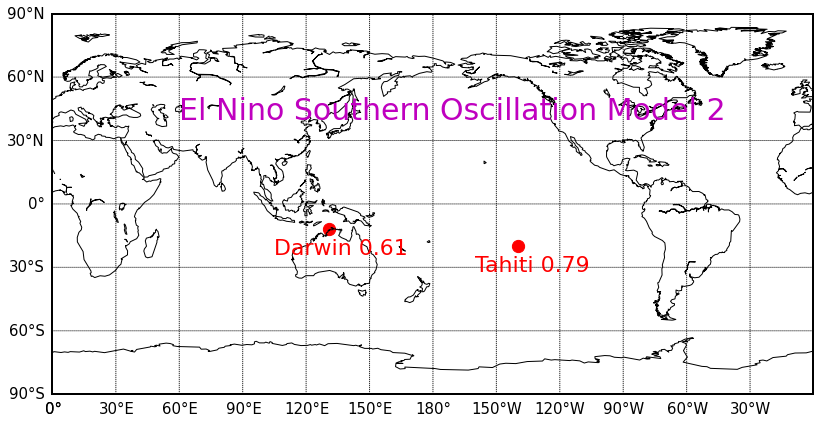

In [ ]:
#Fig 4.4 (b)
# Display the two ENSO modes on a world map
# Prepare figure
plt.figure(figsize=(15, 7))

# Using the basemap package to put the cylindrical projection map into the image
wmap2 = Basemap(projection='cyl',llcrnrlat=-90.,urcrnrlat=90.,\
            llcrnrlon=0.,urcrnrlon=360.,resolution='c')

# Draw coastlines, latitudes, and longitutes on the map
wmap2.drawcoastlines(color='black', linewidth=1)
wmap2.drawparallels(np.arange(-90.,91.,30.), labels = [1,0,0,1], fontsize=15)
wmap2.drawmeridians(np.arange(-180.,181.,30.), labels= [1,0,0,1], fontsize=15)

# Add data to plot 
plt.scatter(131.,-12.,color='r',s=150)
plt.scatter(220.,-20,color='r',s=150)

# Add desired text 
plt.text(105,-24, 'Darwin 0.61', color = 'r', fontsize = 22)
plt.text(200,-32, 'Tahiti 0.79', color = 'r', fontsize = 22)
plt.text(60,40, 'El Nino Southern Oscillation Model 2', color = 'm', fontsize = 30)

plt.show()

# 4.8: Mutivariate Linear Regression Using Matrix Notations

<b>Example 4.9

In [ ]:
# Given the coordinates of 3 points 
x1 = [1,2,3]
x2 = [2,1,3]
y = [-1,2,1]

# Put them into a dataframe 
df = pd.DataFrame([x1,x2,y]).T
X_df = pd.DataFrame([x1,x2]).T

# Create the linear regression 
lm = LinearRegression()

# Fit the linear regression 
lm.fit(X_df, df[2])

# Display Coefficients 
lm.coef_

array([ 1.66666667, -1.33333333])

In [ ]:
# Verfiy the 3 points determining a plane 
b1 = [i*1.667 for i in x1]
b2 = [j*1.333 for j in x2]
difference = []

zip_object = zip(b1, b2)
for b1_i, b2_i in zip_object:
    difference.append(b1_i-b2_i)
difference

[-0.9989999999999999, 2.0010000000000003, 1.0020000000000007]

<b>Example 4.10

In [ ]:
u = [1,2,3,1]
v = [2,4,3,-1]
w = [1,-2,3,4]

df = pd.DataFrame([u,v,w]).T
X_df = pd.DataFrame([u,v]).T
lm = LinearRegression()
lm.fit(X_df, df[2])
lm.coef_

array([ 2. , -1.5])

In [ ]:
lm.intercept_

0.9999999999999982

<b>Example 4.11

In [ ]:
# Show a general multivariate linear regrssion with 3 independent random variables
dat = np.mat([np.random.normal(0, 1, 4),np.random.normal(0, 1, 4),
                np.random.normal(0, 1, 4),np.random.normal(0, 1, 4),
                np.random.normal(0, 1, 4),np.random.normal(0, 1, 4),
                np.random.normal(0, 1, 4),np.random.normal(0, 1, 4),
                np.random.normal(0, 1, 4),np.random.normal(0, 1, 4)])

fdat = pd.DataFrame(dat)
lm = LinearRegression()
lm.fit(fdat.iloc[:,0:3], fdat.iloc[:,3])
lm.coef_

array([0.58955312, 0.22995714, 0.62614479])

In [ ]:
lm.intercept_

-0.14682354563605512

_______

# Chapter 5: Energy Balance Models for Climate 
_______

In [ ]:
import numpy as np 
import matplotlib
from matplotlib import cm
import matplotlib.pyplot as plt
from matplotlib.colors import rgb2hex
from matplotlib.patches import Polygon
import matplotlib.mlab as mlab
import pandas as pd
from mpl_toolkits.basemap import Basemap
from mpl_toolkits import mplot3d
from netCDF4 import Dataset as ds
from urllib import request
import scipy as sp
from scipy import stats as stt
from sklearn import datasets, linear_model
from sklearn.neighbors import KernelDensity as kd
from sklearn.linear_model import LinearRegression
from random import randint
from scipy.stats import norm
import statsmodels
import sklearn
import math
import statistics
import sympy as sy
from sympy import symbols, diff
import statsmodels.api as sm
from datetime import date
from scipy.stats import norm, kurtosis
from sklearn.linear_model import LinearRegression
import seaborn as sns
import statsmodels.api as sm 
import pylab as py 
from scipy.stats import norm, t
import warnings
import os
warnings.filterwarnings("ignore")

_______
# 5.1: EBM for Modeling the Moon's Surface Temperature 
_______

In [ ]:
# NASA Diviner Data Source:
# http://pds-geosciences.wustl.edu/lro/lro-l-dlre-4-rdr-v1/lrodlr_1001/data/gcp
d19 = pd.read_csv("tbol_snapshot.pbin4d-19.out-180-0.txt", sep='\s+', header=None)
m19 = np.array(d19.iloc[:,2]).reshape(720,360)

In [ ]:
# Set up latitude and longitude sequences 
lat1 = np.linspace(-89.75, 89.75, 360)
lon1 = np.linspace(-189.75, 169.75, 720)

# Created desired color sequence
colors = ['skyblue', 'green', 'darkgreen', 'slateblue', 'indigo',
          'darkviolet', 'yellow', 'orange', 'pink', 'red', 'maroon', 'purple', 'black']
myColMap = newColMap(colors)

# Prepare data
mapmat = m19.T 
mapmat[mapmat == mapmat.max()] = 400
mapmat[mapmat == mapmat.min()] = 0

# Create levels for contour map
clev = np.linspace(mapmat.min(), mapmat.max(), 60)

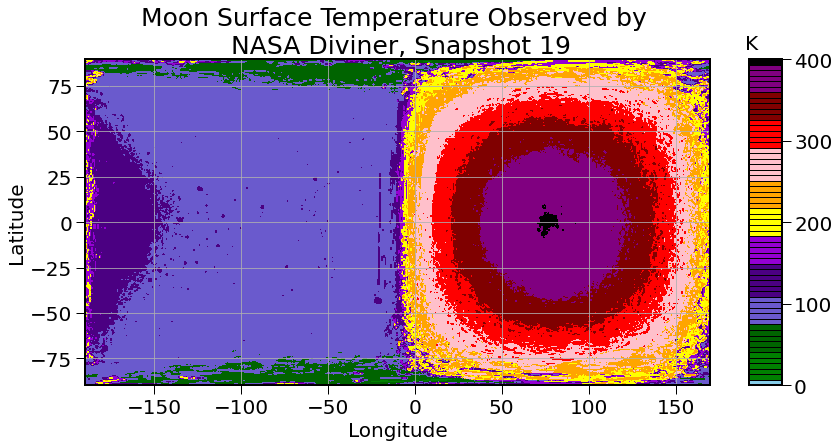

In [ ]:
#Fig 5.2 (top panel)
plt.figure(figsize=(14,6))
contf = plt.contourf(lon1, lat1, mapmat, clev, cmap=myColMap)
colbar = plt.colorbar(contf, drawedges=True, ticks=[0, 100, 200, 300, 400], aspect = 10)
plt.title("Moon Surface Temperature Observed by \n NASA Diviner, Snapshot 19")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.text(190, 95, "K", size=20)
plt.grid();

plt.show()

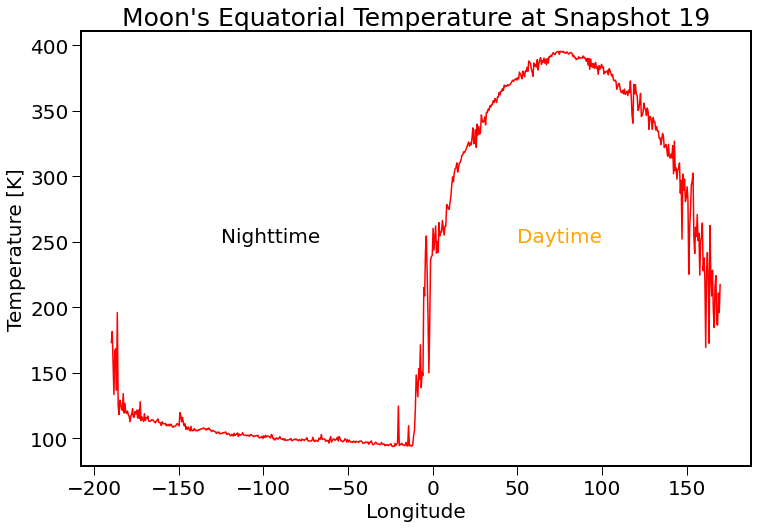

In [ ]:
#Fig 5.2 (middle panel)
# Plot the equator temperature for a snapshot 
equ = np.where((lat1 < .5) & (lat1 > -.5))[0]
equatorial = mapmat[equ[0]]
merid = np.where((lon1 < 90.5) & (lon1 > 89.5))[0]
meridion = mapmat[:, merid[0]]


ax = plt.figure()
plt.plot(lon1, equatorial, 'r-')
plt.text(-125, 250, "Nighttime", size=20)
plt.text(50, 250, "Daytime", size=20, color='orange')
plt.xlabel("Longitude")
plt.ylabel("Temperature [K]")
plt.title("Moon's Equatorial Temperature at Snapshot 19");


plt.show()

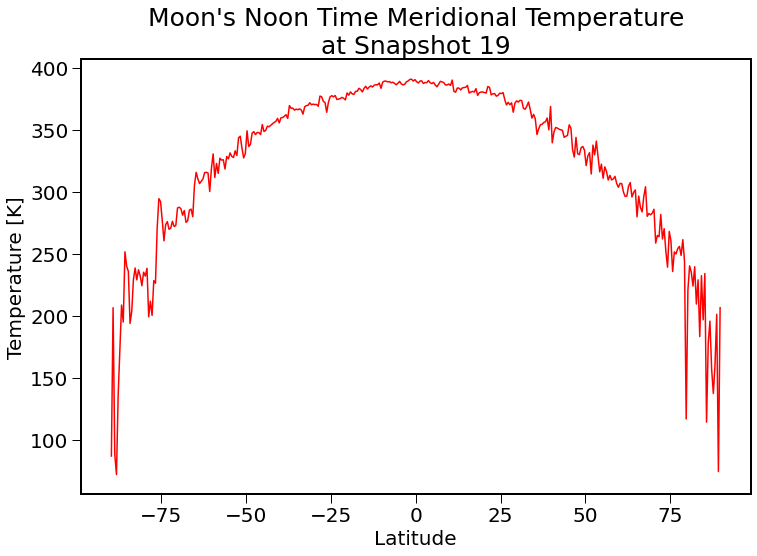

In [ ]:
#Fig 5.2 (bottom panel)
# Plot the noon time meridional temperature for a snapshot
ax = plt.figure()
plt.plot(lat1, meridion, 'r-')
plt.xlabel("Latitude")
plt.ylabel("Temperature [K]")
plt.title("Moon's Noon Time Meridional Temperature\nat Snapshot 19");

plt.show()

In [ ]:
# Compute the bright side average temperature
bt = np.array(d19.iloc[129600:].astype(np.float))
type(bt)
aw = np.cos(bt[:,1]*np.pi/180)
wbt = bt[:,2]*aw
bta = np.sum(wbt)/np.sum(aw)
print("Average temperature of bright side of moon:", round(bta,3), "degrees Kelvin")

Average temperature of bright side of moon: 302.765 degrees Kelvin


In [ ]:
# Compute the dark side average temperature
dt=np.array(d19.iloc[:129600].astype(np.float))
aw=np.cos(dt[:,1]*np.pi/180)
wdt=dt[:,2]*aw
dta=np.sum(wdt)/np.sum(aw)
print("Average temperature of dark side of moon:", round(dta,3), "degrees Kelvin")

Average temperature of dark side of moon: 99.557 degrees Kelvin


5.1.3 EBM Prediction for the Moon Surface Temperature

In [ ]:
from scipy import optimize as opt

# Making a function to numerically solve an EBM
def ebm_maker(a, s, l, e, si, ka, t0, he):
    """
    This function accept a set of Energy Balance Model parameters
    and returns a lambda function with those parameters as a function
    of t.
    """
    return lambda t: (1-a)*s*np.cos(l) - e*si*(t**4) - ka*(t - t0)/he

In [ ]:
# Equator noon temperature of the moon from an EBM
lat = 0*np.pi/180
sigma = 5.670367e-8
alpha = 0.12
S = 1368
ep = 0.98
k = 7.4e-4
h = 0.4
T0 = 260


fEBM = ebm_maker(alpha, S, lat, ep, sigma, k, T0, h)

# Numerically solve the EBM: fEBM = 0 
res = opt.root(fEBM, x0 = 400)
x0 = res['x'][0]
x0

383.629726096338

_______
# 5.3  EBM for the Global Average Surface Temperature of an Earth with a Nonlinear Albedo Feedback
______

In [ ]:
# Define a piecewise albedo function 
a1 = 0.7
a2 = 1 - a1
T1 = 250
T2 = 280
a = []

def ab(T):
    try:
        for i in T:
            if i < T1:
                a.append(a1)
            else:
                if i < T2:
                    a.append(((a1-a2)/(T1-T2))*(i-T2) + a2)
                else:
                    a.append(a2)
        return a
    
    except TypeError:
        if T < T1:
                a.append(a1)
        else:
            if T < T2:
                a.append(((a1-a2)/(T1-T2))*(T-T2) + a2)
            else:
                a.append(a2)
        return a
        
        
# Define the range of temperatures 
t = np.linspace(200, 350, 1001)

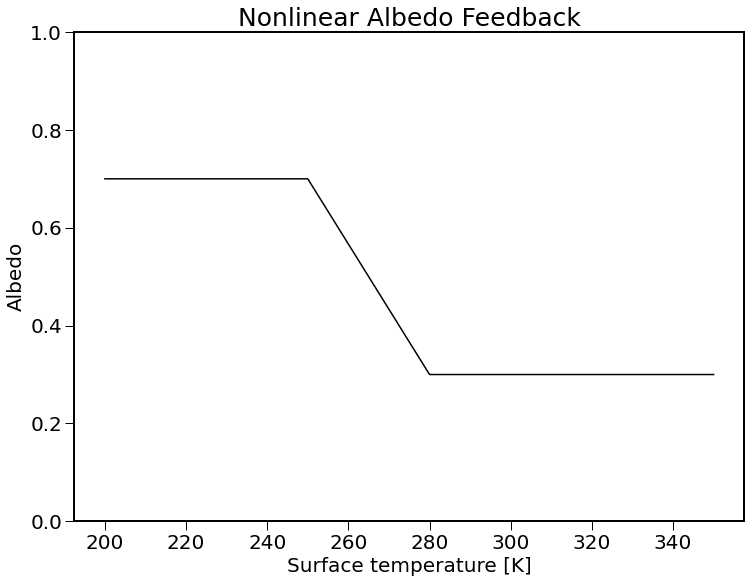

In [ ]:
#Fig 5.5
# Plot the albedo as a nonlinear function of T
a = []

plt.figure(figsize=(12,9))
plt.plot(t, ab(t), 'k-')
plt.ylim(0,1)
plt.xlabel("Surface temperature [K]")
plt.ylabel("Albedo");
plt.title("Nonlinear Albedo Feedback")

plt.show()

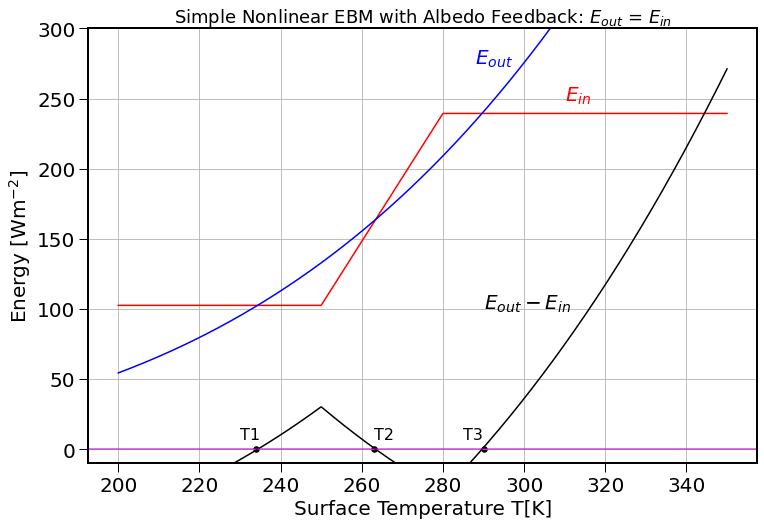

In [ ]:
#Fig 5.6
# Formulate and solve an EBM
a = []
S = 1368
ep = 0.6
sg = 5.670373e-8
y1 = [(1-i)*(S/4.0) for i in ab(t)]
y2 = ep*sg*(t**4)
y3 = np.zeros(t.size)

plt.figure(figsize=(12,8))
plt.plot(t, y1, 'r-', label="Incoming Energy")
plt.plot(t, y2, 'b-', label="Outgoing Energy")
plt.plot(t, y2 - y1, 'k-', label="Difference between outgoing and incoming energy")
plt.ylim(-10,300)
plt.axhline(y=0, alpha=.7, color='m')
plt.grid()

# Label the plot
plt.title("Simple Nonlinear EBM with Albedo Feedback: $E_{out}$ = $E_{in}$", fontsize = 18)
plt.xlabel("Surface Temperature T[K]")
plt.ylabel("Energy [Wm$^{-2}$]")

plt.text(288,275,"$E_{out}$", fontsize=20, color="b")
plt.text(310,248,"$E_{in}$", fontsize=20, color="r")
plt.text(290,100,"$E_{out} - E_{in}$", fontsize=20, color="k")

plt.text(230,7, "T1", fontsize=16)
plt.text(263,7, "T2", fontsize=16)
plt.text(285,7, "T3", fontsize=16)

plt.scatter(234,0,s=30, c = "black")
plt.scatter(263,0,s=30, c = "black")
plt.scatter(290,0,s=30, c = "black")

plt.show()

In [ ]:
# Verify the roots
S = 1365
ep = 0.6
sg = 5.670373e-8
roots = []

# Redefine the albedo fuction using lambda variable 
ab = lambda t: 0.5 - 0.2 *np.tanh((t-265)/10)

# Create fuction F
def f(T):
    try:
        return ep*sg*T**4 - (1 - ab(T))*(S/4.0)
    
    except TypeError:
        for i in T:
            r = ep*sg*i**4 - (1 - ab(i))*(S/4.0)
            roots.append(r)
        return r

# Find roots of Albedo function 
opt.bisect(f, 220, 240)

234.38170133561357

In [ ]:
opt.bisect(f, 275, 295)

289.1400765491301

In [ ]:
opt.bisect(f, 220, 240)

234.38170133561357


_______
# Chapter 6: Calculus Applications to Climate Science: Derivatives
_______


In [ ]:
import numpy as np 
import matplotlib
from matplotlib import cm
import matplotlib.pyplot as plt
import pandas as pd
import warnings
import os
warnings.filterwarnings("ignore")
from scipy import optimize as opt
import sympy as sm
import math as m

_____
# 6.1: Stefan-Boltzmann Law and Budyko's Approximation
_____

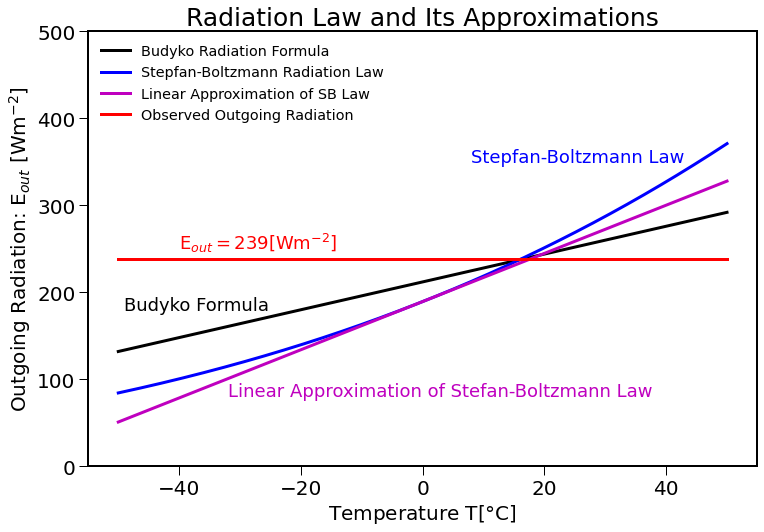

In [ ]:
#Fig 6.1
# Cess' Budyko Parameters 
A = 212
B = 1.6 
ep = 0.6 
sg = 5.670367e-8
T = np.linspace(-50,50,10*100)
S = 1365
alf = 0.3

# Plot the Data 
plt.plot(T, A+B*T, "k-", linewidth=3, label="Budyko Radiation Formula")
plt.plot(T, ep*sg*(273.15+T)**4, "b-", linewidth=3, label="Stepfan-Boltzmann Radiation Law")
plt.plot(T, 189.4+2.77*T, "m-", linewidth=3, label="Linear Approximation of SB Law")
plt.plot(T, (1-alf)*S/4*np.repeat(1,len(T)), "r-", linewidth=3, label="Observed Outgoing Radiation")

# Add line Labels 
plt.text(-49,180,"Budyko Formula",size=18, color="k")
plt.text(8,350,"Stepfan-Boltzmann Law",size=18, color="b")
plt.text(-32,80,"Linear Approximation of Stefan-Boltzmann Law",size=18, color="m")
plt.text(-40,250,"E$_{out}=239$[Wm$^{-2}$]",size=18, color="r")

# Modify Plot parameters
plt.title("Radiation Law and Its Approximations")
plt.xlabel("Temperature T[$\degree$C]")
plt.ylabel("Outgoing Radiation: E$_{out}$ [Wm$^{-2}$]")
plt.ylim(0,500)
plt.legend(loc='upper left', fontsize="x-large")

plt.show()

_____
# 6.2: Linear Approximation
_____

Linear approximation of $$f(x)=(1+x)^4$$ by $$L(x)=1+4x$$

In [ ]:
# Produce table 6.1 
x = np.linspace(-0.3,0.3,7)
fx = list(range(1,8))
lx = list(range(1,8))
ex = list(range(1,8))
for i in range(7):
    fx[i] = (1+x[i])**4
    lx[i] = 1+4*x[i]
    ex[i] = round(((1+x[i])**4 - (1+4*x[i]))/((1+x[i])**4)*100, 1)


pd.set_option('display.max_columns', None)

my_tbl = pd.DataFrame({"X":x,"f(x)":fx, "L(x)":lx, "Error[%]":ex})

my_tbl

,X,f(x),L(x),Error[%]
0,-0.3,0.2401,-0.2,183.3
1,-0.2,0.4096,0.2,51.2
2,-0.1,0.6561,0.6,8.6
3,0.0,1.0000,1.0,0.0
4,0.1,1.4641,1.4,4.4
5,0.2,2.0736,1.8,13.2
6,0.3,2.8561,2.2,23.0


_____
# 6.3: Bisection Method for Solving Nonlinear Equations 
_____

In [ ]:
#Example 6.2
def func(x):
    return x**3-x-1

opt.bisect(func, 0, 2)

1.324717957244502

In [ ]:
#Example 6.3
S = 1368
ep = 0.6 
sg = 5.670367e-8
def f2(T):
    return ep*sg*T**4 - (1 - (0.5 - 0.2*np.tanh((T-265)/10))) * (S/4)

opt.bisect(f2, 270, 300)

289.30980607804315

_____
# 6.4: Newton's Method
_____

In [ ]:
# Create Newton Fuction
def newton(f, tol=1e-12, x0=1,N=20):
    h = 0.001
    i = 1
    x1 = x0
    p = []
    while i <= N:
        df_dx = (f(x0+h)-f(x0))/h
        x1 = (x0 - (f(x0)/df_dx))
        p.append(x1)
        i = i + 1
        if abs(x1-x0) < tol:
            break
        x0 = x1
    return p[:i-1]

In [ ]:
# Create test function for input in Newton Function
def f(x):
    return x**3 + 4*x**2 - 10 

In [ ]:
root = newton(f, tol=1e-12, x0=1,N=10)
root

[1.454256341032464,
 1.368917103772529,
 1.3652384598365683,
 1.3652300175883723,
 1.3652300134161426,
 1.3652300134140978,
 1.3652300134140969]

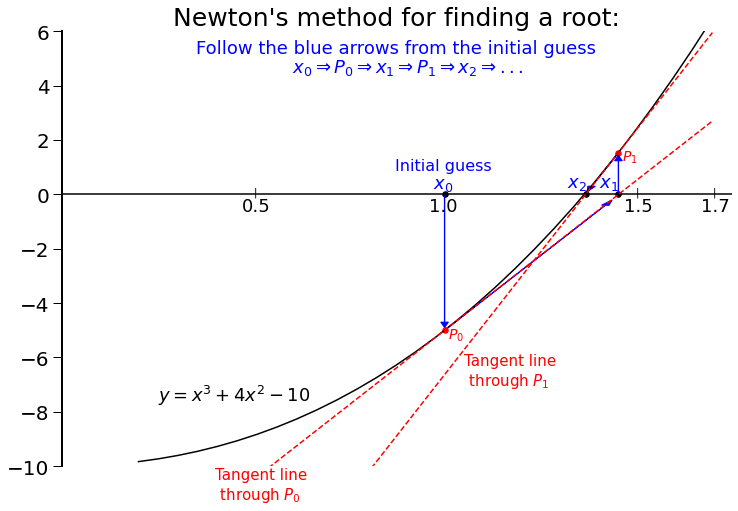

In [ ]:
#Fig 6.2
# Illustration of Newton's Method
x = np.linspace(0.2,1.7,30)
def f(x): return x**3 + 4*x**2 - 10 
def g(x): return 3*x**2 + 8*x

x0 = 1
x1 = 1.4543
x2 = 1.3689

fig, ax = plt.subplots(frameon=False)

# Plot the data
plt.plot(x,f(x),"k-")
plt.plot(np.linspace(0,1.75,100),np.zeros(100), "k-")
plt.plot(x, f(x0)+g(x0)*(x-x0),"r--")
plt.plot(x, f(x1)+g(x1)*(x-x1),"r--")

plt.scatter(1,0,s=30,c="k")
plt.scatter(x1,0,s=30,c="k")
plt.scatter(x2,0,s=30,c="k")
plt.scatter(x1,f(x1), s=30, c="r")
plt.scatter(x0,f(x0), s=30, c="r")

# Creating Appropriate tick marks on X-Axis
plt.text(0.5,0,"|")
plt.text(0.47,-0.6,"0.5", fontsize=18)
plt.text(0.96,-0.6,"1.0", fontsize=18)
plt.text(1.5,0,"|")
plt.text(1.47,-0.6,"1.5", fontsize=18)
plt.text(1.7,0,"|")
plt.text(1.67,-0.6,"1.7", fontsize=18)

# Add line Labels and text
plt.text(0.25,-7.6,"$y=x^3+4x^2-10$",size=18, color="k")
plt.text(0.97,0.23,"$x_0$",size=18, color="b")
plt.text(0.87,.9,"Initial guess",size=16, color="b")
plt.text(x1-0.05,0.25,"$x_1$",size=18, color="b")
plt.text(x2-0.05,0.25,"$x_2$",size=18, color="b")
plt.text(0.35,5.2,"Follow the blue arrows from the initial guess",size=18, color="b")
plt.text(0.60,4.5,"$x_0 \Rightarrow P_0 \Rightarrow x_1 \Rightarrow P_1 \Rightarrow x_2 \Rightarrow ...$",
         size=18, color="b")
plt.text(x1+0.01,f(x1)-0.3, "$P_1$", color="r",size=14)
plt.text(0.4, -11.2, "Tangent line \n through $P_0$", color="r",size=15)
plt.text(x0+0.01,f(x0)-0.3, "$P_0$", color="r",size=14)
plt.text(1.05, -7, "Tangent line \n through $P_1$", color="r",size=15)

# Add Descriptive arrows
plt.arrow(1,0,0,f(x0)+0.3,head_width=0.02, head_length=0.2,color="b")
plt.arrow(1,f(x0),0.42,4.6,head_width=0.02, head_length=0.2,color="b")
plt.arrow(x1,0,0,f(x1)-0.3,head_width=0.02, head_length=0.2,color="b")
plt.arrow(x1,f(x1),-0.07,-f(x1)+0.3,head_width=0.02, head_length=0.2,color="b")


# Modify Plot parameters
plt.title("Newton's method for finding a root:")
plt.xlim(0,1.75)
plt.ylim(-10,6)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.get_xaxis().set_ticks([])

plt.show()

In [ ]:
def f(x): return (x+1)**4 - (2+x)
root = newton(f, N=10)
root

[0.5809696800109538,
 0.3335992109385367,
 0.2359959176632994,
 0.22108766698749036,
 0.22074474123732507,
 0.22074408554093847,
 0.22074408460709063,
 0.22074408460576125,
 0.22074408460575942]

In [ ]:
# Define Parameters 
S = 1365
ep = 0.6
sg = 5.670367e-8

# Define the function for energy
def f3(T): return ep*sg*T**4 - (1 - (0.5 - 0.2*np.tanh((T-265)/10))) * (S/4)

# Compute Solutions 
root1 = newton(f3, x0=220)
root1

[235.69658970294506,
 234.38606171928143,
 234.3817655891268,
 234.38176551811753,
 234.3817655181173]

In [ ]:
# Compute Solutions 
root2 = newton(f3, x0=270)
root2

[262.05664244651985,
 264.50704124959947,
 264.33780214259644,
 264.3376470816254,
 264.3376470803433,
 264.3376470803433]

In [ ]:
# Compute Solutions 
root3 = newton(f3, x0=300)
root3

[289.9086198038602,
 289.14701243927755,
 289.1401590537761,
 289.1401583849815,
 289.1401583849732,
 289.1401583849732]

In [ ]:
# Compute Solutions 
root5 = newton(f3, x0=100)
root5

[827.2552143021114,
 623.5422659266504,
 474.89725763077905,
 372.56214756821834,
 313.36499589662805,
 292.05532787372726,
 289.2231588691877,
 289.1402443882009,
 289.14015838613426,
 289.1401583849732,
 289.1401583849732]

_____
# 6.5: Examples of Higher-Order Derivatives
_____

In [ ]:
x = sm.Symbol("x")
sm.diff(x**2)

2*x

In [ ]:
x = sm.Symbol("x")
def e(i):
    return m.e**i

sm.diff(e(-x**2),x)

-2.0*2.71828182845905**(-x**2)*x

In [ ]:
# Higher order derivatives
x = sm.Symbol("x")
g = sm.Symbol("g")
t = sm.Symbol("t")
v0 = sm.Symbol("v0")
h0 = sm.Symbol("h0")

# First Derivative
fst_dev = sm.diff(-g*t**2/2+v0*t+h0,t)
fst_dev

-g*t + v0

In [ ]:
# Second Derivative
sec_dev = sm.diff(fst_dev,t)
sec_dev

-g

In [ ]:
# Third derivative
thr_dev = sm.diff(sec_dev,t)
thr_dev

0

______
# Chapter 9: Python Graphics for Climate Science 
_______

In [ ]:
import numpy as np 
import pandas as pd
import warnings
import os
warnings.filterwarnings("ignore")
import plotly.express as px 
import sympy as sm
import math as m
import os
import netCDF4 as nc

import matplotlib
from matplotlib import cm as cm1
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Polygon
import matplotlib.animation as animation
from mpl_toolkits.basemap import Basemap, cm, shiftgrid, addcyclic

from datetime import datetime

import cartopy 
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

from scipy import optimize as opt
from scipy.ndimage import gaussian_filter

from tkinter import *
import time

_____
# 9.1 Two-Dimensional Line Plots and Setups of Margins and Labels
______

<b> Two different Time Series on the Same Plot

In [ ]:
#Set up Variables 
time = np.arange(2001,2011)
Tmean = np.array([12.06, 11.78, 11.81, 11.72, 12.02,
                  12.36, 12.03, 11.27, 11.33, 11.66])
Prec = np.array([737.11, 737.87, 774.95, 844.55, 764.03,
                 757.43, 741.17, 793.50, 820.42, 796.80])

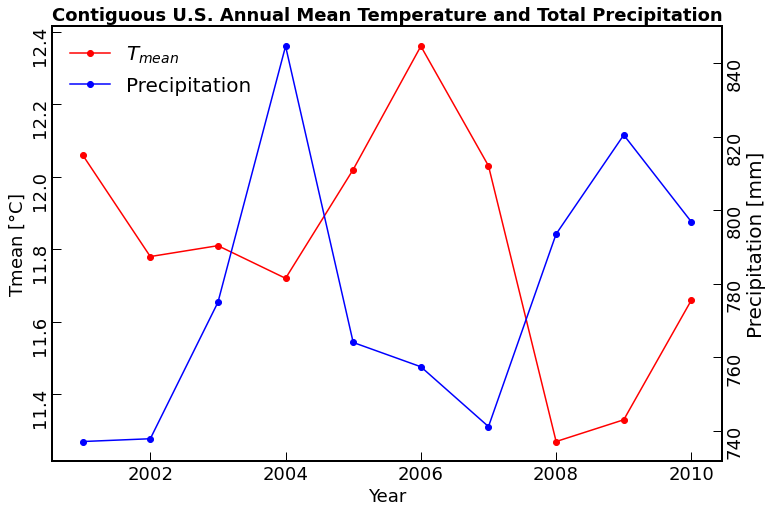

In [ ]:
#Fig 9.1
# set up figure
fig, ax = plt.subplots(1,1,figsize=(12, 8))

# plot data 
ax.plot(time, Tmean, 'o-r', label="$T_{mean}$")

# set labels 
ax.set_ylabel("Tmean [$\degree$C]", size=18)
ax.set_xlabel("Year", size=18)
ax.set_title("Contiguous U.S. Annual Mean Temperature and Total Precipitation", size=18, fontweight="bold")

plt.yticks(rotation=90, size=18)
plt.xticks(size=18)

# creates twin axis 
ax1 = ax.twinx()

# plot of twin axis 
ax1.plot(time, Prec, 'o-b', label="Precipitation")
ax1.set_ylabel("Precipitation [mm]")

plt.yticks(rotation=90, size=18)


# create legend 
hand1, lab1 = ax.get_legend_handles_labels()
hand2, lab2 = ax1.get_legend_handles_labels()

ax.legend(handles=hand1+hand2, labels=lab1+lab2,
          loc='upper left', prop={'size': 20});

ax1.tick_params(direction='in')
ax.tick_params(direction='in')

# show plot 
plt.show()

<b>Figure Setups: Margins, Fonts,Mathematical Symbols, and More 

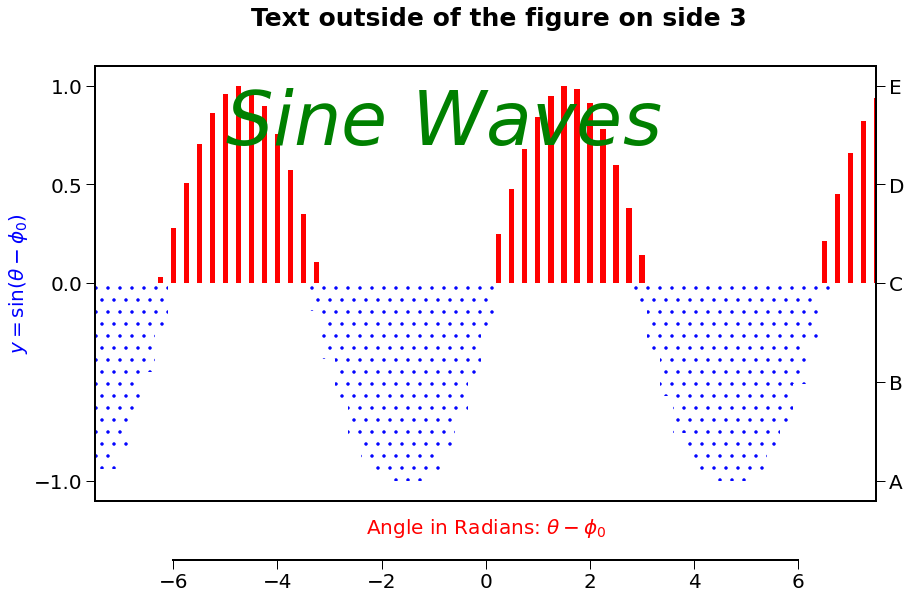

In [ ]:
#Fig 9.2
x = 0.25*np.arange(-30, 31)

# find constraint on variables
yPositive = np.where(np.sin(x) > 0)[0]
yNegative = np.where(np.sin(x) < 0)[0]

# set up figure
fig, ax = plt.subplots(figsize=(14,8))
plt.rcParams['hatch.color'] = 'blue'

# plot bar plot 
ax.bar(x[yPositive], np.sin(x[yPositive]), width=.1, color='red')
ax.bar(x[yNegative], np.sin(x[yNegative]), hatch='.', fc='white', color="blue")

# add annotations
ax.text(-5, .7, "$Sine\ Waves$", size=75, color='green')
ax.set_xlabel(r"Angle in Radians: $\theta - \phi_0$", color='red',
              labelpad=-75)
ax.set_xticks([2*i for i in range(-3, 4)])
ax.set_xlim(x.min(), x.max())
ax.set_ylabel(r"$y = \sin(\theta - \phi_0)$", color='blue')
ax.set_yticks([-1., 0., .5, 1.])
ax.spines['bottom'].set_position(('data',-1.4))
ax.spines['bottom'].set_bounds(-6,6)

# twin axis 
ax1 = ax.twinx()

# plot on twin axis 
ax1.plot(x, np.sin(x), alpha=0)

# set labels
ax1.set_yticks([-1., -.5, 0., .5, 1.])
ax1.set_yticklabels(['A', 'B', 'C', 'D', 'E'])
ax1.tick_params(width=1, length=9)

fig.text(0.28,.95,"Text outside of the figure on side 3", size=25, fontweight="bold")

# show plot 
fig.show()

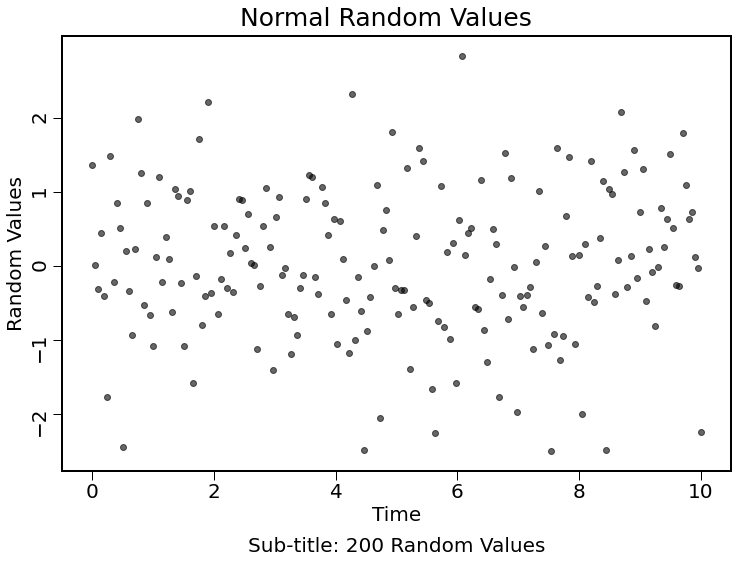

In [ ]:
#Fig 9.3
#Illistrating how to adjust font size, axis labels space, and margins.

# create Random Variable
randVals = np.random.standard_normal(200)
x = np.linspace(0, 10, randVals.size)

# set up Figure 
fig, ax = plt.subplots(1, figsize=(12,8))
fig.suptitle("Normal Random Values", fontsize=25, y=.93)

# plot data 
ax.scatter(x, randVals, color = 'k', alpha=.6)

# add plot labels 
ax.set_title("Sub-title: 200 Random Values", y=-.2, fontsize=20)
ax.set_ylabel("Random Values")
plt.yticks(rotation=90)

ax.set_yticks([i for i in range(-2, 3)])
ax.set_xlabel("Time")

# show plot 
fig.show()

In [ ]:
# read in data 
NOAATemp = np.loadtxt("aravg.ann.land_ocean.90S.90N.v4.0.1.2016.txt",skiprows=0)

# set up variables
x=NOAATemp[:,0]
y=NOAATemp[:,1]
z = [-99] * x.size

In [ ]:
def forz(z,y):
    for i in range(2,134):
        
        rslt = [(y[i-2],y[i-1],y[i],y[i+1],y[i+2])]
        z[i] = np.mean(rslt)
    return z

zz = forz(z,y)

In [ ]:
def n1func():
    n1 = []
    for i in range(0,137):
        if y[i] >= 0:
            n1.append(i)
    return n1

def n2func():
    n2 = []
    for i in range(0,137):
        if y[i] < 0:
            n2.append(i)
    return n2

n1 = n1func()
n2 = n2func()

In [ ]:
x1= x[n1]
y1= y[n1]
x2 = x[n2]
y2 = y[n2]
x3 = x[2:134]
y3 = z[2:134]

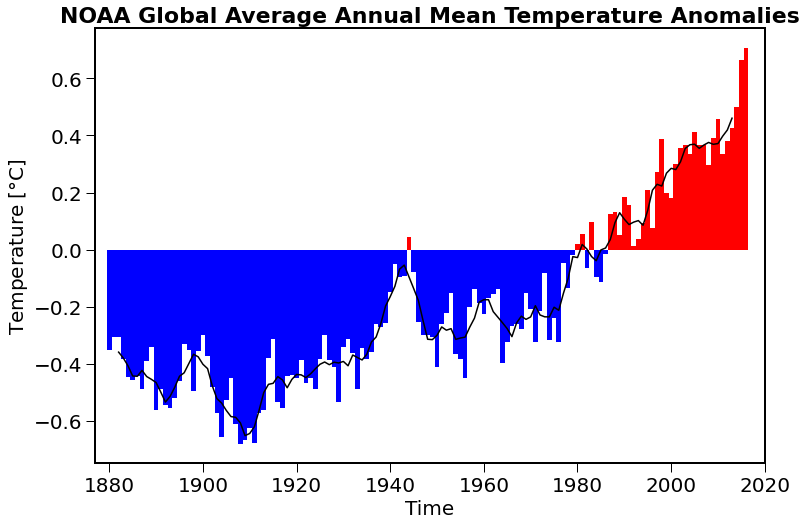

In [ ]:
#Fig 9.4
# fancy plot of the NOAAGlobalTemp time series
plt.bar(x1,y1,color='r',width=1.)
plt.bar(x2,y2,color='b',width=1.)
plt.plot(x3,y3,color='k')
plt.xlim(1877,2020)

plt.xlabel('Time')
plt.ylabel('Temperature [$\degree$C]')
plt.title('NOAA Global Average Annual Mean Temperature Anomalies', fontweight="bold", size=22)

plt.show()

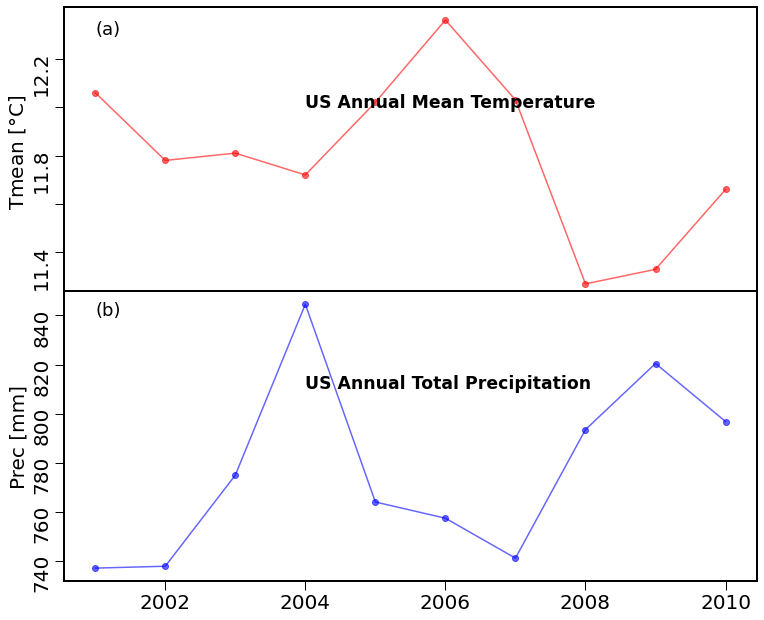

In [ ]:
#Fig 9.5
#Contiguous United States (a) annual mean temperature and (b) annual total precipitation 

# plot the US temp and prec time series on the same figure 
fig, ax = plt.subplots(2,1, figsize=(10,8))

# add additional axis 
ax[0].axes.get_xaxis().set_visible(False)

# plot first subplot data
ax[0].plot(time, Tmean, 'ro-', alpha=.6
           , label="(a)")

ax[0].set_yticks([11.4, np.mean([11.4, 11.8]), 11.8
                  , np.mean([11.8, 12.2]), 12.2])
ax[0].set_yticklabels([11.4, None, 11.8, None, 12.2],rotation=90)
ax[0].set_ylabel("Tmean [$\degree$C]")
ax[0].text(2004,12.0,"US Annual Mean Temperature"
           , fontsize = "xx-large", fontweight="bold")

ax[0].text(2001,12.3,"(a)", size=18)

# plot second subplot data 
ax[1].plot(time, Prec, 'bo-', alpha=.6
           , label="(b)")

ax[1].text(2004,810,"US Annual Total Precipitation"
           , fontsize = "xx-large", fontweight="bold")
plt.ylabel("Prec [mm]")
plt.yticks(rotation=90)

#set labels 
plt.text(2001,840,"(b)", size=18)

# ensures no overlap in plots 
fig.tight_layout(pad=-1.5)

# show plot
fig.show()

________
# 9.2 Color Contour Maps 
_______

<b> Basic Principals for a Python Contour Plot

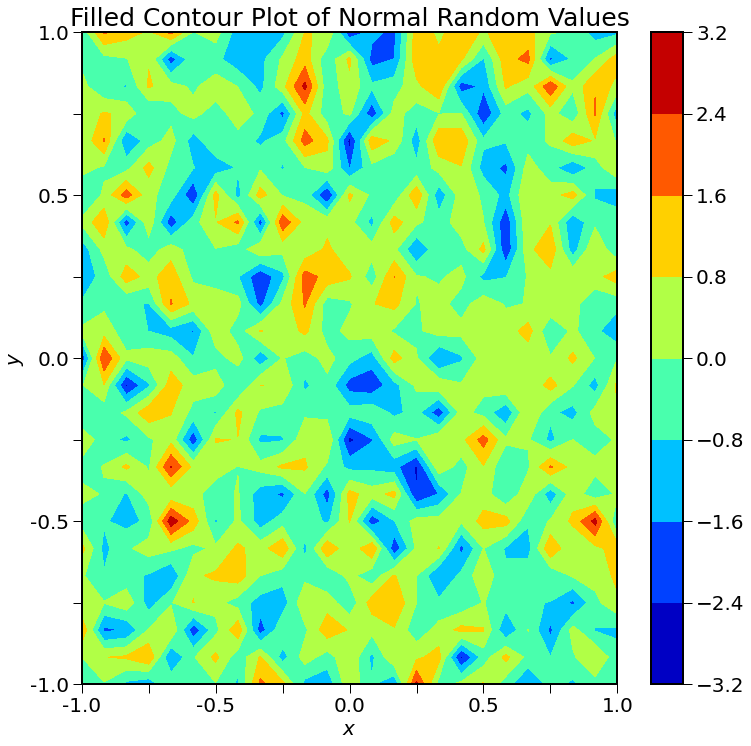

In [ ]:
#9.2.1
# set up variables
x, y = np.linspace(-1, 1, 25), np.linspace(-1, 1, 25)
z = np.random.standard_normal(size=(25,25))

#set up figure 
fig, ax = plt.subplots(1,figsize=(12,12))

# plot contour plot
mymap = ax.contourf(x,y,z, cmap=cm1.get_cmap('jet'))

# creat and set labels
ticklabs = [-1., None, -.5, None, 0., None, .5, None, 1.]
ax.set_yticklabels(ticklabs)
ax.set_xticklabels(ticklabs)

ax.set_ylabel("$y$")
ax.set_xlabel("$x$")

ax.set_title("Filled Contour Plot of Normal Random Values")
fig.colorbar(mymap)

# show plot
fig.show()

<b> Plot Contour Color Maps for Random Values on a Map

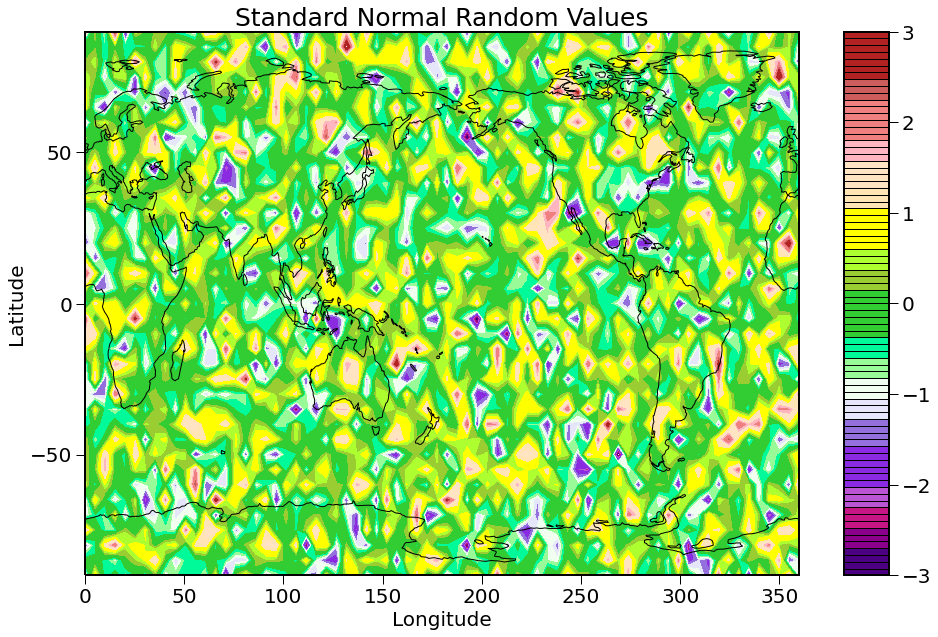

In [ ]:
#Fig 9.6
# plot a 5-by-5 grid of global map of standard normal random values
# set up varibles
lat = np.linspace(-90, 90, 37)
lon = np.linspace(0, 360, 72)

# create data to be plotted 
mapmat = np.random.standard_normal(size=(lat.size, lon.size))

levels = np.linspace(-3, 3, 81)

# set up figure 
fig, ax = plt.subplots(figsize=(16, 10))

ax = plt.subplot(1,1,1, projection=cartopy.crs.PlateCarree(central_longitude=180))
ax.coastlines()
ax.set_global()
ax.set_title("Standard Normal Random Values")

# create desired Colormap 
colors = ["darkred","firebrick","firebrick","indianred","lightcoral","lightcoral","lightpink"
          ,"bisque","moccasin","yellow","yellow","greenyellow","yellowgreen","limegreen","limegreen"
          ,"mediumspringgreen","palegreen","honeydew","lavender","mediumpurple",
         "blueviolet","blueviolet","mediumorchid","mediumvioletred","darkmagenta","indigo","black"]
colors.reverse()
myColMap = newColMap(colors)

# plot data
contf = ax.contourf(lon-180, lat, mapmat, levels
                    , cmap=myColMap)

# add labels and colorbar
colbar = plt.colorbar(contf, drawedges=True, aspect=12)
colbar.set_ticks([i for i in range(-3, 4)])
ax.set_aspect('auto')

ax.set_xticks([0, 50, 100, 150, 200, 250, 300, 350]
              ,crs=cartopy.crs.PlateCarree())
ax.set_xticklabels([0, 50, 100, 150, 200, 250, 300, 350])
ax.set_xlabel("Longitude")

ax.set_yticks([-50, 0, 50], crs= cartopy.crs.PlateCarree())
ax.set_ylabel("Latitude")

# show plot 
fig.show()

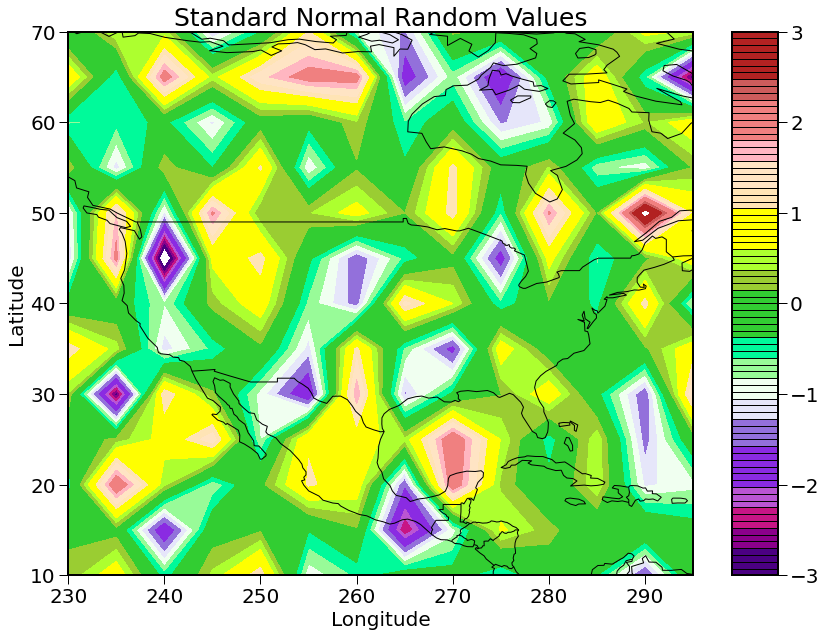

In [ ]:
#Fig 9.7
# plot a 5-by-5 grid regional map to cover USA and Canada 
# set up varibles 
lat3 = np.linspace(10, 70, 13)
lon3 = np.linspace(230, 295, 14)
mapdat = np.random.standard_normal(size=(lat3.size,lon3.size))

# set up figure
fig, ax = plt.subplots(figsize=(14,10))

ax = plt.subplot(111, projection=cartopy.crs.PlateCarree())
ax.set_extent([230, 295, 10, 65])
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS)
ax.set_title("Standard Normal Random Values")

# plot data 
contf = ax.contourf(lon3, lat3, mapdat, levels, cmap=myColMap)

# add colorbar and labels 
colbar = plt.colorbar(contf, drawedges=True, aspect=12)
colbar.set_ticks([i for i in range(-3, 4)])
ax.set_aspect('auto')

ax.set_yticks([10*i for i in range(1, 8)],crs=cartopy.crs.PlateCarree())
ax.set_ylabel("Latitude")

ax.set_xticks([10*i for i in range(-13, -6)], crs=cartopy.crs.PlateCarree())
ax.set_xticklabels([10*i for i in range(23,30)])
ax.set_xlabel("Longitude")

ax.tick_params(length=9)

# show plot 
fig.show()

<b> 9.2.3 Plot Contour Maps from Climate Model Data in NetCDF Files 

In [ ]:
#Import Data
datamat = nc.Dataset("air.mon.mean.nc")

NameError: name 'nc' is not defined

In [ ]:
#Preparing data for plotting 
Lon = datamat.variables['lon'][:]
Lat = datamat.variables['lat'][:]
Time = datamat.variables['time']
precnc = datamat.variables['air']

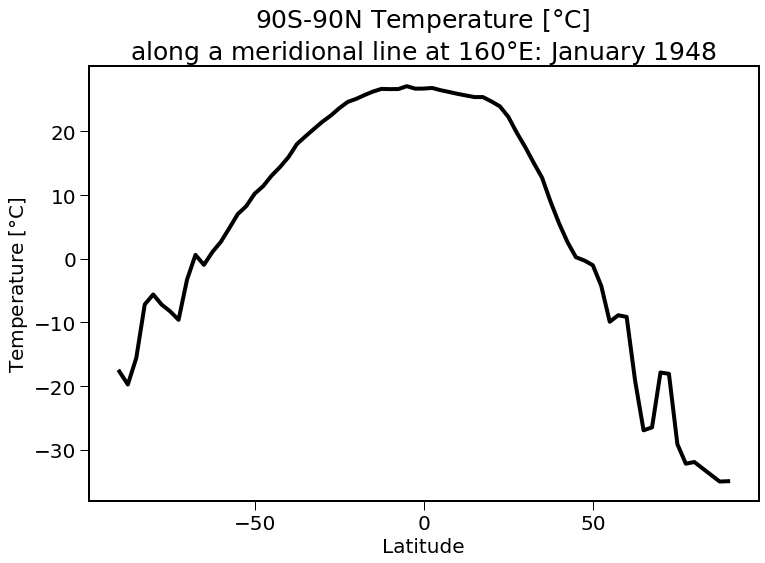

In [ ]:
#Fig 9.8
# set up figure
fig, ax = plt.subplots(1, figsize=(12,8))

# plot data 
ax.plot(np.linspace(90, -90, precnc.shape[1]), precnc[0, :, 64], '-k',
       linewidth=4)

# set labels and ticks
ax.set_ylabel("Temperature $[\degree$C]")
ax.set_yticks([10*i for i in range(-3, 3)])
ax.set_xlabel("Latitude")
ax.set_xticks([-50, 0, 50])
ax.set_title("90S-90N Temperature [$\degree$C] \nalong a meridional line at 160$\degree$E: January 1948")
ax.tick_params(length=9, width=1)

# show plot 
fig.show()

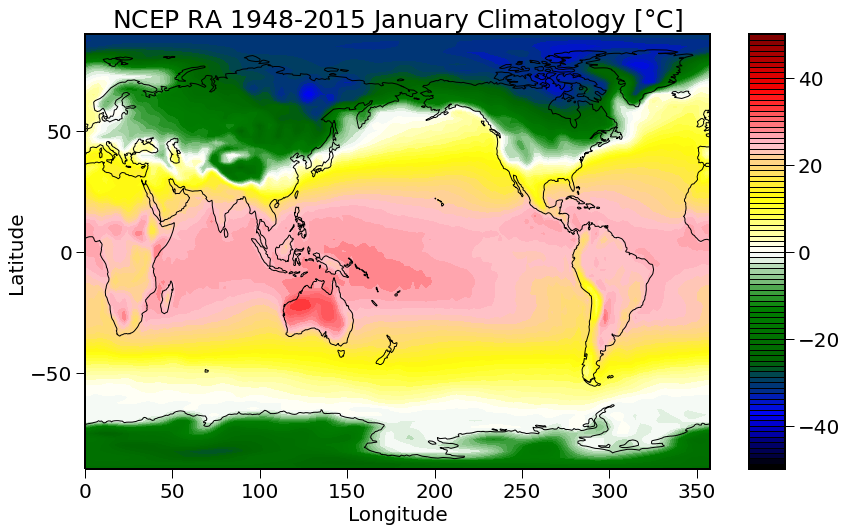

In [ ]:
#Fig 9.9(a)
#Compute and plot climantology and standard deviation Jan 1984 to Dec 2015

# set up variables for map
# number of colors that correspond to data values
contour_levels = np.linspace(-50,50,81)
# create color palette
myColMap = LinearSegmentedColormap.from_list(name='my_list', 
                                             colors=['black','blue','darkgreen','green','white','yellow',
                                                     'pink','red','maroon'], N=100)

JMon = precnc[12*np.arange(68)]
sdmat = np.std(precnc, axis=0)
climmat = np.mean(JMon, axis=0)
levels1 = np.linspace(-50, 50, 81)
levels2 = np.linspace(0, 20, 81)

# set up figure
fig, ax = plt.subplots(figsize=(14,8))

ax = plt.subplot(111, projection=cartopy.crs.PlateCarree(central_longitude=180))
ax.coastlines()
ax.set_title("NCEP RA 1948-2015 January Climatology [$\degree$C]")

# plot data
contf = ax.contourf(Lon-180, Lat, climmat, levels1, cmap=myColMap)

# add colorbar and labels
colbar = plt.colorbar(contf, drawedges=True, aspect=12, ticks=[])
colbar.set_ticks([20*i for i in range(-2, 3)])
ax.set_aspect('auto')

ax.set_yticks([50*i for i in range(-1, 2)],crs=cartopy.crs.PlateCarree())
ax.set_ylabel("Latitude")

ax.set_xticks([50*i for i in range(8)], crs=cartopy.crs.PlateCarree())
ax.set_xticklabels([50*i for i in range(8)])
ax.set_xlabel("Longitude")

ax.tick_params(length=9, width=1)

# show plot 
fig.show()

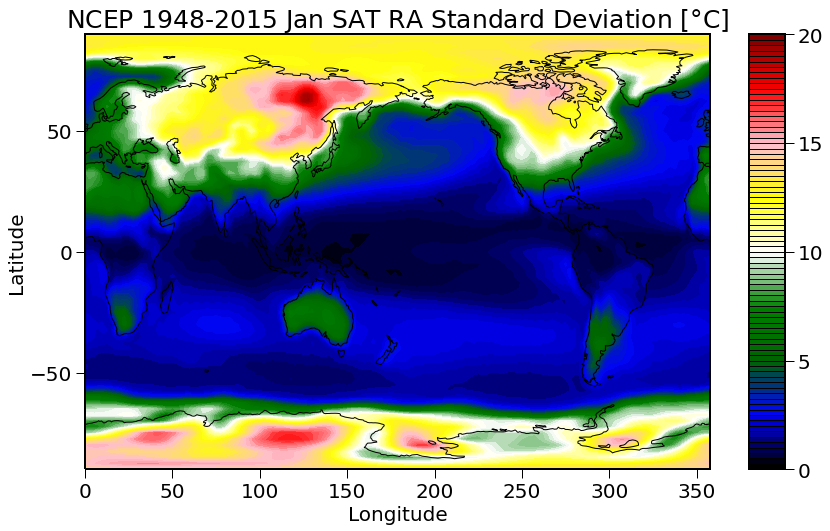

In [ ]:
#Fig 9.9(b)
# plot the standard deviation
# set up figure 
fig, ax = plt.subplots(figsize=(14,8))

ax = plt.subplot(111, projection=cartopy.crs.PlateCarree(central_longitude=180))
ax.coastlines()
ax.set_title("NCEP 1948-2015 Jan SAT RA Standard Deviation [$\degree$C]")

# plot data
contf = ax.contourf(Lon-180, Lat, sdmat, levels2, cmap=myColMap)

# add colorbar nd labels
colbar = plt.colorbar(contf, drawedges=True, aspect=12)
colbar.set_ticks([5*i for i in range(5)])
ax.set_aspect('auto')

ax.set_yticks([50*i for i in range(-1, 2)],crs=cartopy.crs.PlateCarree())
ax.set_ylabel("Latitude")

ax.set_xticks([50*i for i in range(8)], crs=cartopy.crs.PlateCarree())
ax.set_xticklabels([50*i for i in range(8)])
ax.set_xlabel("Longitude")

ax.tick_params(length=9, width=1)

# show and save figure 
fig.savefig("CH9;JanuarySTD.jpg", bbox_inches='tight');

<b> Plot Data for Displaying Climate Features

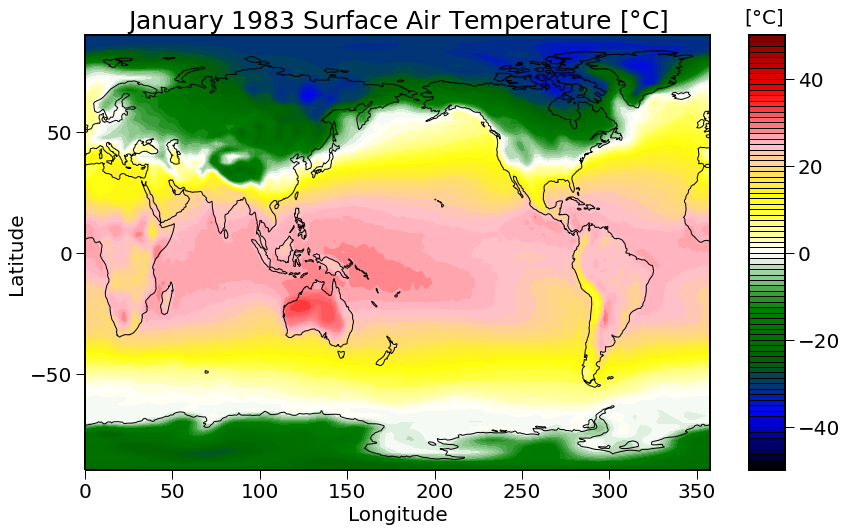

In [ ]:
#Fit 9.10
# plot the January 1983 temperature using the above setup
mapmat = climmat

# set up figure 
fig, ax = plt.subplots(figsize=(14,8))

ax = plt.subplot(111, projection=cartopy.crs.PlateCarree(central_longitude=180))
ax.coastlines()
ax.set_title("January 1983 Surface Air Temperature [$\degree$C]")

# plot data 
contf = ax.contourf(Lon-180, Lat, mapmat, levels1, cmap=myColMap)

# add colorbar and labels
colbar = plt.colorbar(contf, drawedges=True, aspect=12)
colbar.set_ticks([20*i for i in range(-2, 3)])
ax.set_aspect('auto')

ax.set_yticks([50*i for i in range(-1, 2)],crs=cartopy.crs.PlateCarree())
ax.set_ylabel("Latitude")

ax.set_xticks([50*i for i in range(8)], crs=cartopy.crs.PlateCarree())
ax.set_xticklabels([50*i for i in range(8)])
ax.set_xlabel("Longitude")

plt.text(197,95,"[$\degree$C]", size=20)

ax.tick_params(length=9, width=1)

# show figure 
fig.show()

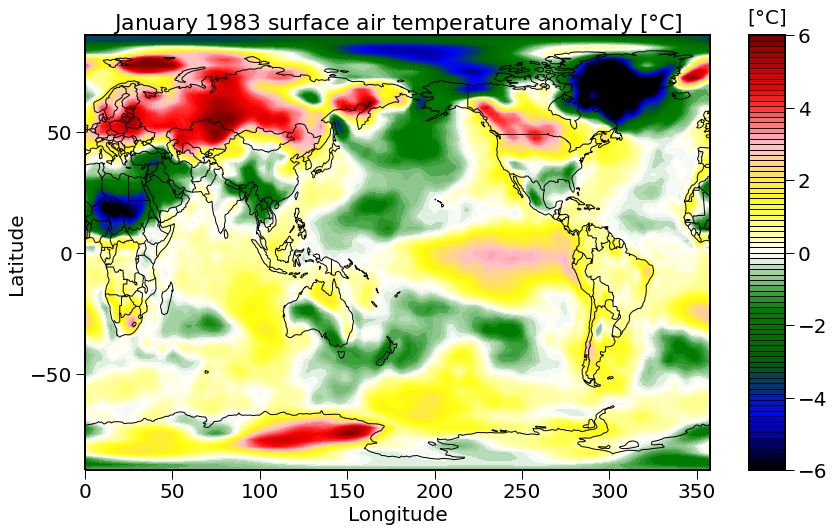

In [ ]:
#Fit 9.11
# plot the January 1983 anomaly from NCEP data
# create variables
levels1 = np.linspace(-6, 6, 81)
anomat = precnc[420,:,:] - climmat

# supress values into (-6,6) range
for i in range(73):
    for j in range(144):
        if anomat[i,j] > 6:
            anomat[i,j] = 6
        if anomat[i,j] < -6:
            anomat[i,j] = -6

# set up figure            
fig, ax = plt.subplots(figsize=(14,8))

ax = plt.subplot(111, projection=cartopy.crs.PlateCarree(central_longitude=180))
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black')
ax.set_title("January 1983 surface air temperature anomaly [$\degree$C]", size=22)

# plot data
contf = ax.contourf(Lon-180, Lat, anomat, levels1, cmap=myColMap)

# add colorbar and labels 
colbar = plt.colorbar(contf, drawedges=True, aspect=12)
colbar.set_ticks([2*i for i in range(-4, 4)])
ax.set_aspect('auto')

ax.set_yticks([50*i for i in range(-1, 2)],crs=cartopy.crs.PlateCarree())
ax.set_ylabel("Latitude")

ax.set_xticks([50*i for i in range(8)], crs=cartopy.crs.PlateCarree())
ax.set_xticklabels([50*i for i in range(8)])
ax.set_xlabel("Longitude")

plt.text(199,95,"[$\degree$C]", size=20)
ax.tick_params(length=9, width=1)

# show figure 
fig.show()

<b> Plot the January 1983 temperature anomaly from NCEP data

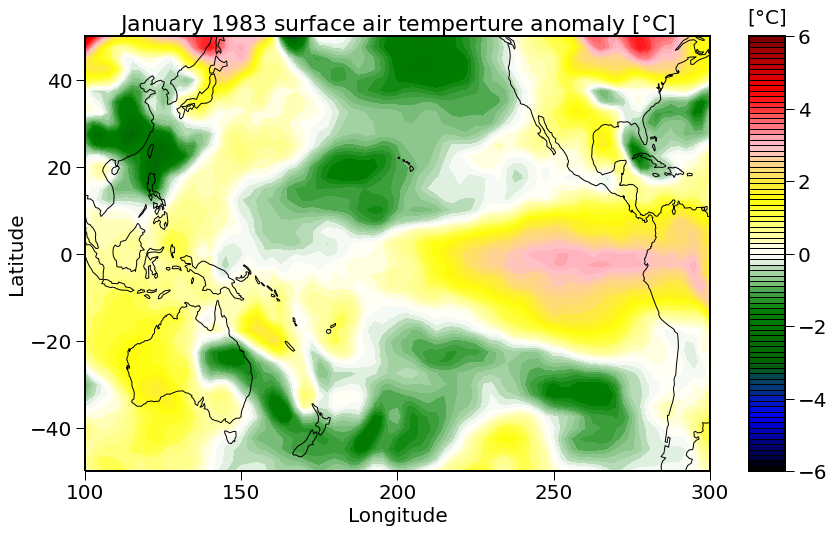

In [ ]:
#Fig 9.12(a)
# create and prepare variables 
myslice = range(144)
anomat = anomat[:,myslice]
int1 = np.linspace(-6,6,81)

# set up figure
fig, ax = plt.subplots(figsize=(14,8))

ax = plt.subplot(111, projection=cartopy.crs.PlateCarree(central_longitude=200))
ax.coastlines()
ax.set_title("January 1983 surface air temperture anomaly [$\degree$C]", size=22)

# plot contour 
contf = ax.contourf(Lon-180, Lat, anomat, int1, cmap=myColMap)

# add colorbar and labels
colbar = plt.colorbar(contf, drawedges=True, aspect=12)
colbar.set_ticks([2*i for i in range(-3, 4)])
ax.set_aspect('auto')

ax.set_yticks([20*i for i in range(-3, 3)],crs=cartopy.crs.PlateCarree())
ax.set_ylabel("Latitude")

ax.set_xticks([50*i for i in range(8)], crs=cartopy.crs.PlateCarree())
ax.set_xticklabels([50*i for i in range(8)])
ax.set_xlabel("Longitude")

ax.set_extent([100,300,50,-50],crs=cartopy.crs.PlateCarree())
ax.tick_params(length=9, width=1)

plt.text(112,53,"[$\degree$C]", size=20)

# show figure
fig.show()

In [ ]:
#Zoom in to a specific lat-lon region: Pacific

# prepare data 
JMon = list(12*np.arange(68))
climmat = np.zeros((144,73))
for i in range(144):
    for j in range(73):
        climmat[i,j] = np.mean(precnc[JMon,j,i])

anomat = precnc[420,:,:] - climmat.T

# suppress values into the (-5,5) range 
for i in range(73):
    for j in range(144):
        if anomat[i,j] > 5:
            anomat[i,j] = 5
        if anomat[i,j] < -5:
            anomat[i,j] = -5
            
matdiff = anomat
int1 = np.linspace(-5,5,81)

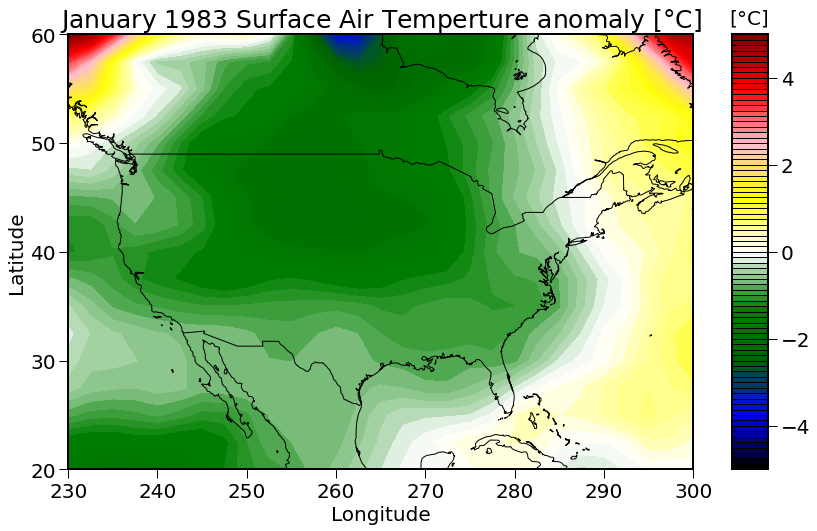

In [ ]:
#Fig 9.12(b)
# set up figure 
fig, ax = plt.subplots(figsize=(14,8))

ax = plt.subplot(111, projection=cartopy.crs.PlateCarree(central_longitude=250))
ax.coastlines()
ax.set_title("January 1983 Surface Air Temperture anomaly [$\degree$C]")

# plot data 
contf = ax.contourf(Lon-180, Lat, matdiff, int1, cmap=myColMap)

# add colorbar and labels 
colbar = plt.colorbar(contf, drawedges=True, aspect=12)
colbar.set_ticks([2*i for i in range(-3, 4)])
ax.set_aspect('auto')

ax.set_yticks([10*i for i in range(2, 7)],crs=cartopy.crs.PlateCarree())
ax.set_ylabel("Latitude")

ax.set_xticks([200+i*(10) for i in range(3,11)], crs=cartopy.crs.PlateCarree())
ax.set_xticklabels([200+i*(10) for i in range(3,11)])
ax.set_xlabel("Longitude")

ax.set_extent([230,300,20,60],crs=cartopy.crs.PlateCarree())
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black')
ax.tick_params(length=9, width=1)

plt.text(54,61,"[$\degree$C]", size=20)

# show figure 
fig.show()

In [ ]:
datamat.close()

_______
# 9.3 Plot Wind Velocity Field on a Map 
_______

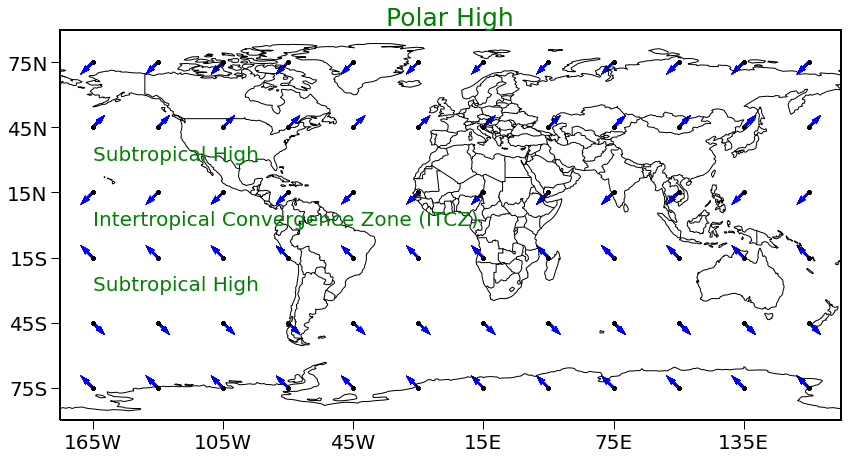

In [ ]:
#Fig 9.13
# preapre variables 
lat = np.repeat(np.linspace(-75,75,num = 6),12)
lon = np.repeat(np.linspace(-165,165,num=12),6)

# create wind vector variables
u = np.repeat([-1,1,-1,-1,1,-1],864)
v = np.repeat([1,-1,1,-1,1,-1],864)

X, Y = np.meshgrid(lon, lat)

# set up figure
fig, ax = plt.subplots(figsize=(14,8))

ax = plt.axes(projection=cartopy.crs.PlateCarree())
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black')

# plot every wind vector in for loop
for i in lon:
    for j in lat:
        plt.plot(i,j, markersize=3, marker='o', color='black')

# create the quiver plot
ax.quiver(X,Y,u,v, scale=65, color="blue")

# add labels and text
ax.text(-30,92,"Polar High", color="green", size=25)
ax.text(-165,30,"Subtropical High", color="green", size = 20)
ax.text(-165,0,"Intertropical Convergence Zone (ITCZ)", color="green", size = 20)
ax.text(-165,-30,"Subtropical High", color="green", size = 20)

ax.axis([-180,180,-90,90])
ax.set_xticks([-165,-105,-45,15,75,135], crs=cartopy.crs.PlateCarree())
ax.set_yticks([-75,-45,-15,15,45,75], crs=cartopy.crs.PlateCarree())

# format lon and lat 
lon_formatter = LongitudeFormatter(degree_symbol='',
                                       dateline_direction_label=True)
lat_formatter = LatitudeFormatter(degree_symbol='')
ax.xaxis.set_major_formatter(lon_formatter)
ax.yaxis.set_major_formatter(lat_formatter)

# show figure 
plt.show()

In [ ]:
#-- open netcdf file
ncd = nc.Dataset('uvclm95to05.nc')

#-- read variable
u10 = ncd.variables['u'][0,:,:]
v10 = ncd.variables['v'][0,:,:]
lat = ncd.variables['lat'][::-1]
lon = ncd.variables['lon'][:]

In [ ]:
#Fig 9.14 
#The NOAA sea wind field of January 1, 1995. 

#Similar example can be found at the following URL:
#https://www.dkrz.de/up/services/analysis/visualization/sw/python-matplotlib/matplotlib-sourcecode/python-matplotlib-example-vector-plot

ncd.close()

_____
# 9.4 GG-Plot for Data 

In [ ]:
# create dict of state names and labels
state_names = {"AL":"Alabama","AK":"Alaska","AZ":"Arizona","AR":"Arkansas","CA":"California","CO":"Colorado"
               ,"CT":"Connecticut","DE":"Delaware","FL":"Florida","GA":"Georgia","HI":"Hawaii","ID":"Idaho"
               ,"IL":"Illinois","IN":"Indiana","IA":"Iowa","KS":"Kansas","KY":"Kentucky","LA":"Louisiana"
               ,"ME":"Maine","MD":"Maryland","MA":"Massachusetts","MI":"Michigan","MN":"Minnesota","MS":"Mississippi"
               ,"MO":"Missouri","MT":"Montana","NE":"Nebraska","NV":"Nevada","NH":"New Hampshire"
               ,"NJ":"New Jersey","NM":"New Mexico","NY":"New York","NC":"North Carolina","ND":"North Dakota"
               ,"OH":"Ohio","OK":"Oklahoma","OR":"Oregon","PA":"Pennsylvania","RI":"Rhode Island","SC":"South Carolina","SD":"South Dakota","TN":"Tennessee","TX":"Texas","UT":"Utah","VT":"Vermont","VA":"Virginia","WA":"Washington","WV":"West Virginia","WI":"Wisconsin","WY":"Wyoming"}

# create state Abbreviations
state_abr = ["AL", "AK", "AZ", "AR", "CA", "CO", "CT", "DC", "DE", "FL", "GA", 
          "HI", "ID", "IL", "IN", "IA", "KS", "KY", "LA", "ME", "MD", 
          "MA", "MI", "MN", "MS", "MO", "MT", "NE", "NV", "NH", "NJ", 
          "NM", "NY", "NC", "ND", "OH", "OK", "OR", "PA", "RI", "SC", 
          "SD", "TN", "TX", "UT", "VT", "VA", "WA", "WV", "WI", "WY"]
state_df = pd.DataFrame({"State ":list(state_names.values()),"Abbreviation ":list(state_names.keys())})

In [ ]:
#Fig 9.15
# set up and create figure 
fig = px.choropleth(state_df,  # Input Pandas DataFrame
                    locations="Abbreviation ",  # DataFrame column with locations
                    color="State ",  # DataFrame column with color values
                    locationmode = 'USA-states',
                   color_continuous_scale = 'rainbow') # Set to plot as US States

# update layout of interactive plot 
fig.update_layout(
    title_text = 'Color Map of the 48 Lower States', # Create a Title
    geo_scope='usa',  # Plot only the USA instead of globe
)

# show figure
fig.show()

_____
# 9.5 Animation 
_____

In [ ]:
#This animation is slightly different from Fig 9.16, but it involoves all the same components 
#as the example presented in the book.  

# set up variables 
WIDTH = 800
HEIGHT = 500
SIZE = 50

# create animation canvas 
tk = Tk()
canvas = Canvas(tk, width=WIDTH, height=HEIGHT, bg="blue")
canvas.pack()
color = 'mediumvioletred'

In [ ]:
# create a class names ball, in order to animate the characteristics of each ball in the animation
class Ball:
    def __init__(self, tag):
        self.shape = canvas.create_oval(0, 0, SIZE, SIZE, fill=color, tags=tag)
        self.speedx = 9 # changed from 3 to 9
        self.speedy = 9 # changed from 3 to 9
        self.active = True

    def ball_update(self):
        canvas.move(self.shape, self.speedx, self.speedy)
        pos = canvas.coords(self.shape)
        if pos[2] >= WIDTH or pos[0] <= 0:
            self.speedx *= -1
        if pos[3] >= HEIGHT or pos[1] <= 0:
            self.speedy *= -1

In [ ]:
# create the function in which the ball will be an immediate on a particular cycle
global switcher
switcher = True
def cycle():
    global switcher
    canvas.tag_raise("bg")
    if switcher:
        ball2.ball_update()
        ball2.ball_update()
        canvas.tag_raise("ball")
    else:
        ball.ball_update()
        ball.ball_update()
        canvas.tag_raise("ball2")
    tk.update_idletasks()
    switcher = not switcher
    tk.after(40, cycle)


In [ ]:
#Similar to Fig 9.16
# creates the frame for the animation
bg = canvas.create_rectangle(0, 0, WIDTH+1, HEIGHT+1, fill="lavenderblush", tags="bg")

# creates the ball instance 
ball = Ball("ball")

# animates the ball
ball.ball_update()
ball2 = Ball("ball2")

# creates the cycle at which the ball will be animated 
tk.after(0, cycle)

# compile and show animation 
tk.mainloop()

______
# Chapter 10: Advanced Python Analysis and Plotting: EOFs, Trends, and Global Data 
_______

In [ ]:
import numpy as np 
import matplotlib
from matplotlib import cm as cm1
import matplotlib.pyplot as plt
import pandas as pd
import warnings
import os
warnings.filterwarnings("ignore")

from scipy import optimize as opt
import sympy as sm
import math as m
import os
import cartopy 
import netCDF4 as nc
from matplotlib.colors import LinearSegmentedColormap
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from mpl_toolkits.basemap import Basemap, cm, shiftgrid, addcyclic
from matplotlib.patches import Polygon

from datetime import datetime

import cartopy.crs as ccrs
import cartopy.feature as cfeature

from scipy.ndimage import gaussian_filter
from sklearn import datasets, linear_model
from sklearn.neighbors import KernelDensity as kd
from sklearn.linear_model import LinearRegression
from pylab import *

______
# 10.2: 2Dim Spatial Domain EOFs and 1Dim Temporal PCs 
_______

In [ ]:
# create two arrays, x and y, ranging from 0 to 2pi 
# create a 3D array full of zeros for use later
x = y = np.linspace(0.,2*np.pi,100)
mydat = np.zeros((100,100,10))

# define a function that iterates term by term for the two variables into a specific function
def zfunc(x,y):
    # the triple nested for loop accomplishes term by term order we are looking for
    for t in range(0,10,1):
        for i in range(0,100):
            for j in range(0,100):
                mydat[i,j,t] = (np.sin(t)*(1/np.pi)*np.sin(x[i])*np.sin(y[j]) 
                                + np.exp(-.3*t)*(1/np.pi)*np.sin(8*x[i])*np.sin(8*y[j]))
    
    # print the shape and maximum of the result
    print(np.shape(mydat))
    print(np.max(mydat))
    return mydat


# plug in our x and y arrays 
mydata = zfunc(x,y)

(100, 100, 10)
0.4909421672431401


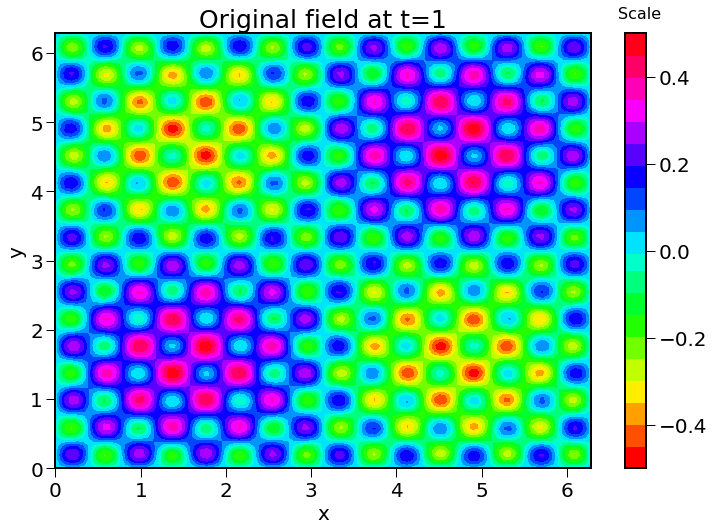

In [ ]:
#Fig 10.1
# set a range for the contour plot
maxi = np.linspace(-.5,.5,100)

# define the contour plot using previous x, y, and mydata arrays
cmap = cm.get_cmap('hsv', 20)
CS = plt.contourf(x,y,mydata[:,:,1],maxi,cmap=cmap)

# add titles for the graph and axes
plt.title('Original field at t=1')
plt.xlabel('x')
plt.ylabel('y')

# add a color bar with a label

cbar = plt.colorbar(CS, ticks=[0.4,0.2,0,-0.2,-0.4])
plt.text(6.6, 6.5, "Scale", size=16)

# show figure
plt.show()

In [ ]:
# check the shape of mydata
mydata.shape

(100, 100, 10)

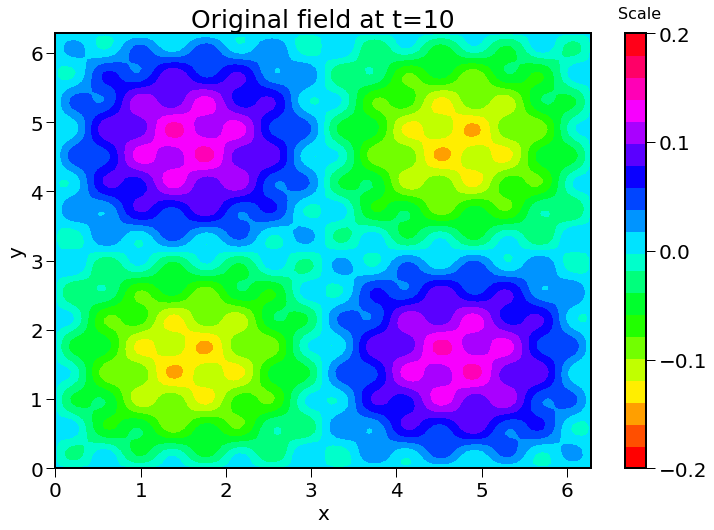

In [ ]:
# set a range for the contour plot
maxi = np.linspace(-.2,.2,100)

# define the contour plot using previous x, y, and mydata arrays
cmap = cm.get_cmap('hsv', 20)
CS = plt.contourf(x,y,np.flip(mydata[:,:,9], axis=1),maxi,cmap=cmap)

# add titles for the graph and axes
plt.title('Original field at t=10')
plt.xlabel('x')
plt.ylabel('y')

# add a color bar with a label
cbar = plt.colorbar(CS, ticks=[0.2,0.1,0,-0.1,-0.2])
plt.text(6.6, 6.5, "Scale", size=16)

# save figure as a .png file
plt.show()

In [ ]:
# define variables
x = y = np.linspace(0.,2.*np.pi,100)

# create a matrix of zeros of size (10000,10)
da = np.matrix(np.zeros((np.size(x)*np.size(y),10)))

# define a function that reshapes mydata into a new array of size
def twod_func(x,y,a):
    for i in range(0,10):
        a[:,i] = np.reshape(mydata[:,:,i],(10000,1))
    return a
    
da1 = twod_func(x,y,da)
# SVD for EOFs
u, s, vh = np.linalg.svd(da1,full_matrices=False) 
v = np.transpose(vh)

# to show the accuracy of the svd
x_a = np.dot(np.dot(u,np.diag(s)),vh)

# create an array of zeros of size (100,100)
u2 = np.zeros((100,100))

# define a function that takes all the entries in the first column
# of the u matrix, transposes it and reshapes it into size (100,100)
def dig():
    y1 = np.transpose(u[:,0])
    u2 = np.reshape(-y1,(100,100))
    return u2

def dig2():
    y1 = np.transpose(u[:,1])
    u2 = np.reshape(-y1,(100,100))
    return u2

# create zero matrix, as well as u-mat, from the dig fuction and u-mat2 from the dig2 fuction
zeros = np.zeros((100,100))
u_mat = dig()
u_mat2 = dig2()

In [ ]:
# define two more functions that call upon the above z functions to generate spatial data
def fcn1(x,y):
    for i in range(0,100):
        for j in range(0,100):
            zeros[i,j] = z1(x[i],y[j])
    return zeros

def fcn2(x,y):
    for i in range(0,100):
        for j in range(0,100):
            zeros[i,j] = z2(x[i],y[j])
    return zeros

#define two different funcitons to be used below
def z1(x,y):
    return (1./np.pi)*np.sin(x)*np.sin(y)

def z2(x,y):
    return (1./np.pi)*np.sin(5.*x)*np.sin(5.*y)

In [ ]:
# create desired Colormap
colors = ["crimson","red","red","red","tomato","lightpink",
          "pink","peachpuff","yellow","yellow", "yellowgreen","limegreen","limegreen","white","lavenderblush",
          "darkorchid","indigo","indigo","rebeccapurple","darkmagenta","mediumvioletred","mediumvioletred","black"]
colors.reverse()
cmap = newColMap(colors)

colors1 = ["crimson","red","tomato","lightpink",
          "pink","peachpuff","yellow", "yellowgreen","limegreen","white","lavenderblush",
          "darkorchid","indigo","rebeccapurple","darkmagenta","mediumvioletred","black"]
colors1.reverse()
cmap1 = newColMap(colors1)

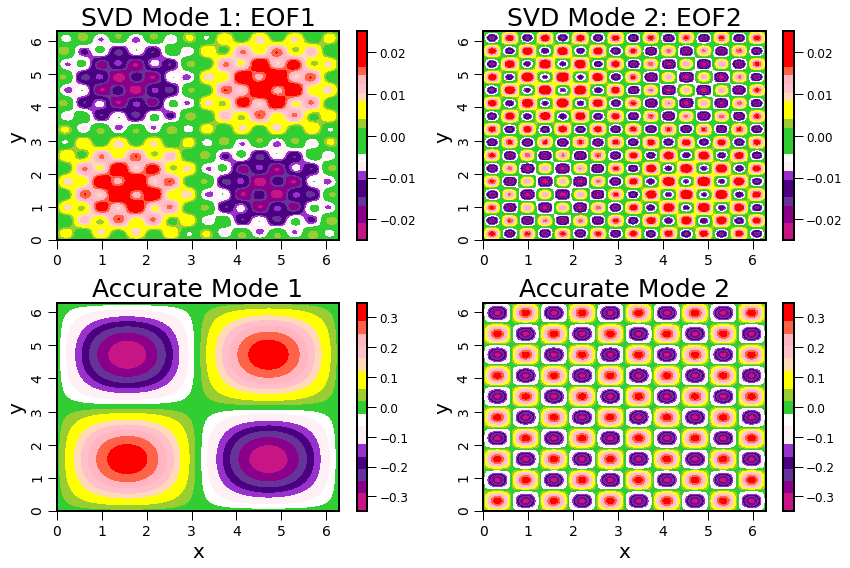

In [ ]:
#Fig 10.2
# graph the EOF
size = np.linspace(-2.5e-2,2.5e-2,25)
bounds = np.array([-0.02,-0.01,0.0,.01,0.02])
bounds_d = np.array([-0.3,-0.2,-0.1,0,0.1,0.2,0.3])

# set up the figure
plt.subplot(221)

# plot the data
dig = plt.contourf(x,y,np.flip(u_mat,axis=1),size,cmap=cmap)

# set labels and title
plt.title('SVD Mode 1: EOF1')
plt.ylabel('y')
plt.xticks([0,1,2,3,4,5,6], size=14)
plt.yticks([0,1,2,3,4,5,6],rotation=90, size=14)

# print colorbar
cbar = plt.colorbar(dig, ticks = bounds)
cbar.ax.tick_params(labelsize='large')

# create second plot 
plt.subplot(223)
lvl = np.linspace(-.35,.35,35)

# plot data and set labels
contour = plt.contourf(x,y,fcn1(x,y),lvl,cmap=cmap1)

plt.title('Accurate Mode 1')
plt.xlabel('x')
plt.ylabel('y')
plt.yticks([0,1,2,3,4,5,6], rotation=90, size=14)
plt.xticks([0,1,2,3,4,5,6], size=14)

cbar = plt.colorbar(contour, ticks = bounds_d)
cbar.ax.tick_params(labelsize='large')

# plot third plot
plt.subplot(222)
dig = plt.contourf(x,y,np.flip(u_mat2,axis=1),size,cmap=cmap)

plt.title('SVD Mode 2: EOF2')
plt.ylabel('y')
plt.yticks([0,1,2,3,4,5,6],rotation=90, size=14)
plt.xticks([0,1,2,3,4,5,6], size=14)

cbar = plt.colorbar(dig, ticks = bounds)
cbar.ax.tick_params(labelsize='large')


# plot fourth plot
plt.subplot(224)
lvl = np.linspace(-.35,.35,35)
contour = plt.contourf(x,y,fcn2(x,y),lvl,cmap=cmap1)

plt.title('Accurate Mode 2')
plt.xlabel('x')
plt.ylabel('y')
plt.yticks([0,1,2,3,4,5,6],rotation=90, size=14)
plt.xticks([0,1,2,3,4,5,6], size=14)

plt.tight_layout()

cbar = plt.colorbar(contour, ticks = bounds_d)
cbar.ax.tick_params(labelsize='large')

plt.show()

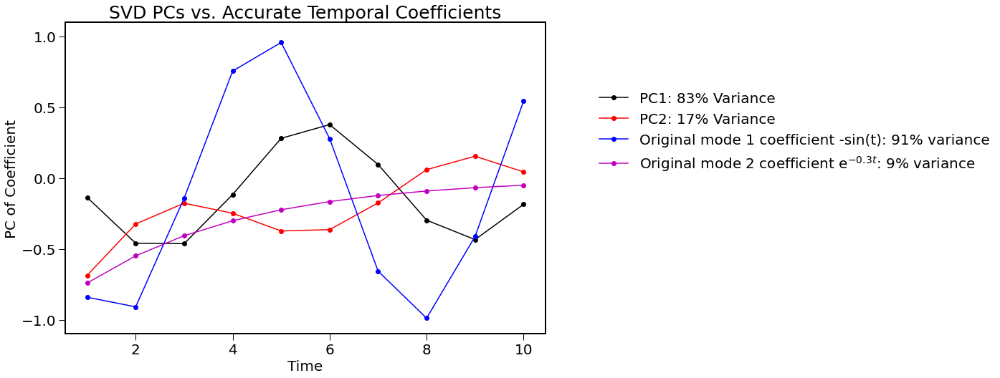

In [ ]:
#Fig 10.3
# create variable
t = np.array(range(1,11))

# plot seperate lines based on different formulas
plt.plot(t,-v[:,0],color='k',marker='o',label='PC1: 83% Variance')
plt.plot(t,-v[:,1],color='r',marker='o',label='PC2: 17% Variance')
plt.plot(t,-np.sin(t),color='b',marker='o',label='Original mode 1 coefficient -sin(t): 91% variance')
plt.plot(t,-np.exp(-.3*t),color='m',marker='o',label='Original mode 2 coefficient e$^{-0.3t}$: 9% variance')

# set labels
plt.ylim(-1.1,1.1)

plt.xlabel('Time')
plt.ylabel('PC of Coefficient')
plt.yticks([1,0.5,0,-0.5,-1])
plt.title('SVD PCs vs. Accurate Temporal Coefficients')

# show legend and plot 
plt.legend(loc=(1.1,.5), fontsize=20)
plt.show()

In [ ]:
# create arrays to compute a dot product
t = np.array(range(1,11))

# make sine function
def sinarr(t):
    rslt = np.zeros(t)
    for ii in range(1,t+1):
        rslt[ii-1] = -np.sin(ii)
    return rslt

# make exponential function
def exparr(t):
    rslt = np.zeros(t)
    for jj in range(1,t+1):
        rslt[jj-1] = -np.exp(-.3*jj)
    return rslt

In [ ]:
# create variables using above functions
sin = sinarr(10)
exp = exparr(10)
print('The dot product is:',np.dot(np.transpose(sin),exp))

# find the variances and compare them
v1 = np.var(sin)
v2 = np.var(exp)
print("Variance: ",v1/(v1+v2))

# find the product of the PC's
v_1 = np.transpose(v[:,0])
v_2 = v[:,1]
print("The dot product of PCs is:" , np.dot(v_1,v_2))

The dot product is: 0.8625048359266786
Variance:  0.9098719287510537
The dot product of PCs is: [[2.35922393e-16]]


In [ ]:
# create arrays that will be used below 
# and check the sizes of the arrays for matrix multiplication
sdiag = np.diag(s)
vtran = np.transpose(v[:,0:1])

# create two new arrays, B and B1 multiplying the previous
# matrices together, being careful to match their sizes
B = np.transpose(np.matmul(np.matmul(u[:,0:1],sdiag[0:1,0:1]),vtran))
B1 = np.matmul(np.matmul(u,sdiag),np.transpose(v))

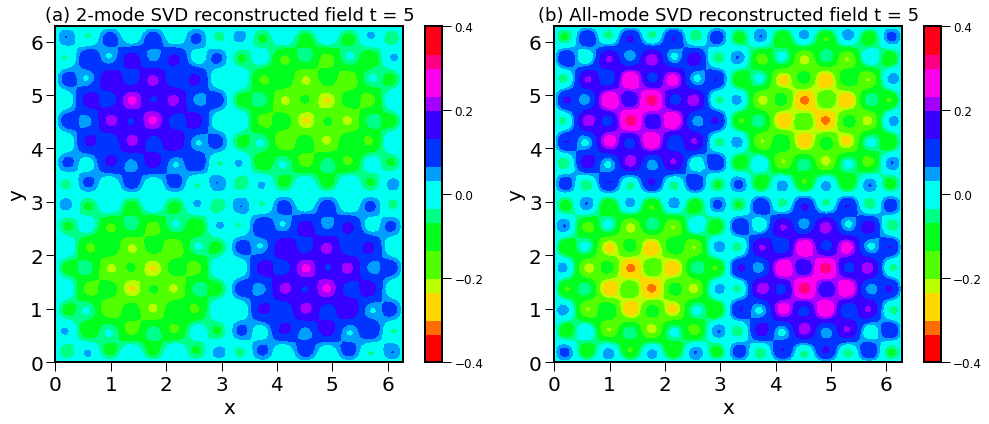

In [ ]:
#Fig 10.4
# reshaping B to plot it
BB = np.reshape(B[4,:],(100,100))
scale = np.linspace(-.4,.4,25)
bounds = [0.4,0.2,0,-0.2,-0.4]

cmap = cm.get_cmap('hsv', 15)

# set up figure
fig = plt.figure(figsize=(14,6))

# create subplot
plt.subplot(121)
BBplot = plt.contourf(x,y,BB,scale,cmap = cmap)

# set labels 
plt.title('(a) 2-mode SVD reconstructed field t = 5', size=18)
plt.xlabel('x')
plt.ylabel('y')
plt.xticks([0,1,2,3,4,5,6])

# print colorbar
cbar = plt.colorbar(BBplot, ticks=bounds)
cbar.ax.tick_params(labelsize='large')


# reshaping B to plot it
new_B = B1.T
BB = np.reshape(new_B[4,:],(100,100))

# create subplot
plt.subplot(122)
BBplot = plt.contourf(x,y,BB,scale,cmap = cmap)

# set labels
plt.title('(b) All-mode SVD reconstructed field t = 5', size=18)
plt.xlabel('x')
plt.ylabel('y')
plt.xticks([0,1,2,3,4,5,6])

# create colorbar
cbar = plt.colorbar(BBplot, ticks=bounds)
cbar.ax.tick_params(labelsize='large')

plt.tight_layout()

______
# 10.3 From Climate Data Download to EOFs and PC Visualization: An NCEP/NCAR Reanalysis Example
_______

In [ ]:
#Download the following data set from NOAA into your active folder
#https://www.esrl.noaa.gov/psd/repository/entry/show?
#entryid=synth%3Ae570c8f9-ec09-4e89-93b4-babd5651e7a9%
#3AL25jZXAucmVhbmFseXNpcy5kZXJpdmVkL3N1cmZhY2UvYWlyLm1vbi5tZWFuLm5j

ncd = nc.Dataset("air.mon.mean.nc","r+")

In [ ]:
#Define variables
lon_vals = ncd.variables['lon']
lat_vals = ncd.variables['lat']
time = ncd.variables['time']
air = ncd.variables['air']
time_unit = time.units
precnc = ncd.variables['air']

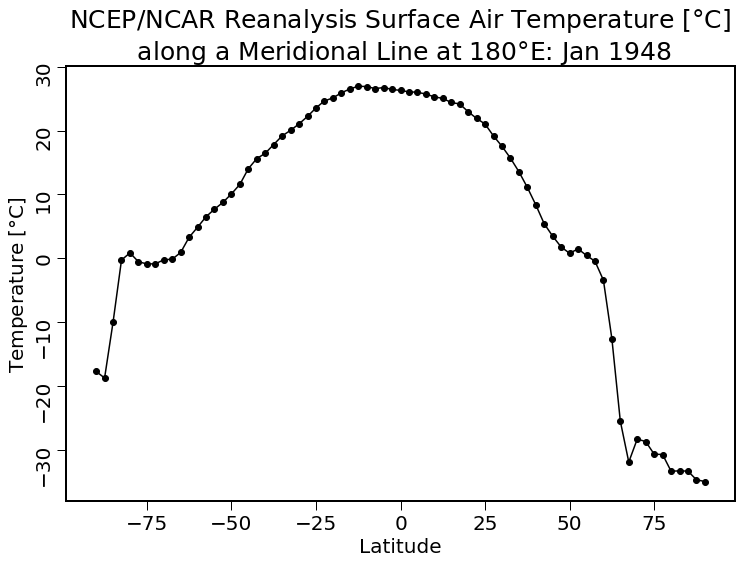

In [ ]:
#Fig 10.5
# plot the data along a meridional line
# plot a 90S-90N temp along a meridional line at 180E
# create variables
nc_x = np.linspace(-90,90,73)
y = list(precnc[0,:,71])
y.reverse()


# plot data
plt.plot(nc_x,y,marker="o",color='k' )

# set labels and show figure
plt.xlabel('Latitude')
plt.ylabel('Temperature [$\degree$C]')
plt.yticks(rotation=90)
plt.title('NCEP/NCAR Reanalysis Surface Air Temperature [$\degree$C] \n along a Meridional Line at $180\degree$E: Jan 1948')
plt.show()

In [ ]:
list(precnc[0,:,71]).reverse()

In [ ]:
precnc.shape

(826, 73, 144)

In [ ]:
# define Variables 
precst = np.zeros((10512,826))

temp = np.reshape(precnc[0,:,:],(144*73))
print(np.shape(temp))
print(temp[0:6])

# create reshaping function
def spmat(x,y):
    for i in range(0,826):
        y[:,i] = np.reshape(x[i,:,:],(144*73))
    return y

# use fuction and save result
precst2 = spmat(precnc,precst)

print(np.shape(precst2))

# build lat and lon for 10512 spatial positions using rep
def rep(x,y,n):
    for j in range(0,n):
        x = np.append(x,y)
    return x

arra = np.zeros((0))
LAT = rep(arra,lat_vals,144)
LON = rep(arra,lon_vals[0],73)
print(LON)

# create reconstruct function
def recon():
    rslt = LON
    for jj in range(0,143):
        rslt = np.append(rslt,rep(arra,lon_vals[jj],73))
    return rslt
LON2 = recon()
print("The last 6 entries are:",LON2[-6:])

# creating an array with first two columns of lat and lon
# with 826 months spanning from 1948-2016
gpcpst_ = np.column_stack((LAT,(LON2)))
gpcpst = np.column_stack((gpcpst_,precst2))

(10512,)
[-34.926773 -34.926773 -34.926773 -34.926773 -34.926773 -34.926773]
(10512, 826)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]
The last 6 entries are: [355. 355. 355. 355. 355. 355.]


In [ ]:
# create an array of all ones for the days of the data
ones = np.ones(826)

# define a function to create a list of months repeating to match
# the size of our data
def monthfunc():
    montharr = np.zeros(0)
    for i in range(1,71):
        for j in range(1,13):
             montharr = np.append(montharr,int(j))
    for k in range(1,6):
        montharr = np.append(montharr,int(k))
    return montharr

months = monthfunc()

# define a functionto create a list of years to match the
# size of our data
def yearfunc():
    yeararr = np.zeros(0)
    for i in range(1948,2018):
        for j in range(1,13):
            yeararr = np.append(yeararr,i)
    for k in range(1,6):
        yeararr = np.append(yeararr,2018)
    return yeararr

years = yearfunc()

# define a function that pairs a string version of our year and
# month arrays with a dash in between these will serve as our column names for our data
def tmfunc():
    empty = np.zeros(0)
    for i in range(0,826):
        empty = np.append(empty,str(years[i])  + '-'  + str(months[i]))
    return empty

tm1 = tmfunc()

# add the 'Lat' and 'Lon' columns to the beginning
# of our column names array
tm2 = np.append(['Lat','Lon'],tm1)

In [ ]:
# use the package pandas.DataFrame to match the column names with the data
GPCPST = pd.DataFrame(gpcpst,columns=tm2)

monJ = np.array(range(0,826,12))
gpcpdat = GPCPST.iloc[:,2:826]
gpcpJ = gpcpdat.iloc[:,monJ]
climJ = gpcpJ.mean(axis=1)

# ccreate desired functions
def rowSDS2():
    rslt = []
    for jj in range(0,10512):
        rslt = np.append(rslt,np.std(gpcpJ.iloc[jj,:]))
    return rslt

sdJ = gpcpJ.std(axis=1)

def anomJ_func2():
    rslt = pd.DataFrame(np.zeros((10512, 69)),columns=tm1[monJ])
    for i in range(0,69):
        rslt.iloc[:,i] = (gpcpdat.iloc[:,monJ[i]]-climJ)/sdJ
    return rslt

anomJ = anomJ_func2()

def anomJ_func3():
    rslt = pd.DataFrame(np.zeros((10512, 69)),columns=tm1[monJ])
    for i in range(0,69):
        rslt.iloc[:,i] = np.sqrt(np.cos(GPCPST.iloc[:,0]*np.pi/180.))*anomJ.iloc[:,i]
    return rslt
        
anomAW = anomJ_func3()

# computing SVD from the area-weighted anomaly matrix anomAW
U, S, Vh = np.linalg.svd(anomAW,full_matrices=False)

In [ ]:
print(U.shape,S.shape,Vh.shape)

(10512, 69) (69,) (69, 69)


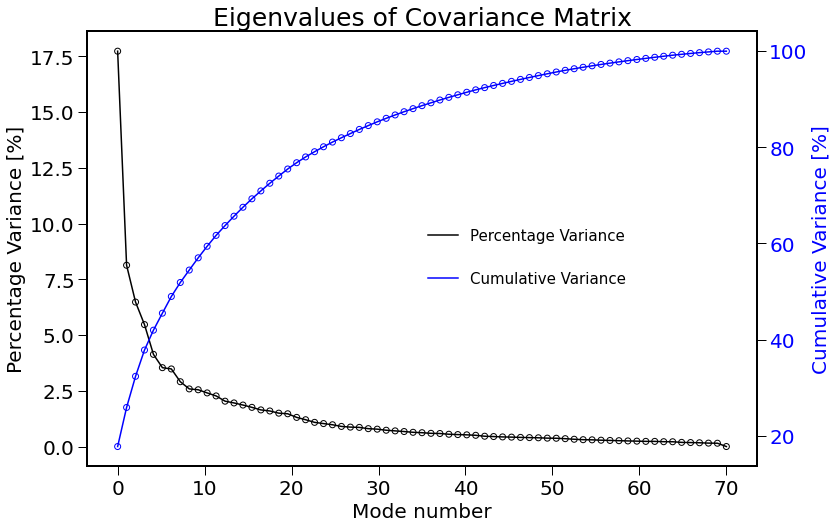

In [ ]:
#Fig 10.6
# create variables
xvals = np.linspace(0.,70.,69)
yvals = 100.*(S**2.)/np.sum(S**2)

# create two subplots
fig, ax1 = plt.subplots()

# plot of first plot
ax1.scatter(xvals,yvals,marker = "o",facecolors='none',edgecolors='k')
ax1.plot(xvals,yvals,color='k',label = "Percentage Variance ")
ax1.set_ylabel('Percentage Variance [%]',color='k')
ax1.set_xlabel('Mode number',color='k')
ax1.tick_params(axis='y',labelcolor='k')

# twin the axis to prepare second plot
ax2 = ax1.twinx()

# plot data on second axis 
ax2.scatter(xvals,yvals.cumsum(),marker = "o",facecolors='none',edgecolors='b')
ax2.plot(xvals,yvals.cumsum(),color='b',label = "Cumulative Variance")

# set labels
ax2.set_ylabel('Cumulative Variance [%]',color='b')
ax2.tick_params(axis='y',labelcolor='b')


ax1.legend(loc=(.5,.5))
ax2.legend(loc=(.5,.4))
plt.title("Eigenvalues of Covariance Matrix")

# show figure
plt.show()

In [ ]:
# define Fucntion
def mapmatr():
    q = np.zeros((144,73))
    for ii in range(0,144):
        q[ii,:] = U[:,0]/(np.sqrt(np.cos(gpcpst[:,0]
          *np.pi/180.)))
    return q

# reshape data using result of SVD 
mapmatr = (np.reshape(U[:,0]/(np.sqrt(np.cos(gpcpst[:,0]
          *np.pi/180.))),(73,144)))

mapmatr2 = mapmatr[:,range(0,mapmatr[0,:].size)]

In [ ]:
# make Colormap and create desired Colormap
colors = ["darkred","red","darkorange","orange","yellow","lightyellow","white","lightgreen"
          ,"green","blue","darkblue", "black"]
colors.reverse()
myColMap = newColMap(colors)

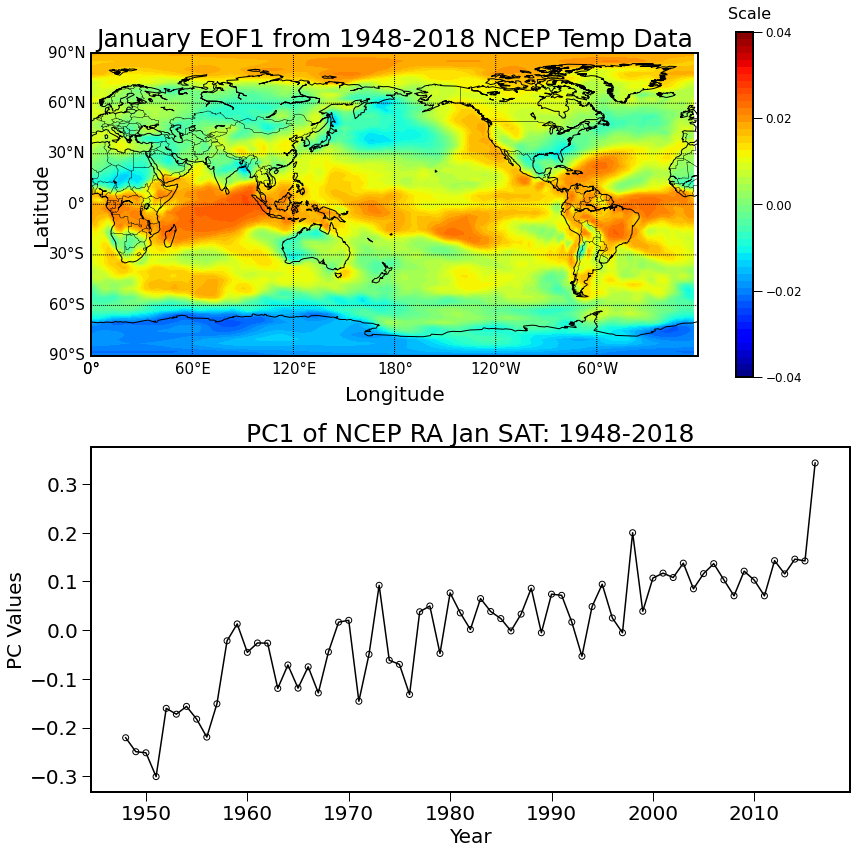

In [ ]:
#Fig 10.7
# prepare figure
plt.figure(figsize=(12,12))

# plot EOF1
plt.subplot(211)

# using the basemap package to put the cylindrical projection map into the image
eof = Basemap(projection='cyl',llcrnrlat=-90.,urcrnrlat=90.,\
            llcrnrlon=0.,urcrnrlon=360.,resolution='c')

# shifting the data because 
lons2, data2 = eof.shiftdata(lon_vals, datain = -mapmatr2, lon_0=180)


# draw coastlines, latitudes, and longitutes on the map
eof.drawcoastlines(color='black', linewidth=1)
eof.drawparallels(np.arange(-90.,91.,30.), labels = [1,0,0,1], fontsize=15)
eof.drawmeridians(np.arange(-180.,181.,60.), labels= [1,0,0,1], fontsize=15)
eof.drawcountries()

limits = np.linspace(-.04,.04,51)

# plot data on contour map
eof_plt = plt.contourf(np.array(lons2),np.array(lat_vals),data2,limits,cmap = "jet")

# set labels and coloorbar bounds
bounds = np.array([-0.04,-0.02,0,0.02,0.04])
efo = plt.colorbar(eof_plt, ticks=bounds)
efo.ax.tick_params(labelsize='large')
plt.text(378, 110, 'Scale', size=16)
plt.xlabel('Longitude',labelpad = 30)
plt.ylabel('Latitude',labelpad =40)
plt.title('January EOF1 from 1948-2018 NCEP Temp Data')

# retrieve PC1 from SVD 
pcdat = Vh[0,:]

# open bottom plot
plt.subplot(212)

#create time variable
TIME = np.array(range(1948,2017))

# plot data
plt.scatter(TIME,-pcdat,marker = "o",facecolors='none',edgecolors='k')
plt.plot(TIME,-pcdat,color='k')
plt.title("PC1 of NCEP RA Jan SAT: 1948-2018")
plt.xlabel("Year")
plt.ylabel("PC Values")

plt.tight_layout()
plt.show()

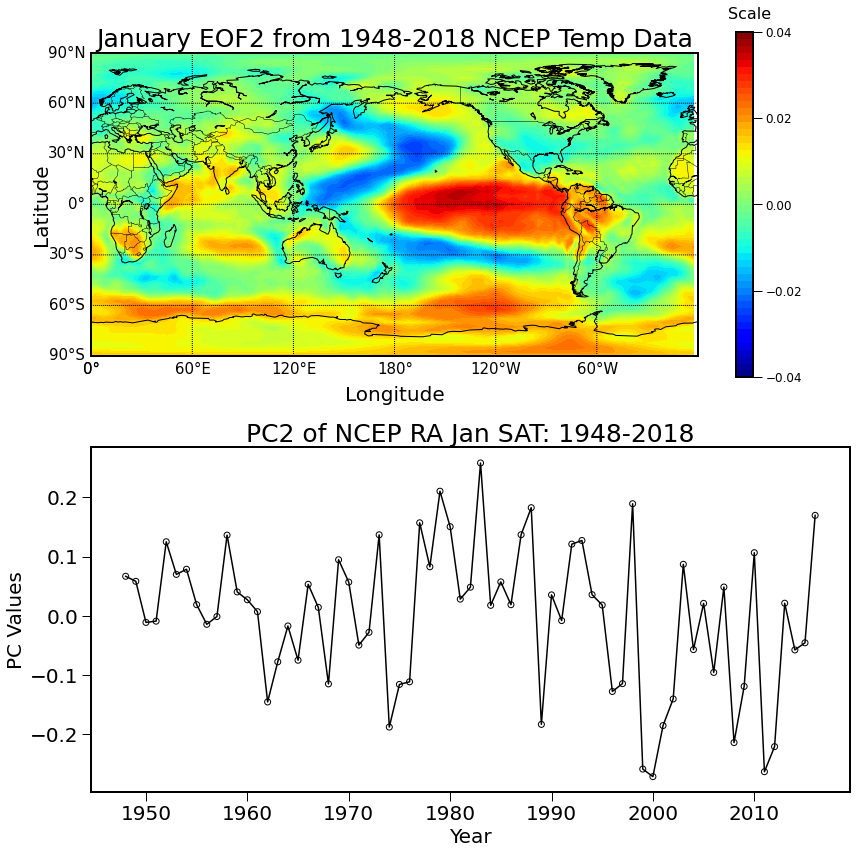

In [ ]:
#Fig 10.8
# prepare figure
plt.figure(figsize=(12,12))

#plot EOF2 by reshaping data from SVD
mapmatr = (np.reshape(U[:,1]/(np.sqrt(np.cos(gpcpst[:,0]
          *np.pi/180.))),(73,144)))

mapmatr2 = mapmatr[:,range(0,mapmatr[0,:].size)]

# open first subplot
plt.subplot(211)

# using the basemap package to put the cylindrical projection map into the image
eof = Basemap(projection='cyl',llcrnrlat=-90.,urcrnrlat=90.,\
            llcrnrlon=0.,urcrnrlon=360.,resolution='c')

# shifting the data because 
lons2, data2 = eof.shiftdata(lon_vals, datain = -mapmatr2, lon_0=180)

# draw coastlines, latitudes, and longitutes on the map
eof.drawcoastlines(color='black', linewidth=1)
eof.drawparallels(np.arange(-90.,91.,30.), labels = [1,0,0,1], fontsize=15)
eof.drawmeridians(np.arange(-180.,181.,60.), labels= [1,0,0,1], fontsize=15)
eof.drawcountries()

# create contour limits
limits = np.linspace(-.04,.04,51)

# plot data
eof_plt = plt.contourf(np.array(lons2),np.array(lat_vals),data2,limits,cmap = "jet")

# set labels and colorbar bounds
bounds = np.array([-0.04,-0.02,0,0.02,0.04])
efo = plt.colorbar(eof_plt, ticks=bounds)
efo.ax.tick_params(labelsize='large')
plt.text(378, 110, 'Scale', size=16)
plt.xlabel('Longitude',labelpad = 30)
plt.ylabel('Latitude',labelpad =40)
plt.title('January EOF2 from 1948-2018 NCEP Temp Data')

pcdat = Vh[1,:]

# open bottom plot
plt.subplot(212)

# create time variable
TIME = np.array(range(1948,2017))

# plot PC2
plt.scatter(TIME,-pcdat,marker = "o",facecolors='none',edgecolors='k')
plt.plot(TIME,-pcdat,color='k')
plt.title("PC2 of NCEP RA Jan SAT: 1948-2018")
plt.xlabel("Year")
plt.ylabel("PC Values")

plt.tight_layout()
plt.show()

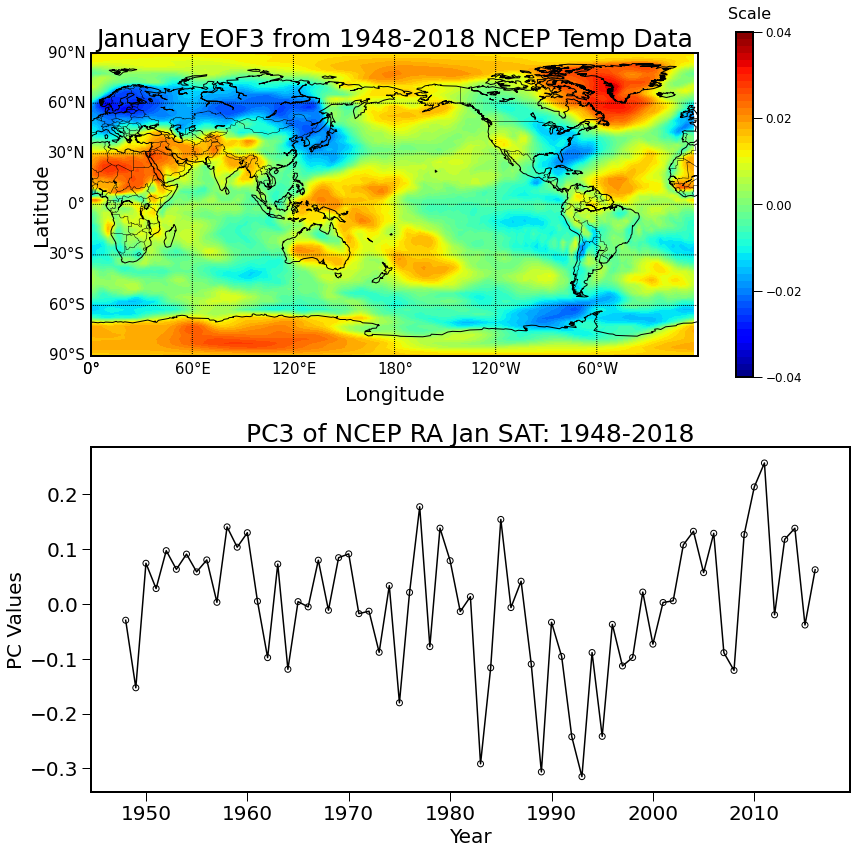

In [ ]:
#Fig 10.9
# set figure up
plt.figure(figsize=(12,12))

#create data from SVD 
mapmatr = (np.reshape(U[:,2]/(np.sqrt(np.cos(gpcpst[:,0]
          *np.pi/180.))),(73,144)))

mapmatr2 = mapmatr[:,range(0,mapmatr[0,:].size)]

# open first plot
plt.subplot(211)

# using the basemap package to put the cylindrical projection map into the image
eof = Basemap(projection='cyl',llcrnrlat=-90.,urcrnrlat=90.,\
            llcrnrlon=0.,urcrnrlon=360.,resolution='c')

# shifting the data because 
lons2, data2 = eof.shiftdata(lon_vals, datain = -mapmatr2, lon_0=180)

# draw coastlines, latitudes, and longitutes on the map
eof.drawcoastlines(color='black', linewidth=1)
eof.drawparallels(np.arange(-90.,91.,30.), labels = [1,0,0,1], fontsize=15)
eof.drawmeridians(np.arange(-180.,181.,60.), labels= [1,0,0,1], fontsize=15)
eof.drawcountries()

limits = np.linspace(-.04,.04,51)

# plot data 
eof_plt = plt.contourf(np.array(lons2),np.array(lat_vals),data2,limits,cmap = "jet")

# set labels and colorbar bounds
bounds = np.array([-0.04,-0.02,0,0.02,0.04])
efo = plt.colorbar(eof_plt, ticks=bounds)
efo.ax.tick_params(labelsize='large')
plt.text(378, 110, 'Scale', size=16)
plt.xlabel('Longitude',labelpad = 30)
plt.ylabel('Latitude',labelpad =40)
plt.title('January EOF3 from 1948-2018 NCEP Temp Data')

pcdat = Vh[2,:]

# open bottom plot
plt.subplot(212)

# create time variable
TIME = np.array(range(1948,2017))

# plot data 
plt.scatter(TIME,-pcdat,marker = "o",facecolors='none',edgecolors='k')
plt.plot(TIME,-pcdat,color='k')

# set labels 
plt.title("PC3 of NCEP RA Jan SAT: 1948-2018")
plt.xlabel("Year")
plt.ylabel("PC Values")

plt.tight_layout()
plt.show()

In [ ]:
GPCPST.shape

(10512, 828)

In [ ]:
# EOF from de-trended data
monJ = np.array(range(0,815,12))
gpcpdat = GPCPST.iloc[:,2:817]
gpcpJ = gpcpdat.iloc[:,monJ]
climJ = gpcpJ.mean(axis=1)
sdJ = gpcpJ.std(axis=1)

In [ ]:
anomJ = ((gpcpdat.iloc[:,monJ].T-climJ)/sdJ).T

In [ ]:
# create linear regression object
regr = linear_model.LinearRegression()
print(anomJ.iloc[0,:].shape)

(68,)


In [ ]:
# create time variable 
TIME = np.array(range(1948,2016))

# create trend V
def trendV():
    trendV = np.zeros(10512)
    for i in range(0,10512):
        regr.fit(np.reshape(TIME,(68,1)),
                 np.reshape(np.array(anomJ.iloc[i,:]),(68,1)))
        trendV[i] = regr.coef_
    return trendV
 
# create trend M
def trendM():
    rslt = np.zeros((10512,68))
    trendM = pd.DataFrame(np.zeros((10512, 68)),columns=tm1[monJ])
    for i in range(0,10512):
        regr.fit(np.reshape(TIME,(68,1)),
                 np.reshape(np.array(anomJ.iloc[i,:]),(68,1)))
        rslt[i,:] = regr.intercept_
    return rslt


In [ ]:
# make trend V instance 
trendV = trendV()
print(trendV)

[ 0.02303803  0.02303803  0.02303803 ... -0.03220623 -0.03220623
 -0.03220623]


In [ ]:
# make trend M instance
trendM = trendM()

In [ ]:
print(trendV.shape)
print(trendM.shape)

(10512,)
(10512, 68)


In [ ]:
dtanomJ = anomJ - trendM
dtanomJ.shape

(10512, 68)

In [ ]:
vArea = np.cos(gpcpst[:,0]*np.pi/180.)
dtanomAW = np.sqrt(vArea)*dtanomJ.T

In [ ]:
# computing SVD from the area-weighted anomaly matrix anomAW
U, S, Vh = np.linalg.svd(dtanomAW.T,full_matrices=False)

In [ ]:
print(U.shape,S.shape,Vh.shape)

(10512, 68) (68,) (68, 68)


In [ ]:
# define Fucntion
def mapmatr():
    q = np.zeros((144,73))
    for ii in range(0,144):
        q[ii,:] = U[:,0]/(np.sqrt(np.cos(gpcpst[:,0]
          *np.pi/180.)))
    return q

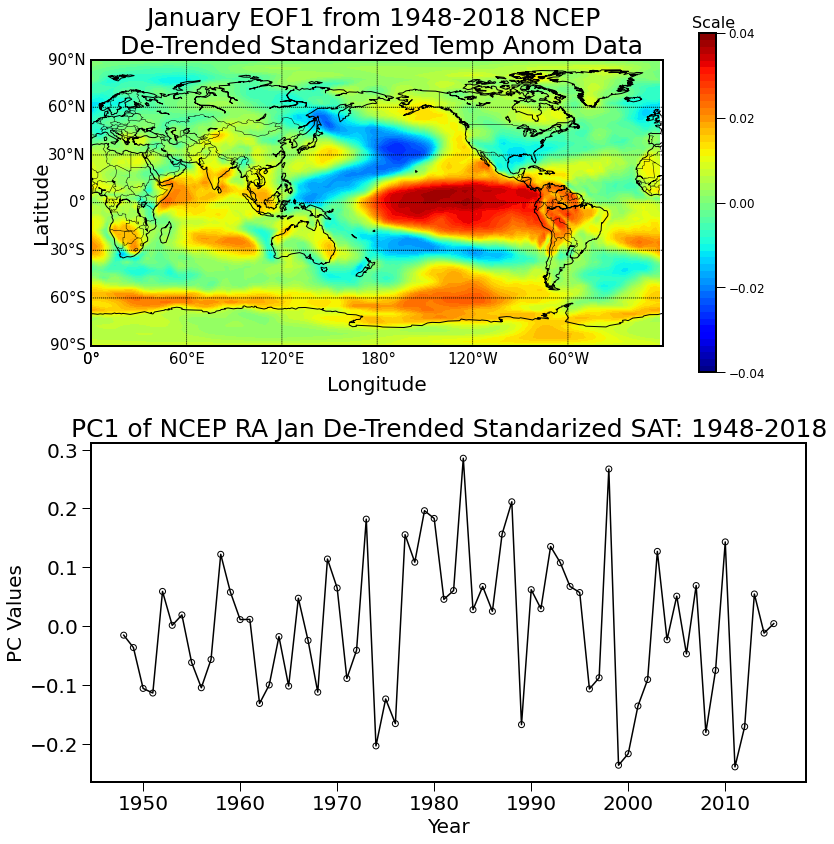

In [ ]:
#Fig 10.10
# plot EOF1
# prepare figure
plt.figure(figsize=(12,12))
plt.subplot(211)

# create data using SVD 
mapmatr = (np.reshape(U[:,1]/(np.sqrt(np.cos(gpcpst[:,0]
          *np.pi/180.))),(73,144)))

mapmatr2 = mapmatr[:,range(0,mapmatr[0,:].size)]

# using the basemap package to put the cylindrical projection map into the image
eof = Basemap(projection='cyl',llcrnrlat=-90.,urcrnrlat=90.,\
            llcrnrlon=0.,urcrnrlon=360.,resolution='c')

# shifting the data because 
lons2, data2 = eof.shiftdata(lon_vals, datain = mapmatr2)

# draw coastlines, latitudes, and longitutes on the map
eof.drawcoastlines(color='black', linewidth=1)
eof.drawparallels(np.arange(-90.,91.,30.), labels = [1,0,0,1], fontsize=15)
eof.drawmeridians(np.arange(-180.,181.,60.), labels= [1,0,0,1], fontsize=15)
eof.drawcountries()

limits = np.linspace(-.04,.04,51)

# plot EOF1 on contour map
eof_plt = plt.contourf(np.array(lons2),np.array(lat_vals),data2,limits,cmap = "jet")

# set labels and colorbar
bounds = np.array([-0.04,-0.02,0,0.02,0.04])
efo = plt.colorbar(eof_plt, ticks=bounds)
efo.ax.tick_params(labelsize='large')
plt.text(378, 110, 'Scale', size=16)
plt.xlabel('Longitude',labelpad = 30)
plt.ylabel('Latitude',labelpad =40)
plt.title('January EOF1 from 1948-2018 NCEP \n De-Trended Standarized Temp Anom Data')

# retrieve PC1 from SVD 
pcdat = Vh[1,:]

# open bottom plot
plt.subplot(212)

# plot PC1
TIME = np.array(range(1948,2016))
plt.scatter(TIME,pcdat,marker = "o",facecolors='none',edgecolors='k')
plt.plot(TIME,pcdat,color='k')

# set labels 
plt.title("PC1 of NCEP RA Jan De-Trended Standarized SAT: 1948-2018")
plt.xlabel("Year")
plt.ylabel("PC Values")

plt.tight_layout()
plt.show()

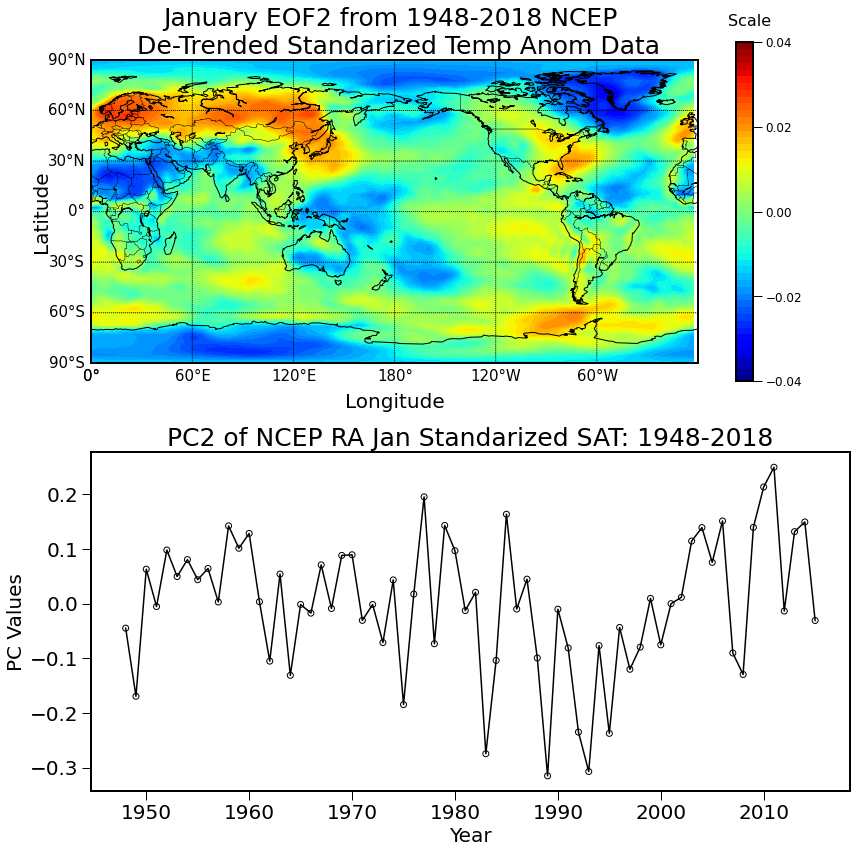

In [ ]:
#Fig 10.11
# prepare figure
plt.figure(figsize=(12,12))

# create data from SVD 
mapmatr = (np.reshape(U[:,2]/(np.sqrt(np.cos(gpcpst[:,0]
          *np.pi/180.))),(73,144)))

mapmatr2 = mapmatr[:,range(0,mapmatr[0,:].size)]

plt.subplot(211)

# using the basemap package to put the cylindrical projection map into the image
eof = Basemap(projection='cyl',llcrnrlat=-90.,urcrnrlat=90.,\
            llcrnrlon=0.,urcrnrlon=360.,resolution='c')

# shifting the data because 
lons2, data2 = eof.shiftdata(lon_vals, datain = mapmatr2)

# draw coastlines, latitudes, and longitutes on the map
eof.drawcoastlines(color='black', linewidth=1)
eof.drawparallels(np.arange(-90.,91.,30.), labels = [1,0,0,1], fontsize=15)
eof.drawmeridians(np.arange(-180.,181.,60.), labels= [1,0,0,1], fontsize=15)
eof.drawcountries()

limits = np.linspace(-.04,.04,51)

# plot EOF2 
eof_plt = plt.contourf(np.array(lons2),np.array(lat_vals),data2,limits,cmap = "jet")

# set labels and colorbar
bounds = np.array([-0.04,-0.02,0,0.02,0.04])
efo = plt.colorbar(eof_plt, ticks=bounds)
efo.ax.tick_params(labelsize='large')
plt.text(378, 110, 'Scale', size=16)
plt.xlabel('Longitude',labelpad = 30)
plt.ylabel('Latitude',labelpad =40)
plt.title('January EOF2 from 1948-2018 NCEP \n De-Trended Standarized Temp Anom Data')

# retrieve PC2 data
pcdat = Vh[2,:]

# open bottom plot
plt.subplot(212)

# plot PC1
TIME = np.array(range(1948,2016))
plt.scatter(TIME,-pcdat,marker = "o",facecolors='none',edgecolors='k')
plt.plot(TIME,-pcdat,color='k')

# set labels 
plt.title("PC2 of NCEP RA Jan Standarized SAT: 1948-2018")
plt.xlabel("Year")
plt.ylabel("PC Values")

plt.tight_layout()
plt.show()

______
# 10.4 Area-Weighted Average and Spatial Distribution of Trend 
_______

In [ ]:
# EOF from de-trended data
monJ = np.array(range(0,816,12))
gpcpdat = GPCPST.iloc[:,2:817]
gpcpJ = gpcpdat.iloc[:,monJ]
climJ = gpcpJ.mean(axis=1)
sdJ = gpcpJ.std(axis=1)

In [ ]:
# create desired variables for de-trended data
anomJ = ((gpcpdat.iloc[:,monJ].T-climJ)/sdJ).T
vArea = np.cos(gpcpst[:,0]*np.pi/180.)
anomA = vArea*anomJ.T
anomA.shape

(68, 10512)

In [ ]:
# compute the de-trended data
JanSAT = anomA.T.sum(axis=0)/vArea.sum()
JanSAT.shape

(68,)

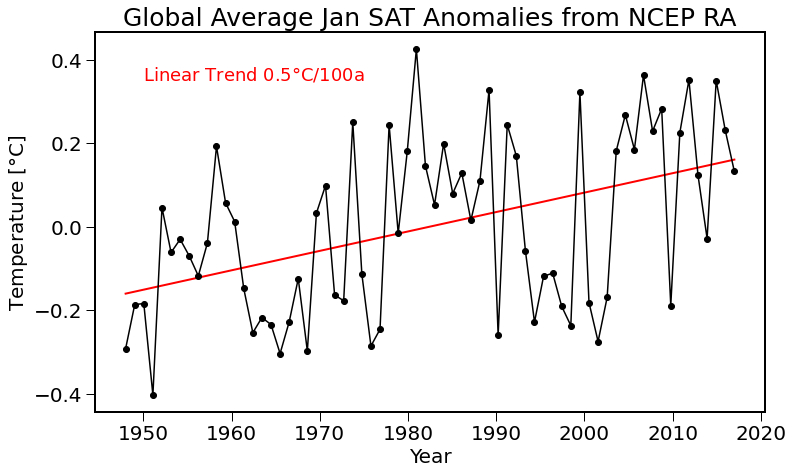

In [ ]:
#Fig 10.12
# set up figure 
plt.figure(figsize=(12,7))

# create time variable
TIME = np.linspace(1948,2017, 68)

# create linear regression object
lm = linear_model.LinearRegression()
lm.fit(TIME.reshape(-1,1), JanSAT)
pred = lm.predict(TIME.reshape(-1,1))

# plot linear regression
plt.plot(TIME, pred, "-",color="red", linewidth=2)

# plot data 
plt.plot(TIME, JanSAT, "-ok")


# set labels 
plt.title("Global Average Jan SAT Anomalies from NCEP RA")
plt.text(1950,0.35,"Linear Trend ${}\degree$C/100a".format(np.round(lm.coef_,3)[0]*100), color="r", fontsize=18)
plt.ylabel("Temperature [$\degree$C]")
plt.xlabel("Year")

plt.show()

In [ ]:
# recreate desired variables 
monJ = np.array(range(0,826,12))
gpcpdat = GPCPST.iloc[:,2:826]
gpcpJ = gpcpdat.iloc[:,monJ]
climJ = gpcpJ.mean(axis=1)

In [ ]:
# define function and make instance of function 
def anomJ_func3():
    rslt = pd.DataFrame(np.zeros((10512, 69)),columns=tm1[monJ])
    for i in range(0,69):
        rslt.iloc[:,i] = gpcpdat.iloc[:,monJ[i]]-climJ
    return rslt

anomJ = anomJ_func3()

In [ ]:
# create time variable
TIME = np.linspace(1948,2017, 69)

# create trend V function and instance of trend V
def trendV():
    trendV = np.zeros(10512)
    for i in range(0,10512):
        regr.fit(np.reshape(TIME,(69,1)),
                 np.reshape(np.array(anomJ.iloc[i,:]),(69,1)))
        trendV[i] = regr.coef_
    return trendV

trendV = trendV()

In [ ]:
# reshape data into desired form 
mapmat1 = np.reshape([10*trendV],(73,144))

In [ ]:
# create and use function
def mapv1_func():
    zeros = np.zeros((73,144))
    for i in range(0,73):
        for j in range(0,144):
            if mapmat1[i,j] >= 1.:
                zeros[i,j] = 1.
            else:
                zeros[i,j] = mapmat1[i,j]
    return zeros
mapv1 = mapv1_func()

In [ ]:
# create and use function
def mapmat_func():
    zeros = np.zeros((73,144))
    for i in range(0,73):
        for j in range(0,144):
            if mapv1[i,j] <= -1.:
                zeros[i,j] = -1.
            else:
                zeros[i,j] = mapv1[i,j]
    return zeros

mapmat3 = mapmat_func()

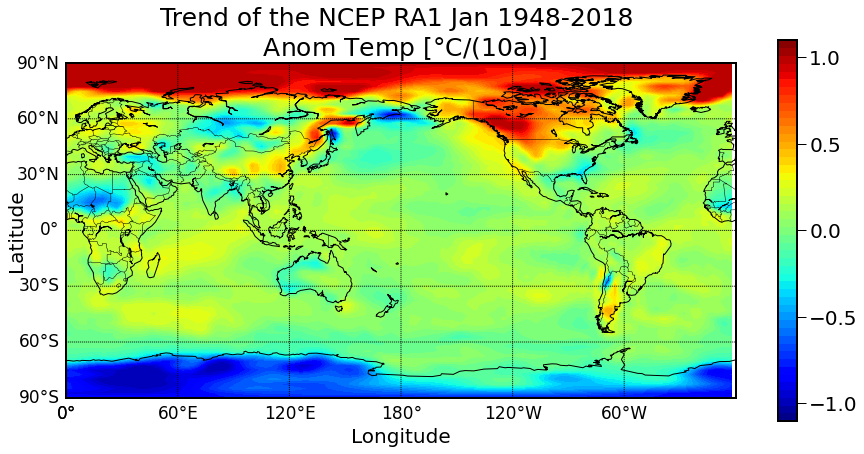

In [ ]:
#Fig 10.13
# prepare figure
plt.figure(figsize=(15., 7.))

# using the basemap package to put the cylindrical projection map into the image
trend = Basemap(projection='cyl',llcrnrlat=-90.,urcrnrlat=90.,\
            llcrnrlon=0.,urcrnrlon=360.,resolution='c')

# shifting the data because 
lons2, data3 = trend.shiftdata(lon_vals, datain = mapmat3, lon_0=180)

# draw coastlines, latitudes, and longitutes on the map
trend.drawcoastlines(color='black', linewidth=1)
trend.drawparallels(np.arange(-90.,91.,30.), labels = [1,0,0,1], fontsize=17)
trend.drawmeridians(np.arange(-180.,181.,60.), labels= [1,0,0,1], fontsize=17)
trend.drawcountries()

limits = np.linspace(-1.1,1.1,50)

# plot data 
eof_plt = plt.contourf(np.array(lons2),np.array(lat_vals),data3,limits,cmap = "jet")

# set labels and colorbar
efo = plt.colorbar(eof_plt, ticks=[1,0.5,0,-0.5,-1])
plt.xlabel('Longitude',labelpad = 30)
plt.ylabel('Latitude',labelpad =40)
plt.title('Trend of the NCEP RA1 Jan 1948-2018 \n Anom Temp [$\degree$C/(10a)]')

plt.show()

______
# 10.5 GPCP Precipitation Data: Analysis and Visualization by Python 
_______

In [ ]:
#Download the following data set from NOAA into your active folder
#https://www.esrl.noaa.gov/psd/repository/entry/show?
#entryid=synth%3Ae570c8f9-ec09-4e89-93b4-babd5651e7a9%
#3AL25jZXAucmVhbmFseXNpcy5kZXJpdmVkL3N1cmZhY2UvYWlyLm1vbi5tZWFuLm5j

ncd = nc.Dataset("precip.mon.mean.nc","r+")

# define variables
lon_vals = ncd.variables['lon'][:]
lat_vals = ncd.variables['lat'][:]
time = ncd.variables['time']
time_unit = time.units
precnc = ncd.variables['precip']

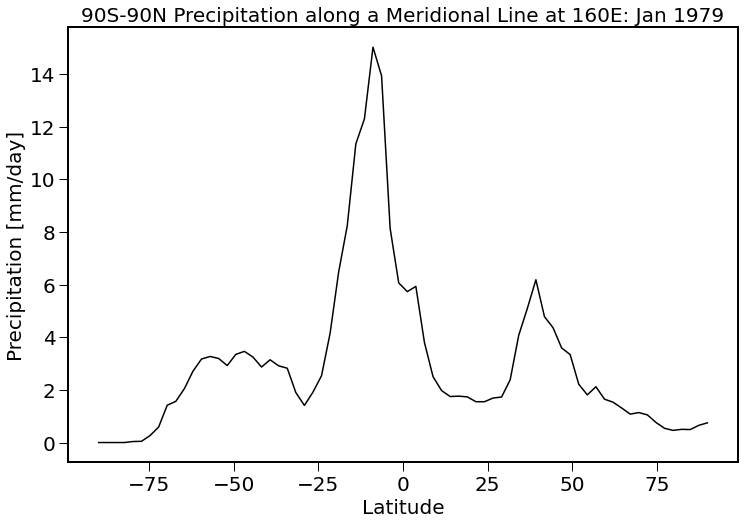

In [ ]:
#Fig 10.14
# plot a 90S-90N temp along a meridional line at 180E
nc_x = np.linspace(-90,90,72)
plt.plot(nc_x,precnc[0,:,63],color='k' )

# set variables
plt.xlabel('Latitude')
plt.ylabel('Precipitation [mm/day]')
plt.title('90S-90N Precipitation along a Meridional Line at 160E: Jan 1979', size=20)
plt.show()

In [ ]:
# write the data as space-time matrix with a header
precst = np.zeros((10368,451))
temp = precnc[0,:,:]

# fill precst with data form precnc 
for i in range(451):
    precst[:,i] = precnc[i,:,:].flatten()

# create and rehape Lat and Lon variable for Data Frame
LAT = list(lat_vals.data) * 144
LON1 = [np.repeat(i,72) for i in lon_vals.data]
LON = [i for j in LON1 for i in j]

gpcpst_ = pd.DataFrame({"Lat":LAT,"Lon":LON})
gpcpst = pd.concat([gpcpst_, pd.DataFrame(precst)], axis=1)

In [ ]:
gpcpst.iloc[889:892,:5]

,Lat,Lon,0,1,2
889,-26.25,31.25,0.057521,0.180531,0.210445
890,-23.75,31.25,0.108556,0.256279,0.288389
891,-21.25,31.25,0.087190,0.273805,0.256987


In [ ]:
# create desired Colormap
colors = ["black", "black","purple","crimson","red","red","red","tomato","lightpink",
          "pink","peachpuff","yellow","yellow", "yellowgreen","limegreen","limegreen","mediumaquamarine",
          "skyblue","lightskyblue","wheat","wheat"]
colors.reverse()
myColMap = newColMap(colors)

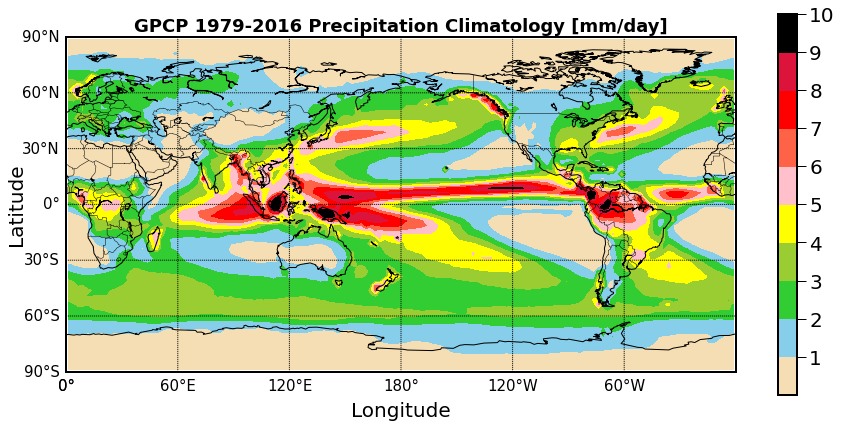

In [ ]:
#Fig 10.15(a)
# prepare variables for plotting 
climmat = precnc[0,:,:]
for i in range(451):
    climmat = climmat + precnc[i,:,:]

climmat = climmat/451
mapmat = climmat

# suppress values into the (0,10) range 
for i in range(72):
    for j in range(144):
        if mapmat[i,j] > 10:
            mapmat[i,j] = 10
        if mapmat[i,j] < 0:
            mapmat[i,j] = 0

myint = np.linspace(0, 10,11)

# prepare figure
plt.figure(figsize=(15., 7.))

# using the basemap package to put the cylindrical projection map into the image
trend = Basemap(projection='cyl',llcrnrlat=-90.,urcrnrlat=90.,\
            llcrnrlon=0.,urcrnrlon=360.,resolution='c')

# shifting the data because 
lons2, data3 = trend.shiftdata(lon_vals, datain = mapmat, lon_0=180)

# draw coastlines, latitudes, and longitutes on the map
trend.drawcoastlines(color='black', linewidth=1)
trend.drawparallels(np.arange(-90.,91.,30.), labels = [1,0,0,1], fontsize=15)
trend.drawmeridians(np.arange(-180.,181.,60.), labels= [1,0,0,1], fontsize=15)
trend.drawcountries()

# plot data 
eof_plt = plt.contourf(np.array(lons2),np.array(lat_vals),mapmat,myint,cmap = myColMap)

# set labels and colorbar
efo = plt.colorbar(eof_plt, ticks=[10,9,8,7,6,5,4,3,2,1])
plt.xlabel('Longitude',labelpad = 30)
plt.ylabel('Latitude',labelpad =40)
plt.title('GPCP 1979-2016 Precipitation Climatology [mm/day]', size=18, fontweight="bold")

plt.show()

In [ ]:
mapmat.shape

(72, 144)

In [ ]:
# create and prepare data 
sdmat = (precnc[0,:,:]-climmat)**2
for i in range(1,451):
    sdmat = sdmat + (precnc[i,:,:]-climmat)**2

sdmat = np.sqrt(sdmat/451)
mapmat = sdmat

# suppress values into the (0,5) range 
for i in range(72):
    for j in range(144):
        if mapmat[i,j] > 5:
            mapmat[i,j] = 5
        if mapmat[i,j] < 0:
            mapmat[i,j] = 0

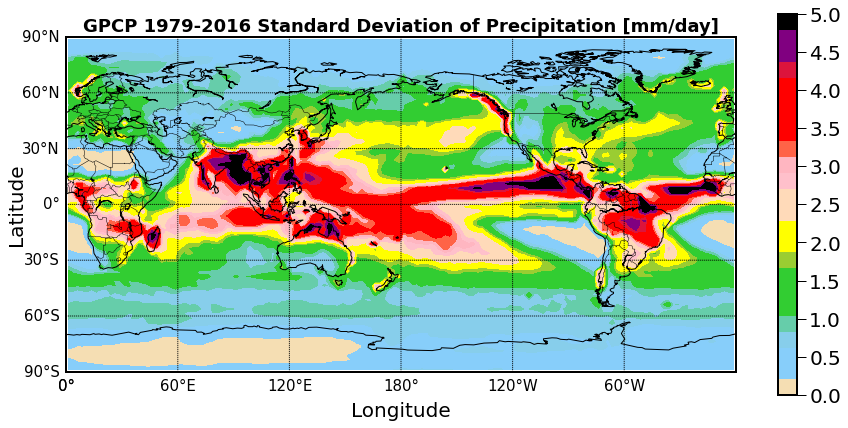

In [ ]:
#Fig 10.15(b)
myint = np.linspace(0, 5,25)

# prepare figure
plt.figure(figsize=(15., 7.))

#  using the basemap package to put the cylindrical projection map into the image
trend = Basemap(projection='cyl',llcrnrlat=-90.,urcrnrlat=90.,\
            llcrnrlon=0.,urcrnrlon=360.,resolution='c')

# shifting the data because 
lons2, data3 = trend.shiftdata(lon_vals, datain = mapmat, lon_0=180)

# draw coastlines, latitudes, and longitutes on the map
trend.drawcoastlines(color='black', linewidth=1)
trend.drawparallels(np.arange(-90.,91.,30.), labels = [1,0,0,1], fontsize=15)
trend.drawmeridians(np.arange(-180.,181.,60.), labels= [1,0,0,1], fontsize=15)
trend.drawcountries()

# plot data 
eof_plt = plt.contourf(np.array(lons2),np.array(lat_vals),mapmat,myint,cmap = myColMap)

# set labels and colorbar
efo = plt.colorbar(eof_plt, ticks=[5,4.5,4,3.5,3,2.5,2,1.5,1,0.5,0])
plt.xlabel('Longitude',labelpad = 30)
plt.ylabel('Latitude',labelpad =40)
plt.title('GPCP 1979-2016 Standard Deviation of Precipitation [mm/day]', size=18, fontweight="bold")
plt.show()

______
# Chapter 11: Python Analysis of Incomplete Climate Data 
_______

In [ ]:
import numpy as np 
import matplotlib
from matplotlib import cm as cm1
import matplotlib.pyplot as plt
import pandas as pd
import warnings
import os
warnings.filterwarnings("ignore")

from scipy import optimize as opt
import sympy as sm
import math as m
import os
import cartopy 
import netCDF4 as nc
from matplotlib.colors import LinearSegmentedColormap
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from mpl_toolkits.basemap import Basemap, cm, shiftgrid, addcyclic
from matplotlib.patches import Polygon

from datetime import datetime

import cartopy.crs as ccrs
import cartopy.feature as cfeature

from scipy.ndimage import gaussian_filter
from sklearn.linear_model import LinearRegression

Starting with Figure 11.4, due to the fact that Figure 11.1-11.3 are snapshots of the NCDC NOAA data access tool. Please follow link below for more information regarding these plots. 
www.ncdc.noaa.gov/data-access/marineocean-data/noaa-global-surface-temperature-noaaglobaltemp

_____
# 11.2 Read NOAAGlobalTemp and From the Space-Time Data Matrix
______

In [ ]:
# open .asc file 
file = open('NOAAGlobalTemp.gridded.v4.0.1.201701.asc', "r")

# read float numbers from the file
da1 = []
for line in file:
    x = line.strip().split()
    for f in x:
        da1.append(float(f))

len(da1)

4267130

In [ ]:
print(da1[0 : 3])

# create time variables
tm1 = np.arange(0, 4267129, 2594)
tm2 = np.arange(1, 4267130, 2594)
print(len(tm1))
print(len(tm2))

# extract months
mm1 = []   
for i in range(len(tm1)):
    mm1.append(da1[tm1[i]])
    
# extract years
yy1 = []
for i in range(len(tm2)):
    yy1.append(da1[tm2[i]])
    
# combine YYYY with MM
rw1 = []
for i in range(len(mm1)):
    rw1.append(str(int(yy1[i])) + "-" + str(int(mm1[i])))    
print(mm1[0 : 6])
print(yy1[0 : 6])
print(len(mm1))
print(len(yy1))

print(tm1[0 : 6])
print(tm2[0 : 6])

tm3 = pd.concat([pd.DataFrame(tm1), pd.DataFrame(tm2)], axis = 1)

# remove the months and years data from the scanned data
tm4 = [] 
for r in range(len(tm1)):
    tm4.append(tm1[r])
    tm4.append(tm2[r])

tm4.reverse()
da2 = da1.copy() 
for f in tm4:
    del da2[f]

print(len(da2)/(36*72)) # months, 137 yrs 1 mon: Jan 1880-Jan 2017

# generates the space-time data
# 2592 (=36*72) rows and 1645 months (=137 yrs 1 mon)
var = [[0 for x in range(1645)] for y in range(2592)]
i = 0
for c in range(1645):
    for r in range(2592):
        var[r][c] = da2[i]
        i += 1

da3 = pd.DataFrame(var, columns = rw1)

lat1=np.linspace(-87.5, 87.5, 36).tolist()
lon1=np.linspace(2.5, 357.5, 72).tolist()

Lat = sorted(lat1 * 72)
Lon = lon1 * 36

rw1.insert(0, "LAT")
rw1.insert(1, "LON")
gpcpst = pd.concat([pd.DataFrame(Lat), pd.DataFrame(Lon), 
                    pd.DataFrame(da3)], axis = 1)
gpcpst.columns = rw1

[1.0, 1880.0, -999.9]
1645
1645
[1.0, 2.0, 3.0, 4.0, 5.0, 6.0]
[1880.0, 1880.0, 1880.0, 1880.0, 1880.0, 1880.0]
1645
1645
[    0  2594  5188  7782 10376 12970]
[    1  2595  5189  7783 10377 12971]
1645.0


In [ ]:
# the first two columns are Lat and Lon
# -87.5 to 87.5 and then 2.5 to 375.5
# the first row for time is header, not counted as data. 
gpcpst.to_csv("NOAAGlobalT1.csv") 
# Output the data as a csv file

(36, 72) (36, 72) (36, 72)


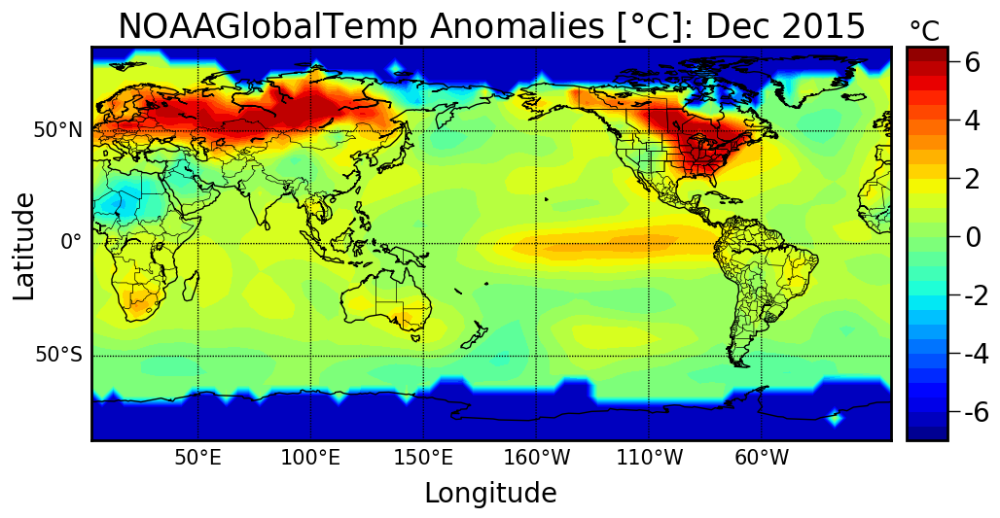

In [ ]:
#Fig 11.4
# column '2015-12' corresponding to Dec 2015
# convert the vector into a lon-lat matrix for contour map plotting
# compresses numbers to [-6, 6] range
mapmat = np.reshape(gpcpst['2015-12'].values, (-1, 72)) #36 X 72
# this command compresses numbers to the range of -6 to 6
mapmat = np.maximum(np.minimum(mapmat, 6), -6)  

dpi = 100
fig = plt.figure(figsize = (1100/dpi, 1100/dpi), dpi = dpi)
ax  = fig.add_axes([0.1, 0.1, 0.8, 0.9])

# create map
dmap = Basemap(projection = 'cyl', llcrnrlat = -87.5, urcrnrlat = 87.5,
              resolution = 'c',  llcrnrlon = 2.5, urcrnrlon = 357.5)

# draw coastlines, state and country boundaries, edge of map
dmap.drawcoastlines()
dmap.drawstates()
dmap.drawcountries()

# create and draw meridians and parallels grid lines
dmap.drawparallels(np.arange( -50, 100, 50.), labels = [1, 0, 0, 0], 
                  fontsize = 15)
dmap.drawmeridians(np.arange(50, 350, 50.), labels = [0, 0, 0, 1], 
                  fontsize = 15)

# convert latitude/longitude values to plot x/y values
# need to reverse sequence of lat1
# lat1_rev = lat1[::-1] 
lat1_rev = lat1
x, y = dmap(*np.meshgrid(lon1, lat1_rev))

# contour levels
clevs = np.arange(-7, 7, 0.5)
print(x.shape,y.shape, mapmat.shape)

# draw filled contours
cnplot = dmap.contourf(x, y, mapmat, clevs, cmap = plt.cm.jet)

# add colorbar
# pad: distance between map and colorbar
cbar = dmap.colorbar(cnplot, location = 'right', pad = "2%", ticks=[-6,-4,-2,0,2,4,6])      
cbar.ax.set_yticklabels(['-6','-4','-2','0','2','4','6'])
plt.text(365, 90, '$\degree$C', size=20) # add colorbar title string

# add plot title
plt.title('NOAAGlobalTemp Anomalies [$\degree$C]: Dec 2015')

# label x and y
plt.xlabel('Longitude', labelpad = 30)
plt.ylabel('Latitude', labelpad = 40)

# display on screen
plt.show()

In [ ]:
# keep only the data for the Pacific region for years from 1951-2000 

# get data for region with -20 < Latitude < 20 and 160 < Longitude < 260
n2 = gpcpst[(gpcpst['LAT'] > -20) & (gpcpst['LAT'] < 20) & 
            (gpcpst['LON'] > 160) & (gpcpst['LON'] < 260)]
print(gpcpst.shape)
print(n2.size)

# from 1951-2000 
# note Jan 1951 data starts from column 854 (note python is zero based)
pacificdat = n2.iloc[:, 854 : 1454]

(2592, 1647)
263520


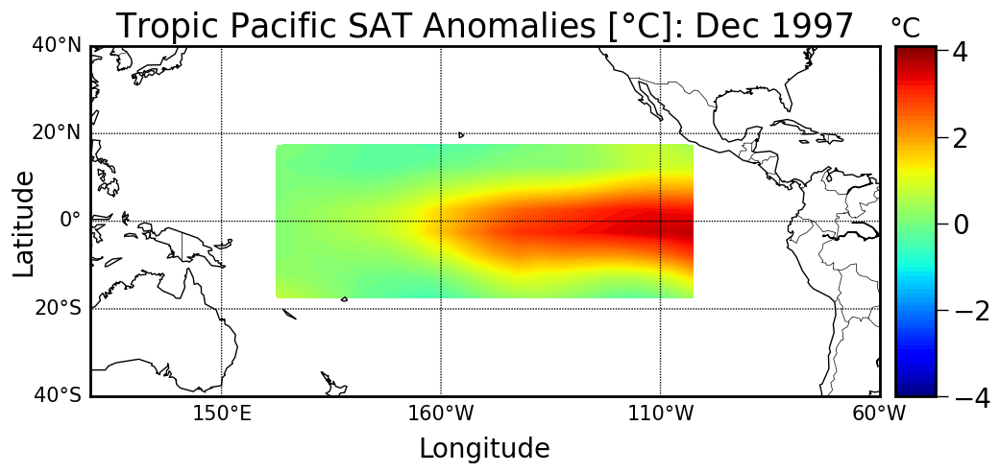

In [ ]:
#Fig 11.5
Lat = np.arange(-17.5, 22.5, 5)
Lon = np.arange(162.5, 262.5, 5)

plt.close()

# get Dec 1997 data from pacificdat (tropical region)
mapmat = np.reshape(pacificdat['1997-12'].values, (8, -1)) # 8 * 20

fig = plt.figure(figsize=(1100/dpi, 1100/dpi), dpi = dpi)
ax  = fig.add_axes([0.1, 0.1, 0.8, 0.9])

# create map
smap = Basemap(projection = 'cyl', llcrnrlat = -40, urcrnrlat = 40,
              resolution = 'c', llcrnrlon = 120, urcrnrlon = 300)

# draw coastlines, state and country boundaries, edge of map
smap.drawcoastlines()
smap.drawcountries()

# create and draw meridians and parallels grid lines
smap.drawparallels(np.arange( -40, 60, 20.),labels=[1, 0, 0, 0],fontsize = 15)
smap.drawmeridians(np.arange(50, 350, 50.),labels=[0, 0, 0, 1],fontsize = 15)

# convert latitude/longitude values to plot x/y values
x, y = smap(*np.meshgrid(Lon, Lat))

# contour levels
clevs = np.arange(-4, 4.2, 0.1)

# draw filled contours
cnplot = smap.contourf(x, y, mapmat, clevs, cmap = plt.cm.jet)

# add colorbar
# pad: distance between map and colorbar
cbar = smap.colorbar(cnplot, location = 'right', pad = "2%", ticks=[-4,-2,0,2,4]) 
# add colorbar title string
plt.text(302, 42, '$\degree$C', size=20)

# add plot title
plt.title('Tropic Pacific SAT Anomalies [$\degree$C]: Dec 1997')

# label x and y
plt.xlabel('Longitude', labelpad = 30)
plt.ylabel('Latitude', labelpad = 40)

# display on screen
plt.show()

_____
# 11.3 Spatial Averages and Their Trends
______

In [ ]:
# prepare the data
temp = gpcpst.copy()
areaw = np.zeros((2592, 1647))
areaw.shape 
areaw[:, 0] = temp['LAT'].values
areaw[:, 1] = temp['LON'].values
# convert degrees to radians 
veca=np.cos(temp['LAT'].values * np.pi / 180).tolist()
tempvalues = temp.values # get the underlying ndarray from the temp DataFrame
# area-weight matrix equal to cosine lat of the boxes with data 
# and to zero for the boxes of missing data -999.9
for j in range(2, 1647):
    for i in range(0, 2592):
        if tempvalues[i, j] > -290.0:
            areaw[i][j] = veca[i]


In [ ]:
# area-weight data matrix first two columns as lat-lon
# create monthly global average vector for 1645 months (Jan 1880- Jan 2017)
tempw = np.multiply(areaw, tempvalues)
tempw[:,0] = temp['LAT'].values
tempw[:,1] = temp['LON'].values
avev = np.divide(tempw.sum(axis=0)[2:1647], areaw.sum(axis = 0)[2:1647])

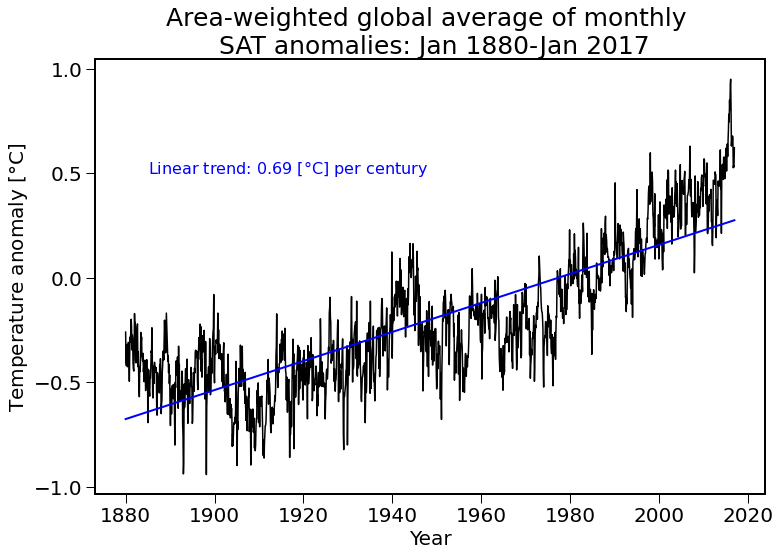

In [ ]:
#Fig 11.6
plt.close()

# create time variable 
timemo = np.linspace(1880, 2017, 1645)

# create plot and plot labels 
plt.plot(timemo, avev, '-', color="k")
plt.title('Area-weighted global average of monthly \n SAT anomalies: Jan 1880-Jan 2017')
plt.xlabel('Year')
plt.ylabel('Temperature anomaly [$\degree$C]')

plt.yticks([-1,-0.5,0,0.5,1])

# create linear regression model
lm = LinearRegression()
lm.fit(timemo.reshape(-1, 1), avev)
predictions = lm.predict(timemo.reshape(-1, 1))

# plot linear regression model
plt.plot(timemo, predictions, '-', color="blue",linewidth=2)


# add text indicating the trend 
plt.text(1885, .5, 'Linear trend: 0.69 [$\degree$C] per century', fontsize=16, color="blue")

plt.show()  

In [ ]:
gpcpst

LAT    LON  1880-1  1880-2  1880-3  1880-4  1880-5  1880-6  1880-7  \
0    -87.5    2.5  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
1    -87.5    7.5  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
2    -87.5   12.5  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
3    -87.5   17.5  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
4    -87.5   22.5  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
...    ...    ...     ...     ...     ...     ...     ...     ...     ...   
2587  87.5  337.5  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
2588  87.5  342.5  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
2589  87.5  347.5  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
2590  87.5  352.5  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
2591  87.5  357.5  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   

      1880-8  1880-9  1880-10  1880-11  1880-12  1881-1  1881-2  1881-3  \
0     -999.9  -999.9   -999.9   -999.9   -999.9  -999.9  -999.9  -999.9   
1     -999.9  -999.9   -999.9   -999.9   -999.9  -999.9  -999.9  -999.9   
2     -999.9  -999.9   -999.9   -999.9   -999.9  -999.9  -999.9  -999.9   
3     -999.9  -999.9   -999.9   -999.9   -999.9  -999.9  -999.9  -999.9   
4     -999.9  -999.9   -999.9   -999.9   -999.9  -999.9  -999.9  -999.9   
...      ...     ...      ...      ...      ...     ...     ...     ...   
2587  -999.9  -999.9   -999.9   -999.9   -999.9  -999.9  -999.9  -999.9   
2588  -999.9  -999.9   -999.9   -999.9   -999.9  -999.9  -999.9  -999.9   
2589  -999.9  -999.9   -999.9   -999.9   -999.9  -999.9  -999.9  -999.9   
2590  -999.9  -999.9   -999.9   -999.9   -999.9  -999.9  -999.9  -999.9   
2591  -999.9  -999.9   -999.9   -999.9   -999.9  -999.9  -999.9  -999.9   

      1881-4  1881-5  1881-6  1881-7  1881-8  1881-9  1881-10  1881-11  \
0     -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   -999.9   -999.9   
1     -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   -999.9   -999.9   
2     -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   -999.9   -999.9   
3     -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   -999.9   -999.9   
4     -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   -999.9   -999.9   
...      ...     ...     ...     ...     ...     ...      ...      ...   
2587  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   -999.9   -999.9   
2588  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   -999.9   -999.9   
2589  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   -999.9   -999.9   
2590  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   -999.9   -999.9   
2591  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   -999.9   -999.9   

      1881-12  1882-1  1882-2  1882-3  1882-4  1882-5  1882-6  1882-7  1882-8  \
0      -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
1      -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
2      -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
3      -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
4      -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
...       ...     ...     ...     ...     ...     ...     ...     ...     ...   
2587   -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
2588   -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
2589   -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
2590   -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   
2591   -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9  -999.9   

      1882-9  1882-10  1882-11  1882-12  1883-1  1883-2  1883-3  1883-4  \
0     -999.9   -999.9   -999.9   -999.9  -999.9  -999.9  -999.9  -999.9   
1     -999.9   -999.9   -999.9   -999.9  -999.9  -999.9  -999.9  -999.9   
2     -999.9   -999.9   -999.9   -999.9  -999.9  -999.9  -999.9  -999.9   
3     -999.9   -999

In [ ]:
# Edmonton, Canada
n2_0 = set(np.where(gpcpst.LAT == 52.5)[0])
n2_1 = set(np.where(gpcpst.LON == 247.5)[0])
print(n2_0.intersection(n2_1))

# San Diego, USA
n2_3 = set(np.where(gpcpst.LAT == 32.5)[0])
n2_4 = set(np.where(gpcpst.LON == 242.5)[0])
print(n2_3.intersection(n2_4))

{2065}
{1776}


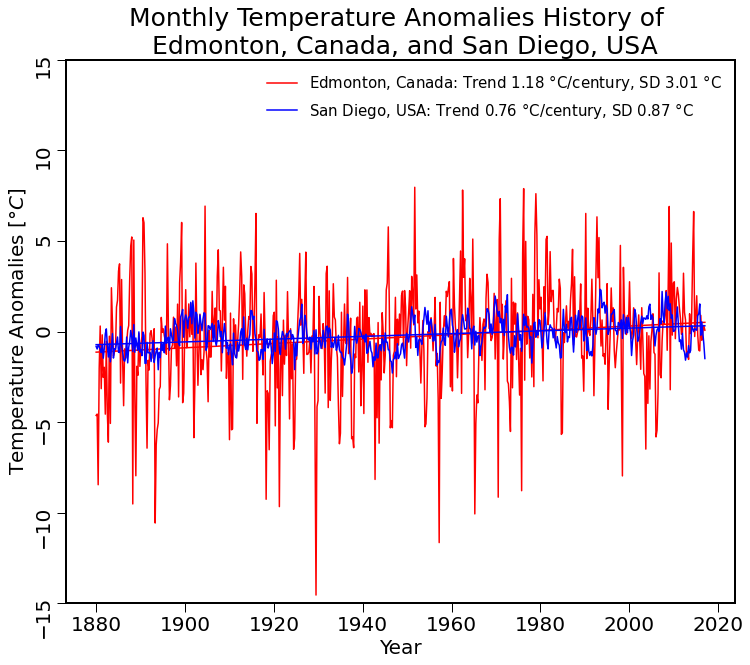

In [ ]:
#Fig 11.7
# extract data for a specified box with given lat and lon
n2 = 2065
dedm = gpcpst.iloc[n2,854:1453]
t = np.linspace(1880,2017, len(dedm))

# set up figure and plot Edmonton data
fig = plt.figure(figsize=(12,10))
plt.plot(t, dedm, "red", label="Edmonton, Canada: Trend 1.18 $\degree$C/century, SD 3.01 $\degree$C")

# set plot labels
plt.title("Monthly Temperature Anomalies History of \n Edmonton, Canada, and San Diego, USA")
plt.ylabel("Temperature Anomalies $[\degree C]$")
plt.xlabel("Year")
plt.ylim((-15,15))
plt.yticks(rotation=90)

# plot linear regression
lm = LinearRegression()
lm.fit(t.reshape(-1, 1), dedm)
predictions = lm.predict(t.reshape(-1, 1))
plt.plot(t, predictions, '-', color="red")

# create San Diego Data 
n2 = 1776
dsan = gpcpst.iloc[n2,854:1453]
t = np.linspace(1880,2017, len(dsan))

# plot san diego data 
plt.plot(t, dsan, "blue", label="San Diego, USA: Trend 0.76 $\degree$C/century, SD 0.87 $\degree$C")

# plot linear regression
lmsan = LinearRegression()
lmsan.fit(t.reshape(-1, 1), dsan)
predictions = lmsan.predict(t.reshape(-1, 1))
plt.plot(t, predictions, '-', color="blue")

plt.legend()

plt.show()

In [ ]:
# print linear model coefficients and standard deviation of each data set
print(lm.coef_)
print(lmsan.coef_)
print(np.std(dedm))
print(np.std(dsan))

[0.01200846]
[0.00760766]
3.0049052677575125
0.8650167715422953


In [ ]:
# download the NCEI spatial average time series of monthly data
# https://www1.ncdc.noaa.gov/pub/data/noaaglobaltemp/operational/
# timeseries/aravg.mon.land_ocean.90S.90N.v4.0.1.201702.asc
aveNCEI = pd.read_table('http://shen.sdsu.edu/data/' + 
                        'aravg.mon.land_ocean.90S.90N.v4.0.1.201703.asc.txt', 
                        header = None, delim_whitespace = True)
aveNCEI.shape 

aveNCEI = aveNCEI.values

In [ ]:
print(aveNCEI.shape) #(1647,10)

# create a time variable that spans the needed years
timeo = np.linspace(aveNCEI[0,0], aveNCEI[-1,0],len(aveNCEI[:,0]))

# create a matrix of 136 years of data matrix
# row = year from 1880 to 2016 column = month 1 to 12
ave = aveNCEI[:,2]
myear = len(ave)/12
nyear = int(np.floor(myear))
nmon = nyear*12

# reshape the monthly averages into a matrix
avem = ave[0:nmon].reshape((137,12))

# compute annual average 
annv = np.zeros(137)
for i in range(0,nyear):
    annv[i] = np.mean(avem[i,:])

# put the monthly averages and annual ave in a matrix
avemy = pd.DataFrame(avem)

# add a column that indicated the averages 
avemy["Average"] = annv

(1647, 10)


In [ ]:
avemy

,0,1,2,3,4,5,6,7,8,9,10,11,Average
0,-0.254882,-0.390030,-0.414509,-0.314104,-0.327618,-0.421961,-0.386787,-0.303434,-0.307535,-0.395433,-0.490574,-0.357690,-0.363713
1,-0.281037,-0.298598,-0.256906,-0.201682,-0.233895,-0.348272,-0.274636,-0.282329,-0.395464,-0.437131,-0.444607,-0.331158,-0.315476
2,-0.174060,-0.240485,-0.210161,-0.390328,-0.408842,-0.392581,-0.300641,-0.236459,-0.217395,-0.425229,-0.352755,-0.452639,-0.316798
3,-0.524041,-0.563601,-0.419921,-0.443575,-0.402770,-0.259521,-0.315984,-0.278074,-0.370997,-0.376471,-0.392778,-0.358323,-0.392171
4,-0.445016,-0.421579,-0.493839,-0.453975,-0.390322,-0.447676,-0.534206,-0.499795,-0.449471,-0.386881,-0.494061,-0.428869,-0.453807
...,...,...,...,...,...,...,...,...,...,...,...,...,...
132,0.165989,0.153761,0.240487,0.463265,0.463908,0.455566,0.453870,0.445553,0.501094,0.490923,0.488859,0.185138,0.375701
133,0.331214,0.365247,0.333766,0.292351,0.456119,0.433921,0.435057,0.435280,0.463543,0.466267,0.605887,0.420357,0.419917
134,0.435523,0.207236,0.486705,0.530473,0.535486,0.511096,0.465122,0.572558,0.567807,0.571151,0.466506,0.553309,0.491914
135,0.558792,0.613820,0.617789,0.507067,0.599994,0.633337,0.574553,0.645725,0.705505,0.774835,0.738430,0.836829,0.650556


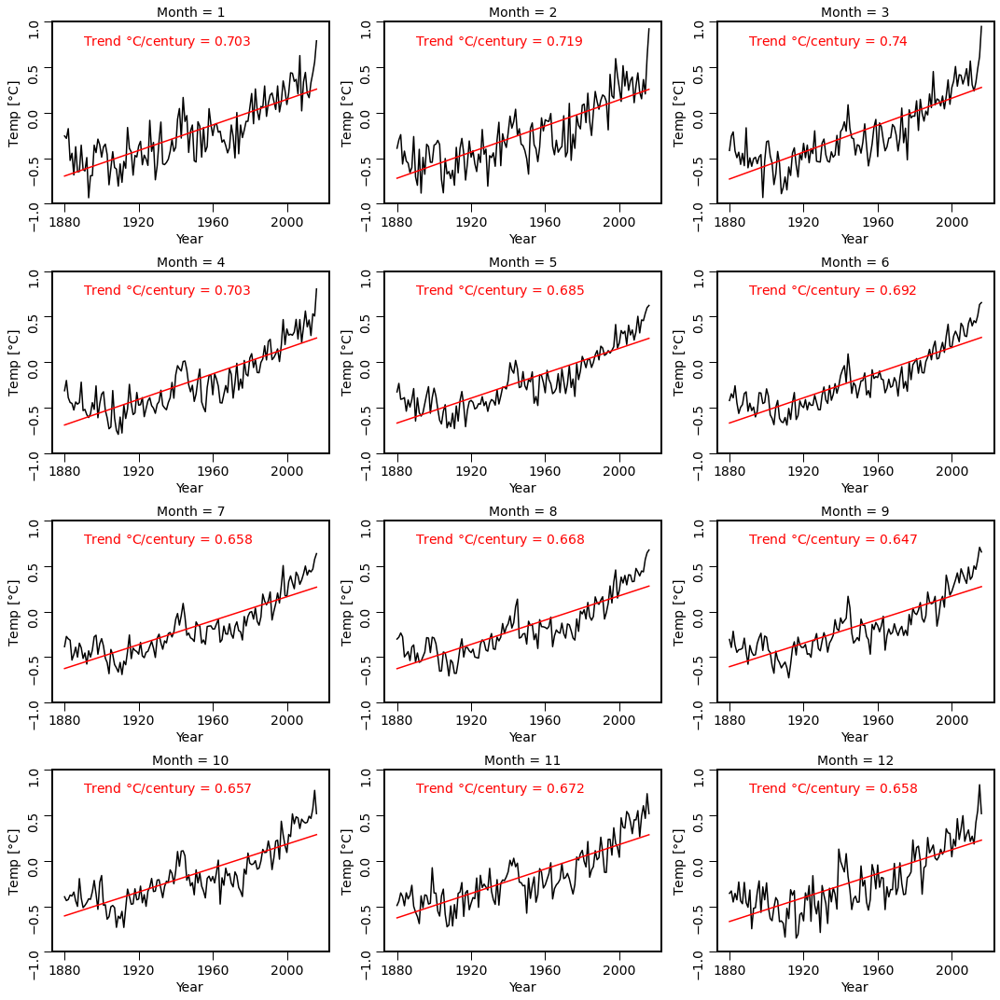

In [ ]:
#Fig 11.8
# plot 12 panels on the same figure: Trend for each month
fig = plt.figure(figsize=(15,15))

# create time variable
timeyr = np.linspace(aveNCEI[0,0],aveNCEI[0,0]+nyear-1, 137)

# locate and plot each month on seperate panels
for i in range(0,12):
    plt.subplot(4,3,i+1)
    plt.plot(timeyr, avemy.iloc[:,i], color="black")
    plt.title("Month = {}".format(i+1), size=14)
    plt.yticks(rotation=90)
    plt.ylabel("Temp [$\degree$C]", size=14)
    plt.xlabel("Year", size=14)
    
    #plot linear regression
    lm = LinearRegression()
    lm.fit(timeyr.reshape(-1, 1), avemy.iloc[:,i])
    predictions = lm.predict(timeyr.reshape(-1, 1))
    plt.plot(timeyr, predictions, '-', color="red")
    plt.text(1890,0.75, "Trend $\degree$C/century = {}".format(np.round(lm.coef_,5)[0]*100), size=14, color="red")

    plt.ylim((-1,1))
    plt.xticks([1880,1920,1960,2000], size =14)
    plt.yticks([-1,-0.5,0,0.5,1], size =14)

# allows no overlap betweeen monthly plots
plt.tight_layout()    
plt.show()

In [ ]:
# create the differenced data
avediff = np.subtract(avev, aveNCEI[0:1645, 2]) 

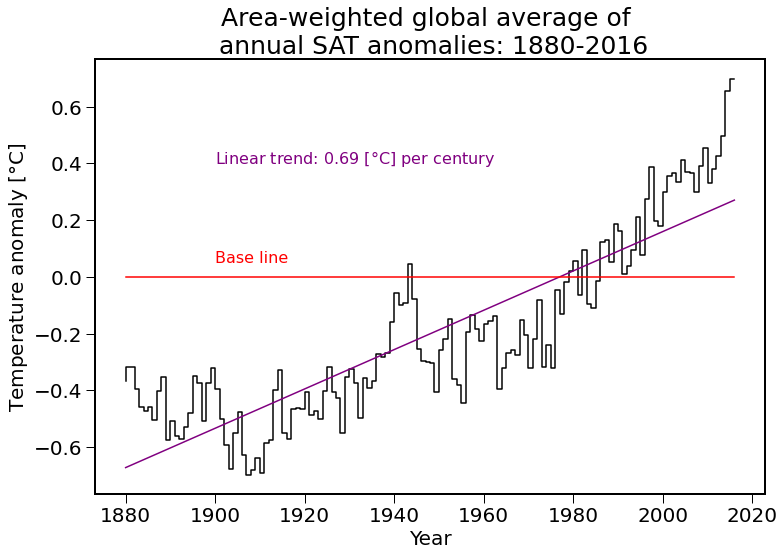

In [ ]:
#Fig 11.9
# compute annual average, then plot the annual mean global average temp
avem = np.reshape(avev[0 : 1644], (-1, 12)) 
avem.shape #size 137 * 12, with row for the year, column for the month

# average over columns (annual average over 12 months), 
# there are 137 years, 1880/01 - 2016/12
annv = np.mean(avem, axis = 1)  

# plot the annual mean global average temp (1880-1996)
timeyr = np.arange(1880, 2017)

plt.close()
plt.step(timeyr, annv, '-', color="black")
plt.title('Area-weighted global average of \n annual SAT anomalies: 1880-2016')
plt.xlabel('Year')
plt.ylabel('Temperature anomaly [$\degree$C]')

# plot linear regression
lm = LinearRegression()
lm.fit(timeyr.reshape(-1, 1), annv)
predictions = lm.predict(timeyr.reshape(-1 , 1))

plt.plot(timeyr, predictions, '-', color="purple")


# create text on plot
plt.text(1900, .4, 'Linear trend: 0.69 [$\degree$C] per century', color="purple", fontsize=16)
plt.text(1900, 0.05, 'Base line', color="red", fontsize=16)

# plot standard abline
plt.plot(timeyr, np.zeros(137), 'r-')

plt.show()

In [ ]:
# one can compare with the NOAAGlobalTemp annual time series
# there are some small differences
aveannNCEI = pd.read_table('http://shen.sdsu.edu/data/' + 
                          'aravg.ann.land_ocean.90S.90N.v4.0.1.201703.asc.txt', 
                          header = None, delim_whitespace = True)
aveannNCEI.shape 

aveannNCEI = aveannNCEI.values 
diff2 = np.subtract(annv, aveannNCEI[0 : 137, 1])

# find the value range (minimum and maximum values in diff2 array)
[np.amin(diff2, axis = 0), np.amax(diff2, axis = 0)] 

[-0.01609496875429861, 0.007508731446406958]

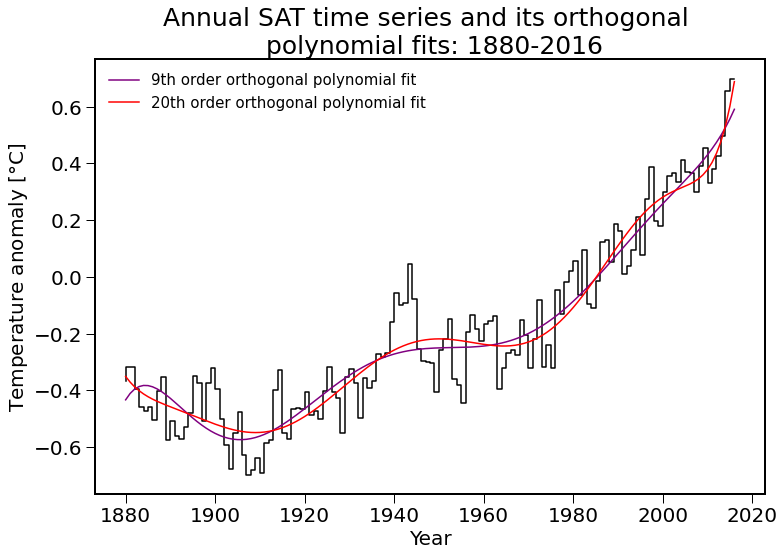

In [ ]:
#Fig 11.10
# polynomial fitting to the global average annual mean
# the following polynomial fitting from numpy.polyfit is NOT orthogonal, 
# we know orthogonal polynomial fitting is usually better as we saw in the R code implemention
polyor9 = np.polyfit(timeyr, annv, 9)
polyor20 = np.polyfit(timeyr, annv, 20)

plt.close()
plt.step(timeyr, annv, '-', color="black")
plt.title('Annual SAT time series and its orthogonal \n polynomial fits: 1880-2016')
plt.xlabel('Year')
plt.ylabel('Temperature anomaly [$\degree$C]')

# plot the first poly fit 
plt.plot(timeyr, np.polyval(polyor9, timeyr), "-", color="purple", 
         label = "9th order orthogonal polynomial fit")

# plot the second poly fit 
plt.plot(timeyr, np.polyval(polyor20, timeyr), "-r",  
         label = "20th order orthogonal polynomial fit")

plt.legend(loc = 'upper left')
plt.show()

_____
# 11.4 Spatial Characteristics of the Temperature Change Trends
______

In [ ]:
# Compute the trend for each box for the 20th century
timemo1 = np.linspace(1900, 2000, 1200)
temp1 = temp.copy()

# replace missing values (any value less than -490.00) with NaN in temp1 
# dataframe
temp1 = temp1.where(temp1 >= -490.0, np.NaN)
trendgl = np.zeros(2592)

# for grids in (Lon: 2.5-257.5, Lat: -87.5-87.5), perform linear regression 
# fitting on each grid temperature over months between Jan 1900 and Dec 1999
# linear slope cofficient will be saved in trendgl list to be used for 
# subsequent plotting 
for i in range(0, 2592):
    if not(np.isnan(temp1.iloc[i, 242]) or np.isnan(temp1.iloc[i, 1441])): 
        # column 242 corresponds to month 1990-01, 
        # and column 1441 corresponds to month 1999-12
        # temperature data for a grid from 1990-01 to 1999-12
        gridtemp = temp1.iloc[i, 242 : 1442].values 
        # filter out any month where grid temperature is missing 
        # (i.e., having a NaN value)
        idx = np.isfinite(timemo1) & np.isfinite(gridtemp) 
        # check if there is at least one month that has 
        # non-NaN number for linear regression
        if np.any(idx[:]): 
            ab = np.polyfit(timemo1[idx], gridtemp[idx], 1)
            # ab[0] has the linear regression slope coefficient
            trendgl[i] = ab[0] 
        else:
            trendgl[i] = np.NaN
    else:
        trendgl[i] = np.NaN


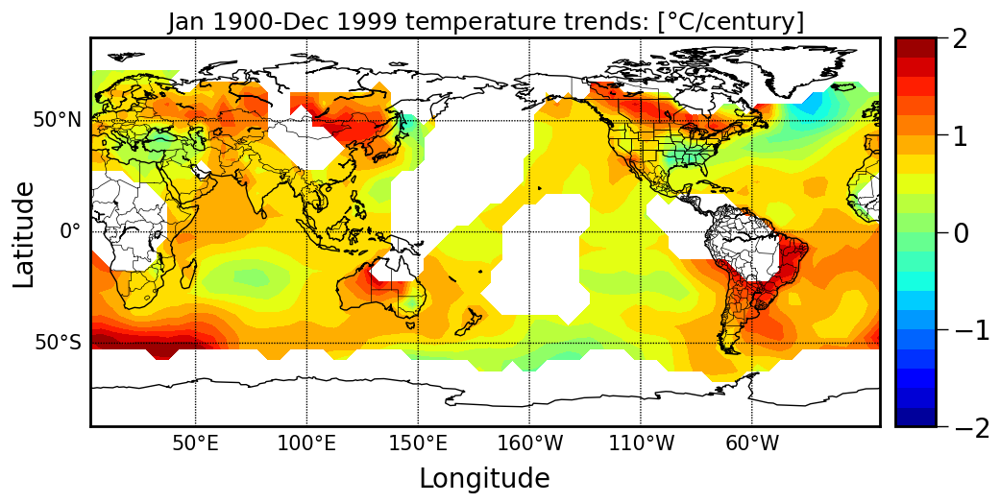

In [ ]:
#Fig 11.11
mapmat = np.reshape([n * 100 for n in trendgl], (-1, 72)) #36 X 72 

# this command compresses numbers to the range of -2 to 2 
mapmat = np.maximum(np.minimum(mapmat, 2), -2) 

# set up figure
dpi = 100
fig = plt.figure(figsize = (1100 / dpi, 1100 / dpi), dpi = dpi)
ax  = fig.add_axes([0.1, 0.1, 0.8, 0.9])

# create map
amap = Basemap(projection = 'cyl', llcrnrlat = -87.5, urcrnrlat = 87.5,
              resolution = 'c',  llcrnrlon = 2.5, urcrnrlon = 357.5)

# draw coastlines, state and country boundaries, edge of map
amap.drawcoastlines()
amap.drawstates()
amap.drawcountries()

# create and draw meridians and parallels grid lines
amap.drawparallels(np.arange( -50, 100, 50.),
                  labels = [1, 0, 0, 0], fontsize = 15)
amap.drawmeridians(np.arange(50, 350, 50.), 
                  labels = [0, 0, 0, 1], fontsize = 15)

# convert latitude/longitude values to plot x/y values
x, y = amap(*np.meshgrid(lon1, lat1))

# contour levels
clevs = np.linspace(-2, 2, 21)

# draw filled contours
cnplot = amap.contourf(x, y, mapmat, clevs, cmap = plt.cm.jet)

# add colorbar
# pad: distance between map and colorbar
cbar = amap.colorbar(cnplot, location = 'right', pad = "2%", ticks=[-2,-1,0,1,2])      
              
# add plot title
plt.title('Jan 1900-Dec 1999 temperature trends: [$\degree$C/century]', fontsize=18)

# label x and y
plt.xlabel('Longitude', labelpad = 30)
plt.ylabel('Latitude', labelpad = 40)

plt.show()

In [ ]:
# Compute trend for each box for the 20th century - Version 2: Allow 2/3 of data, i.e., 1/3 missing
# compute the trend and plot the 20C V2 trend map 
timemo1 = np.linspace(1900, 2000, 1200)
temp1 = temp.iloc[:, 242 : 1442]

# replace missing values (any value less than -490.00) 
# with NaN in temp1 dataframe
temp1 = temp1.where(temp1 >= -490.0, np.NaN)
temptf = np.isnan(temp1)

countOfNotMissing = np.zeros(2592)

# count the number of missing data points
for i in range(0, 2592):
    countOfNotMissing[i] = temptf.iloc[i, :].values.tolist().count(False)

trend20c = np.zeros(2592)
for i in range(0, 2592):
    if countOfNotMissing[i] > 800: # allow 2/3 of data, i.e., 1/3 missing
        # column 242 corresponds to month 1990-01, 
        # and column 1441 corresponds to month 1999-12
        gridtemp = temp1.iloc[i, :].values # temperature for a grid 
                                           # from 1990-01 to 1999-12
        # filter out any month where grid temperature is missing 
        # (i.e., having a NaN value)
        idx = np.isfinite(timemo1) & np.isfinite(gridtemp) 
        ab = np.polyfit(timemo1[idx], gridtemp[idx], 1)
        # ab[0] has the linear regression slope coefficient
        trend20c[i] = ab[0] 
    else:
        trend20c[i] = np.NaN
    

In [ ]:
temp1.shape

(2592, 1200)

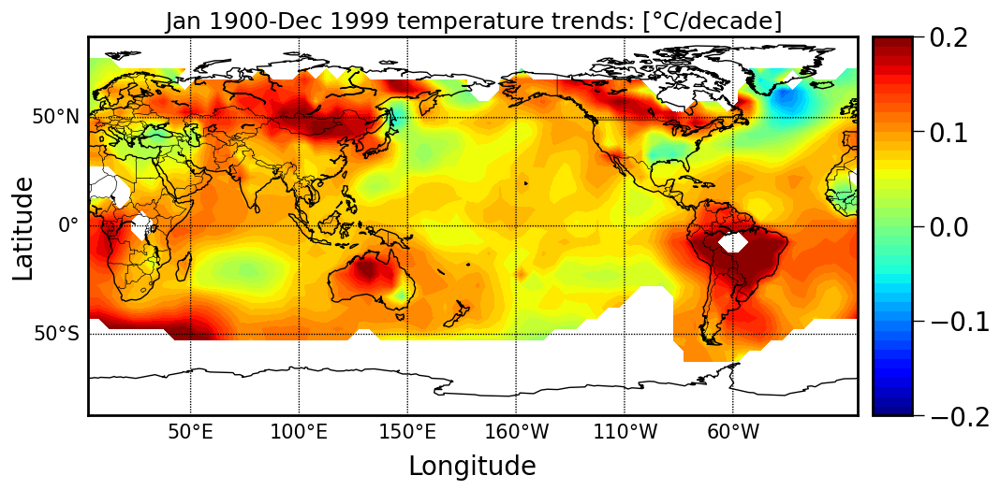

In [ ]:
#Fig 11.12
mapmat = np.reshape([n * 120 for n in trend20c], (-1, 72)) #36 X 72 
mapmat = mapmat/10

# this command compresses numbers to the range of -.2 to .2
mapmat = np.maximum(np.minimum(mapmat, .2), -.2)  

dpi = 100
fig = plt.figure(figsize = (1100 / dpi, 1100 / dpi), dpi = dpi)
ax  = fig.add_axes([0.1, 0.1, 0.8, 0.9])

# create map
fmap = Basemap(projection = 'cyl', llcrnrlat = -87.5, urcrnrlat = 87.5,
              resolution = 'c',  llcrnrlon = 2.5, urcrnrlon = 357.5)

# draw coastlines, state and country boundaries, edge of map
fmap.drawcoastlines()
fmap.drawcountries()

# create and draw meridians and parallels grid lines
fmap.drawparallels(np.arange( -50, 100, 50.), 
                  labels = [1, 0, 0, 0], fontsize = 15)
fmap.drawmeridians(np.arange(50, 350, 50.), 
                  labels = [0, 0, 0, 1], fontsize = 15)

# convert latitude/longitude values to plot x/y values
x, y = fmap(*np.meshgrid(lon1, lat1))

# contour levels
clevs = np.linspace(-.2, .2, 41)

# draw filled contours
cnplot = fmap.contourf(x, y, mapmat, clevs, cmap = plt.cm.jet)

# add colorbar
# pad: distance between map and colorbar
cbar = fmap.colorbar(cnplot, location = 'right', pad = "2%", ticks=[0.2,0.1,0,-0.1,-0.2])      

              
# add plot title
plt.title('Jan 1900-Dec 1999 temperature trends: [$\degree$C/decade]', fontsize=18)

# label x and y
plt.xlabel('Longitude', labelpad = 30)
plt.ylabel('Latitude', labelpad = 40)

plt.show()

In [ ]:
# compute trend for each box for the 20th century - Version 2: Allow 2/3 of data, i.e., 1/3 missing
# compute the trend and plot the 20C V2 trend map 
timemo1 = np.linspace(1976, 2016, 492)
temp1 = temp.iloc[:, 1154 : 1646]

# replace missing values (any value less than -490.00) 
# with NaN in temp1 dataframe
temp1 = temp1.where(temp1 >= -490.0, np.NaN)
temptf = np.isnan(temp1)

countOfNotMissing = np.zeros(2592)

for i in range(0, 2592):
    countOfNotMissing[i] = temptf.iloc[i, :].values.tolist().count(False)

trend20c = np.zeros(2592)
for i in range(0, 2592):
    if countOfNotMissing[i] > 320: # allow 2/3 of data, i.e., 1/3 missing
        # column 1154 corresponds to month 1976-01, 
        # and column 1646 corresponds to month 2016-12
        gridtemp = temp1.iloc[i, :].values # temperature for a grid 
                                           # from 2003-06 to 2016-12
        # filter out any month where grid temperature is missing 
        # (i.e., having a NaN value)
        idx = np.isfinite(timemo1) & np.isfinite(gridtemp) 
        ab = np.polyfit(timemo1[idx], gridtemp[idx], 1)
        # ab[0] has the linear regression slope coefficient
        trend20c[i] = ab[0] 
    else:
        trend20c[i] = np.NaN

In [ ]:
temp1.shape

(2592, 492)

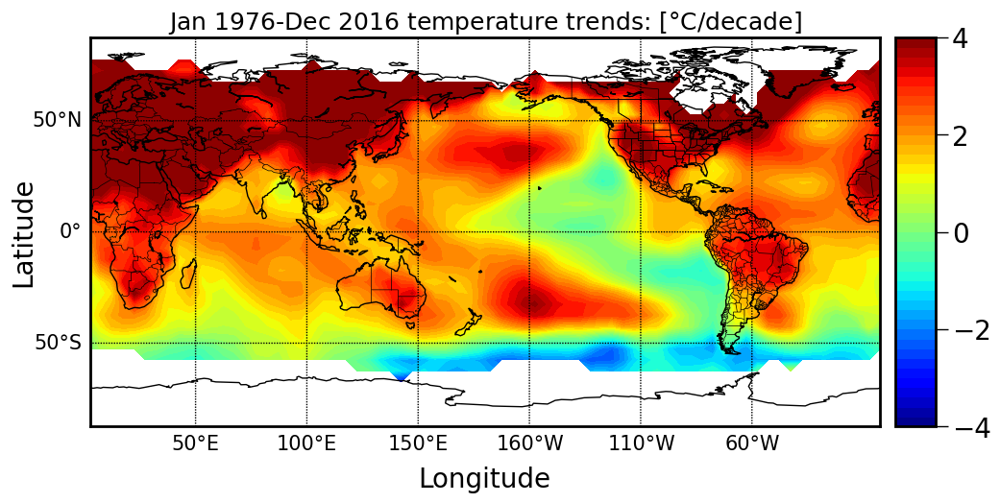

In [ ]:
#Fig 11.13
mapmat = np.reshape([n * 120 for n in trend20c], (-1, 72)) #36 X 72 
# this command compresses numbers to the range of -4 to 4
mapmat = np.maximum(np.minimum(mapmat, 4), -4)  

dpi = 100
fig = plt.figure(figsize = (1100 / dpi, 1100 / dpi), dpi = dpi)
ax  = fig.add_axes([0.1, 0.1, 0.8, 0.9])

# create map
fmap = Basemap(projection = 'cyl', llcrnrlat = -87.5, urcrnrlat = 87.5,
              resolution = 'c',  llcrnrlon = 2.5, urcrnrlon = 357.5)

# draw coastlines, state and country boundaries, edge of map
fmap.drawcoastlines()
fmap.drawstates()
fmap.drawcountries()

# create and draw meridians and parallels grid lines
fmap.drawparallels(np.arange( -50, 100, 50.), 
                  labels = [1, 0, 0, 0], fontsize = 15)
fmap.drawmeridians(np.arange(50, 350, 50.), 
                  labels = [0, 0, 0, 1], fontsize = 15)

# convert latitude/longitude values to plot x/y values
x, y = fmap(*np.meshgrid(lon1, lat1))

# contour levels
clevs = np.linspace(-4, 4, 41)

# draw filled contours
cnplot = fmap.contourf(x, y, mapmat, clevs, cmap = plt.cm.jet)

# add colorbar
# pad: distance between map and colorbar
cbar = fmap.colorbar(cnplot, location = 'right', pad = "2%", ticks=[-4,-2,0,2,4])      

              
# add plot title
plt.title('Jan 1976-Dec 2016 temperature trends: [$\degree$C/decade]', fontsize=18)

# label x and y
plt.xlabel('Longitude', labelpad = 30)
plt.ylabel('Latitude', labelpad = 40)

plt.show()